In [1]:
import math
import xarray as xr
import cartopy.crs as ccrs
import matplotlib as mpl
from matplotlib import pyplot as plt 
import matplotlib.pylab as plt
import matplotlib.path as mpath
from matplotlib.pyplot import figure
import numpy as np
import cartopy.feature as cfeature
from matplotlib.cm import get_cmap
import pyproj
import utm
import pandas as pd 
import traceback 
from pathlib import Path  
import os  
import numpy.ma as ma
import netCDF4 as nc
from netCDF4 import Dataset
import glob
import datetime as dt
import metpy.calc as mpcalc
from metpy.units import units
from metpy.cbook import get_test_data
from metpy.io import metar
from metpy.plots.declarative import (BarbPlot, ContourPlot, FilledContourPlot, MapPanel,
                                     PanelContainer, PlotObs)
from netCDF4 import date2num,num2date
#from scipy.ndimage import gaussian_filter
import wrf
from wrf import (getvar, interplevel, to_np, latlon_coords, get_cartopy,
                 cartopy_xlim, cartopy_ylim)
from wrf import getvar, interplevel, to_np, get_basemap, latlon_coords

In [2]:
wrfout0 = Dataset('wrfout_d03_2018-03-25_00_00_00')
wrfout1 = Dataset('wrfout_d03_2018-03-25_01_00_00')
wrfout2 = Dataset('wrfout_d03_2018-03-25_02_00_00')
wrfout3 = Dataset('wrfout_d03_2018-03-25_03_00_00')
wrfout4 = Dataset('wrfout_d03_2018-03-25_04_00_00')
wrfout5 = Dataset('wrfout_d03_2018-03-25_05_00_00')
wrfout6 = Dataset('wrfout_d03_2018-03-25_06_00_00')

#wrfout0_2 = Dataset('wrfout_d02_2018-03-25_00_00_00')
#wrfout1_2 = Dataset('wrfout_d02_2018-03-25_01_00_00')
#wrfout2_2 = Dataset('wrfout_d02_2018-03-25_02_00_00')
#wrfout3_2 = Dataset('wrfout_d02_2018-03-25_03_00_00')
#wrfout4_2 = Dataset('wrfout_d02_2018-03-25_04_00_00')
#wrfout5_2 = Dataset('wrfout_d02_2018-03-25_05_00_00')
#wrfout6_2 = Dataset('wrfout_d02_2018-03-25_06_00_00')

#wrfout0_1 = Dataset('wrfout_d01_2018-03-25_00_00_00')
#wrfout1_1 = Dataset('wrfout_d01_2018-03-25_01_00_00')
#wrfout2_1 = Dataset('wrfout_d01_2018-03-25_02_00_00')
#wrfout3_1 = Dataset('wrfout_d01_2018-03-25_03_00_00')
#wrfout4_1 = Dataset('wrfout_d01_2018-03-25_04_00_00')
#wrfout5_1 = Dataset('wrfout_d01_2018-03-25_05_00_00')
#wrfout6_1 = Dataset('wrfout_d01_2018-03-25_06_00_00')

In [3]:
#print(wrfout.keys)
#print('\n\n', wrfout0.variables)
#print('\n\n', wrfout1.variables)
#print('\n\n', wrfout2.variables)
print('\n\n', wrfout3.variables)
#print('\n\n', wrfout4.variables)
#print('\n\n', wrfout5.variables)
#print('\n\n', wrfout6.variables)



 {'Times': <class 'netCDF4._netCDF4.Variable'>
|S1 Times(Time, DateStrLen)
unlimited dimensions: Time
current shape = (1, 19)
filling on, default _FillValue of   used, 'XLAT': <class 'netCDF4._netCDF4.Variable'>
float32 XLAT(Time, south_north, west_east)
    FieldType: 104
    MemoryOrder: XY 
    description: LATITUDE, SOUTH IS NEGATIVE
    units: degree_north
    stagger: 
    coordinates: XLONG XLAT
unlimited dimensions: Time
current shape = (1, 474, 639)
filling on, default _FillValue of 9.969209968386869e+36 used, 'XLONG': <class 'netCDF4._netCDF4.Variable'>
float32 XLONG(Time, south_north, west_east)
    FieldType: 104
    MemoryOrder: XY 
    description: LONGITUDE, WEST IS NEGATIVE
    units: degree_east
    stagger: 
    coordinates: XLONG XLAT
unlimited dimensions: Time
current shape = (1, 474, 639)
filling on, default _FillValue of 9.969209968386869e+36 used, 'LU_INDEX': <class 'netCDF4._netCDF4.Variable'>
float32 LU_INDEX(Time, south_north, west_east)
    FieldType: 104
 

In [3]:
#thetae
#'T': <xarray.Variable (Time: 1, bottom_top: 49, south_north: 474, west_east: 639)>
#    description:  perturbation potential temperature theta-t0
#    units:        K

#humidity

#'U': <xarray.Variable (Time: 1, bottom_top: 49, south_north: 474, west_east_stag: 640)>
#    units:        m s-1
#'V': <xarray.Variable (Time: 1, bottom_top: 49, south_north_stag: 475, west_east: 639)>
#    units:        m s-1
#'W': <xarray.Variable (Time: 1, bottom_top_stag: 50, south_north: 474, west_east: 639)>
#    units:        m s-1
    
#SST - SST, Time: 1, south_north: 474, west_east: 639   in K 

#VOCE - wrfin only, no out
#UOCE - wrfin only, no out

#'XLAT': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
#    description:  LATITUDE, SOUTH IS NEGATIVE
#    units:        degree_north
#'XLONG': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
#    description:  LONGITUDE, WEST IS NEGATIVE
#    units:        degree_east
#XLAT_U': <xarray.Variable (Time: 1, south_north: 474, west_east_stag: 640)>
#   description:  LATITUDE, SOUTH IS NEGATIVE
#   units:        degree_north
#XLONG_U': <xarray.Variable (Time: 1, south_north: 474, west_east_stag: 640)>
#   description:  LONGITUDE, WEST IS NEGATIVE
#   units:        degree_east
#'XLAT_V': <xarray.Variable (Time: 1, south_north_stag: 475, west_east: 639)>
#   description:  LATITUDE, SOUTH IS NEGATIVE
 #  units:        degree_north
#XLONG_V': <xarray.Variable (Time: 1, south_north_stag: 475, west_east: 639)>


#'PBLH': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
#    units:        m

#@ 0km, 0.5km, 1km. & free

uwind0 = getvar(wrfout0, "U")
vwind0 = getvar(wrfout0, 'V')
sst0 = getvar(wrfout0, "SST")
pblh0 = getvar(wrfout0, "PBLH")
xlat0 =getvar(wrfout0, "XLAT")
xlon0 = getvar(wrfout0, "XLONG")
xlatu0 = getvar(wrfout0, "XLAT_U")
xlonu0 =getvar(wrfout0, "XLONG_U")
xlatv0 = getvar(wrfout0, "XLAT_V")
xlonv0 = getvar(wrfout0, "XLONG_V")
uwind1 = getvar(wrfout1, "U")
vwind1 = getvar(wrfout1, 'V')
sst1 = getvar(wrfout1, "SST")
pblh1 = getvar(wrfout1, "PBLH")
xlat1 =getvar(wrfout1, "XLAT")
xlon1 = getvar(wrfout1, "XLONG")
xlatu1 = getvar(wrfout1, "XLAT_U")
xlonu1 =getvar(wrfout1, "XLONG_U")
xlatv1 = getvar(wrfout1, "XLAT_V")
xlonv1 = getvar(wrfout1, "XLONG_V")
uwind2 = getvar(wrfout2, "U")
vwind2 = getvar(wrfout2, 'V')
sst2 = getvar(wrfout2, "SST")
pblh2 = getvar(wrfout2, "PBLH")
xlat2 =getvar(wrfout2, "XLAT")
xlon2 = getvar(wrfout2, "XLONG")
xlatu2 = getvar(wrfout2, "XLAT_U")
xlonu2 =getvar(wrfout2, "XLONG_U")
xlatv2 = getvar(wrfout2, "XLAT_V")
xlonv2 = getvar(wrfout2, "XLONG_V")
uwind3 = getvar(wrfout3, "U")
vwind3 = getvar(wrfout3, 'V')
sst3 = getvar(wrfout3, "SST")
pblh3 = getvar(wrfout3, "PBLH")
xlat3 =getvar(wrfout3, "XLAT")
xlon3 = getvar(wrfout3, "XLONG")
xlatu3 = getvar(wrfout3, "XLAT_U")
xlonu3 =getvar(wrfout3, "XLONG_U")
xlatv3 = getvar(wrfout3, "XLAT_V")
xlonv3 = getvar(wrfout3, "XLONG_V")
uwind4 = getvar(wrfout4, "U")
vwind4 = getvar(wrfout4, 'V')
sst4 = getvar(wrfout4, "SST")
pblh4 = getvar(wrfout4, "PBLH")
xlat4 =getvar(wrfout4, "XLAT")
xlon4 = getvar(wrfout4, "XLONG")
xlatu4 = getvar(wrfout4, "XLAT_U")
xlonu4 =getvar(wrfout4, "XLONG_U")
xlatv4 = getvar(wrfout4, "XLAT_V")
xlonv4 = getvar(wrfout4, "XLONG_V")
uwind5 = getvar(wrfout5, "U")
vwind5 = getvar(wrfout5, 'V')
sst5 = getvar(wrfout5, "SST")
pblh5 = getvar(wrfout5, "PBLH")
xlat5 =getvar(wrfout5, "XLAT")
xlon5 = getvar(wrfout5, "XLONG")
xlatu5 = getvar(wrfout5, "XLAT_U")
xlonu5 =getvar(wrfout5, "XLONG_U")
xlatv5 = getvar(wrfout5, "XLAT_V")
xlonv5 = getvar(wrfout5, "XLONG_V")
uwind6 = getvar(wrfout6, "U")
vwind6 = getvar(wrfout6, 'V')
sst6 = getvar(wrfout6, "SST")
pblh6 = getvar(wrfout6, "PBLH")
xlat6 =getvar(wrfout6, "XLAT")
xlon6 = getvar(wrfout6, "XLONG")
xlatu6 = getvar(wrfout6, "XLAT_U")
xlonu6 =getvar(wrfout6, "XLONG_U")
xlatv6 = getvar(wrfout6, "XLAT_V")
xlonv6 = getvar(wrfout6, "XLONG_V")

uwind_destag0 = wrf.destagger(uwind0, stagger_dim = 2)
vwind_destag0 = wrf.destagger(vwind0, stagger_dim = 1)
w_speed0 = np.sqrt((uwind_destag0**2)+(vwind_destag0**2))
xlatu_destag0 = wrf.destagger(xlatu0, stagger_dim =1)
xlonu_destag0 = wrf.destagger(xlonu0, stagger_dim =1)
xlatv_destag0 = wrf.destagger(xlatv0, stagger_dim =0)
xlonv_destag0 = wrf.destagger(xlonv0, stagger_dim =0)
uwind_destag1 = wrf.destagger(uwind1, stagger_dim = 2)
vwind_destag1 = wrf.destagger(vwind1, stagger_dim = 1)
w_speed1 = np.sqrt((uwind_destag1**2)+(vwind_destag1**2))
xlatu_destag1 = wrf.destagger(xlatu1, stagger_dim =1)
xlonu_destag1 = wrf.destagger(xlonu1, stagger_dim =1)
xlatv_destag1 = wrf.destagger(xlatv1, stagger_dim =0)
xlonv_destag1 = wrf.destagger(xlonv1, stagger_dim =0)
uwind_destag2 = wrf.destagger(uwind2, stagger_dim = 2)
vwind_destag2 = wrf.destagger(vwind2, stagger_dim = 1)
w_speed2 = np.sqrt((uwind_destag2**2)+(vwind_destag2**2))
xlatu_destag2 = wrf.destagger(xlatu2, stagger_dim =1)
xlonu_destag2 = wrf.destagger(xlonu2, stagger_dim =1)
xlatv_destag2 = wrf.destagger(xlatv2, stagger_dim =0)
xlonv_destag2 = wrf.destagger(xlonv2, stagger_dim =0)
uwind_destag3 = wrf.destagger(uwind3, stagger_dim = 2)
vwind_destag3 = wrf.destagger(vwind3, stagger_dim = 1)
w_speed3 = np.sqrt((uwind_destag3**2)+(vwind_destag3**2))
xlatu_destag3 = wrf.destagger(xlatu3, stagger_dim =1)
xlonu_destag3 = wrf.destagger(xlonu3, stagger_dim =1)
xlatv_destag3 = wrf.destagger(xlatv3, stagger_dim =0)
xlonv_destag3 = wrf.destagger(xlonv3, stagger_dim =0)
uwind_destag4 = wrf.destagger(uwind4, stagger_dim = 2)
vwind_destag4 = wrf.destagger(vwind4, stagger_dim = 1)
w_speed4 = np.sqrt((uwind_destag4**2)+(vwind_destag4**2))
xlatu_destag4 = wrf.destagger(xlatu4, stagger_dim =1)
xlonu_destag4 = wrf.destagger(xlonu4, stagger_dim =1)
xlatv_destag4 = wrf.destagger(xlatv4, stagger_dim =0)
xlonv_destag4 = wrf.destagger(xlonv4, stagger_dim =0)
uwind_destag5 = wrf.destagger(uwind5, stagger_dim = 2)
vwind_destag5 = wrf.destagger(vwind5, stagger_dim = 1)
w_speed5 = np.sqrt((uwind_destag5**2)+(vwind_destag5**2))
xlatu_destag5 = wrf.destagger(xlatu5, stagger_dim =1)
xlonu_destag5 = wrf.destagger(xlonu5, stagger_dim =1)
xlatv_destag5 = wrf.destagger(xlatv5, stagger_dim =0)
xlonv_destag5 = wrf.destagger(xlonv5, stagger_dim =0)
uwind_destag6 = wrf.destagger(uwind6, stagger_dim = 2)
vwind_destag6 = wrf.destagger(vwind6, stagger_dim = 1)
w_speed6 = np.sqrt((uwind_destag6**2)+(vwind_destag6**2))
xlatu_destag6 = wrf.destagger(xlatu6, stagger_dim =1)
xlonu_destag6 = wrf.destagger(xlonu6, stagger_dim =1)
xlatv_destag6 = wrf.destagger(xlatv6, stagger_dim =0)
xlonv_destag6 = wrf.destagger(xlonv6, stagger_dim =0)


#stagger:, 'QVAPOR': <xarray.Variable (Time: 1, bottom_top: 49, south_north: 474, west_east: 639)>
#vapor mixing ratio,    units:        kg kg-1
qv0 = getvar(wrfout0, 'QVAPOR')
qv1 = getvar(wrfout1, 'QVAPOR')
qv2 = getvar(wrfout2, 'QVAPOR')
qv3 = getvar(wrfout3, 'QVAPOR')
qv4 = getvar(wrfout4, 'QVAPOR')
qv5 = getvar(wrfout5, 'QVAPOR')
qv6 = getvar(wrfout6, 'QVAPOR')
print('qv shape: ', qv0.shape)

#to make np array:
#uwind_np=to_np(uwind)

print('u wind shape: ', uwind0.shape)
print('v wind shape: ', vwind0.shape)
print('u wind destag: ', uwind_destag0.shape)
print('v wind destag: ', vwind_destag0.shape)
print('w_speed shape: ', w_speed0.shape)
print('xlatu shape:', xlatu0.shape)
print('xlonu shape:', xlonu0.shape)
print('xlatv shape:', xlatv0.shape)
print('xlonv shape:', xlonv0.shape)
print('xlatu destag:', xlatu_destag0.shape)
print('xlonu destag:', xlonu_destag0.shape)
print('xlatv destag:', xlatv_destag0.shape)
print('xlonv destag:', xlonv_destag0.shape)

print('\nsst shape: ', sst0.shape)
print('pblh shape:', pblh0.shape)
print('nxlat shape:', xlat0.shape)
print('xlon shape:', xlon0.shape)
print('\nbottom_top: ', vwind0[:, 0, 0])

#uwind: xlatu, xlonu
#vwind: xlatv, xlonv
#thetae: xlat & xlon
#SST: xlat & xlon
#PBLH: xlat & xlon


#filling on, default _FillValue of 9.969209968386869e+36 used, 'ZNU': <class 'netCDF4._netCDF4.Variable'>
#float32 ZNU(Time, bottom_top)
#    FieldType: 104
#    MemoryOrder: Z  
#    description: eta values on half (mass) levels
#    units: 
#    stagger: 
#unlimited dimensions: Time
#current shape = (1, 49)

#filling on, default _FillValue of 9.969209968386869e+36 used, 'PH': <class 'netCDF4._netCDF4.Variable'>
#float32 PH(Time, bottom_top_stag, south_north, west_east)
#    FieldType: 104
#    MemoryOrder: XYZ
#    description: perturbation geopotential
#    units: m2 s-2
#    stagger: Z
#    coordinates: XLONG XLAT XTIME
#unlimited dimensions: Time
#current shape = (1, 50, 474, 639)
#filling on, default _FillValue of 9.969209968386869e+36 used, 'PHB': <class 'netCDF4._netCDF4.Variable'>
#float32 PHB(Time, bottom_top_stag, south_north, west_east)
#    FieldType: 104
#    MemoryOrder: XYZ
#    description: base-state geopotential
#    units: m2 s-2
#    stagger: Z
#    coordinates: XLONG XLAT XTIME
#unlimited dimensions: Time
#current shape = (1, 50, 474, 639)

qv shape:  (49, 474, 639)
u wind shape:  (49, 474, 640)
v wind shape:  (49, 475, 639)
u wind destag:  (49, 474, 639)
v wind destag:  (49, 474, 639)
w_speed shape:  (49, 474, 639)
xlatu shape: (474, 640)
xlonu shape: (474, 640)
xlatv shape: (475, 639)
xlonv shape: (475, 639)
xlatu destag: (474, 639)
xlonu destag: (474, 639)
xlatv destag: (474, 639)
xlonv destag: (474, 639)

sst shape:  (474, 639)
pblh shape: (474, 639)
nxlat shape: (474, 639)
xlon shape: (474, 639)

bottom_top:  <xarray.DataArray 'V' (bottom_top: 49)>
array([  6.2779984 ,   6.8131223 ,   7.299643  ,   7.5213523 ,
         7.866425  ,   8.044746  ,   8.351912  ,   8.579857  ,
         8.572888  ,   8.250732  ,   7.4653535 ,   6.3994193 ,
         5.523848  ,   4.765041  ,   4.181171  ,   3.901531  ,
         3.6453865 ,   3.0907712 ,   2.1235685 ,   0.75434947,
        -0.8137702 ,  -2.1909947 ,  -3.24586   ,  -3.965863  ,
        -4.712734  ,  -5.6181417 ,  -6.406442  ,  -5.5000315 ,
        -4.405927  ,  -5.0085325 ,  

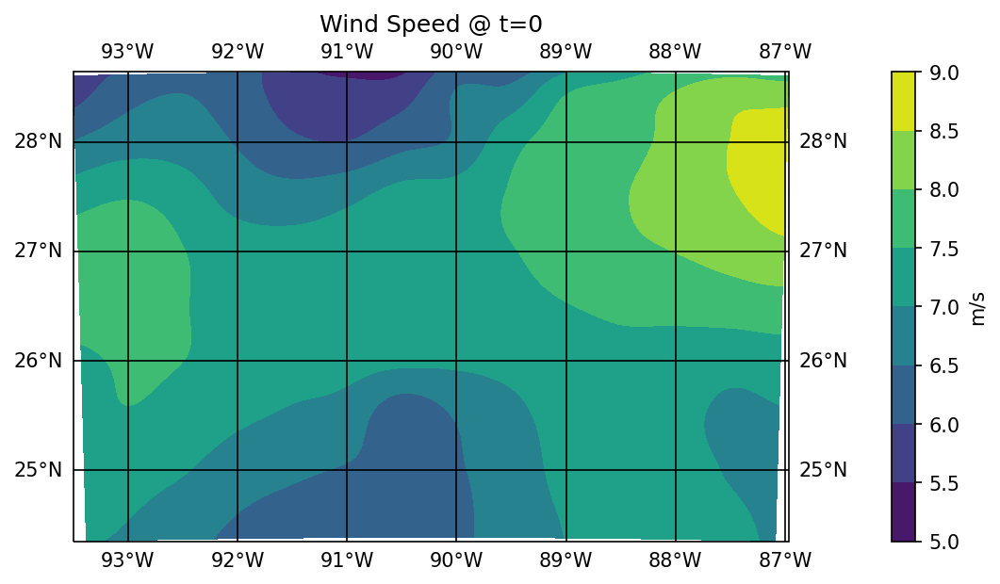

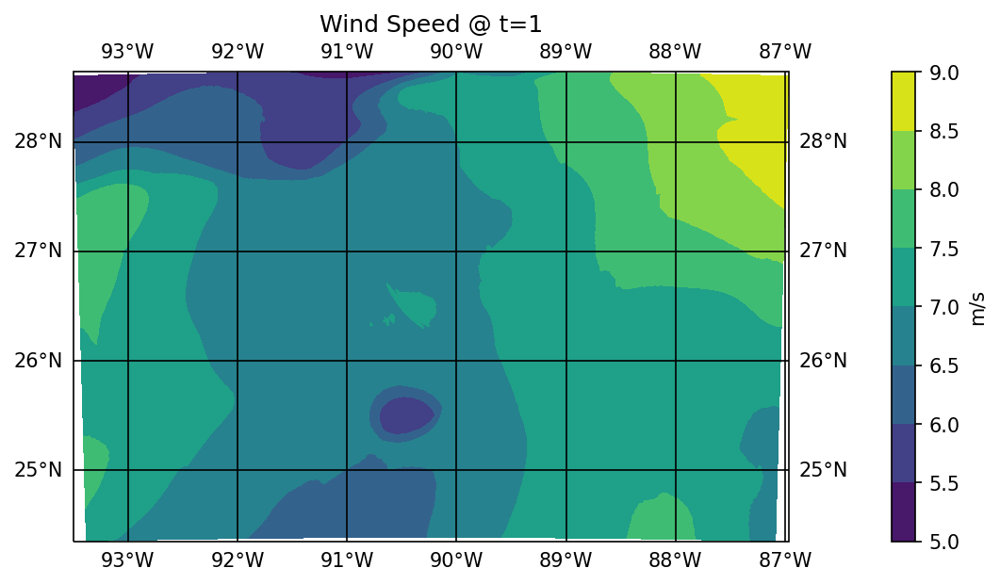

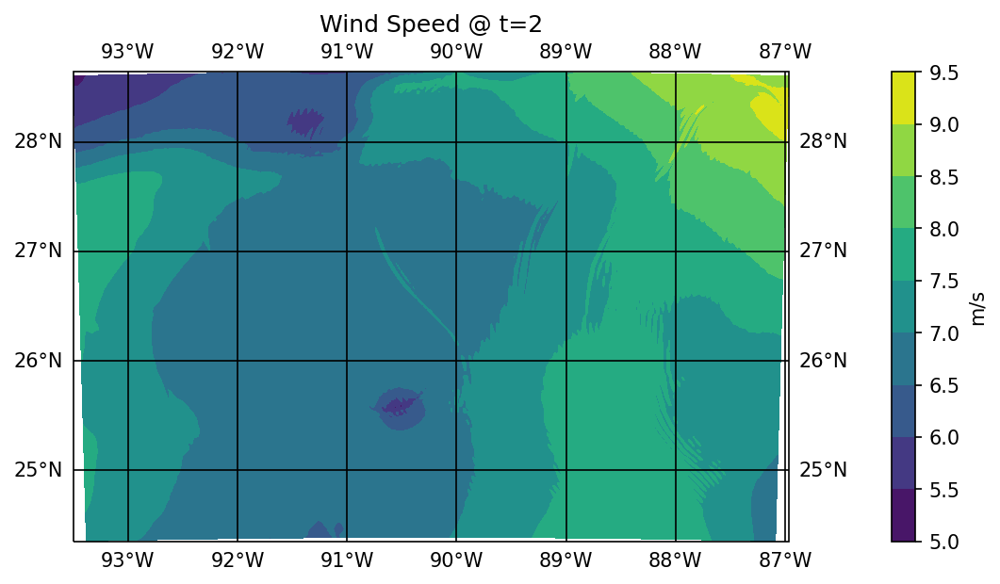

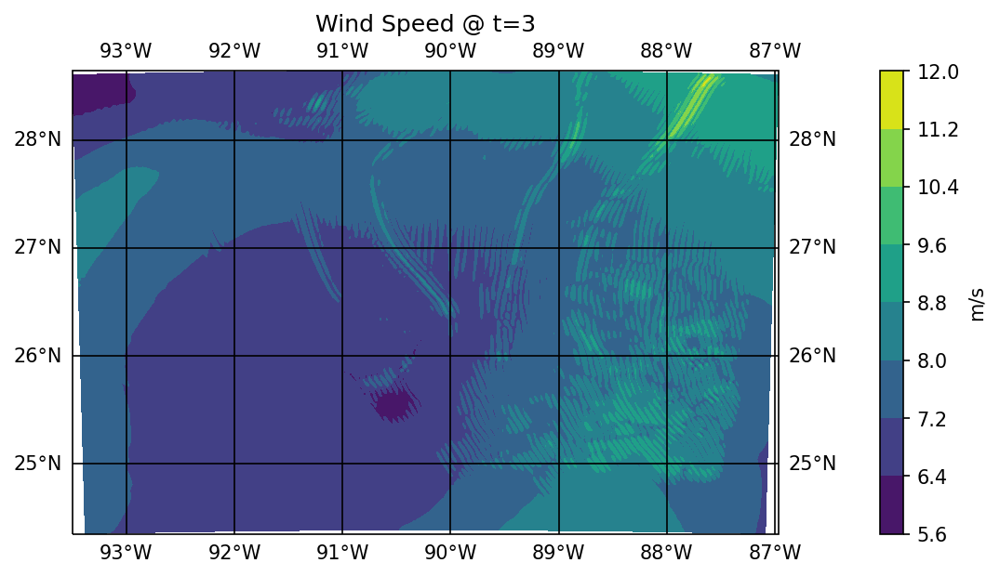

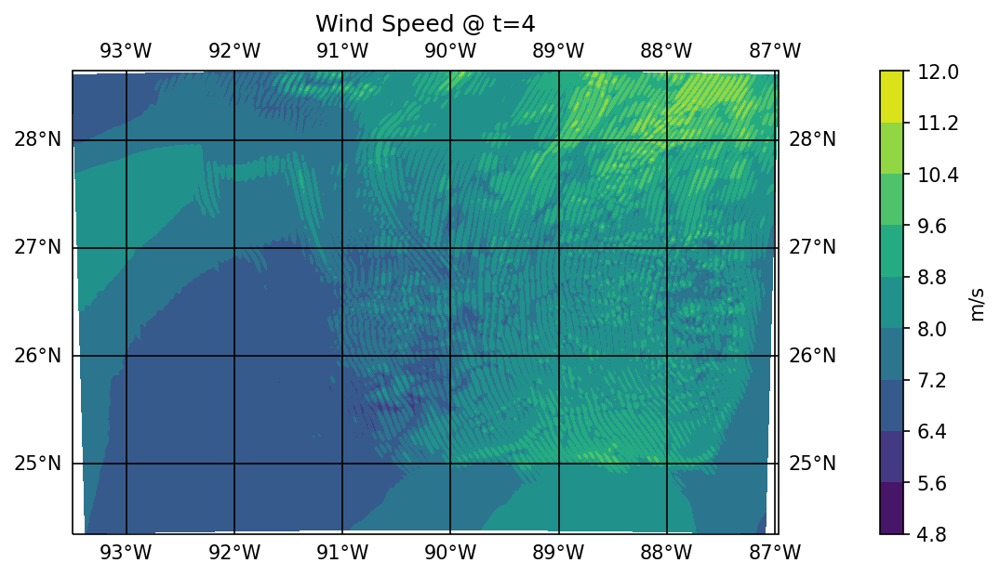

...

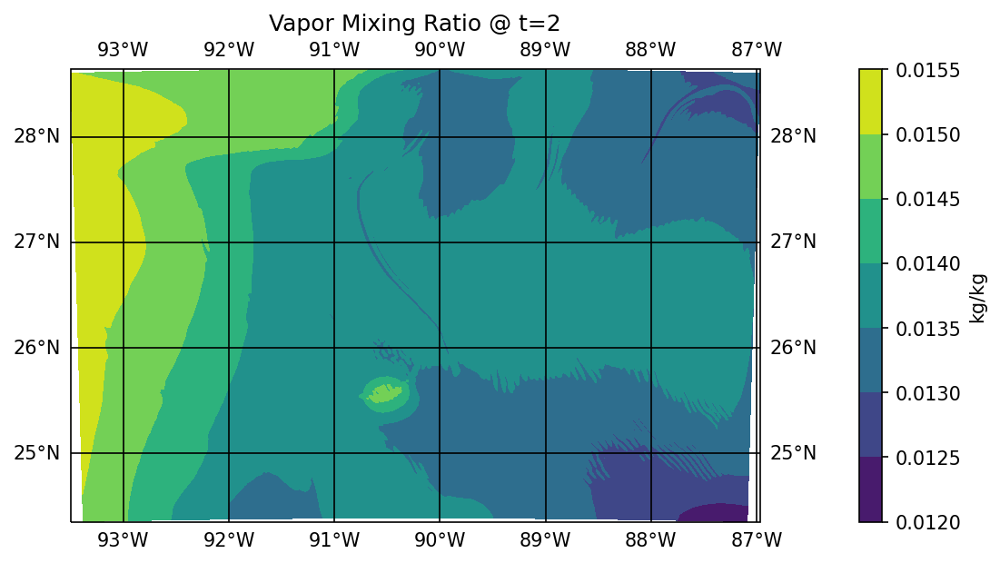

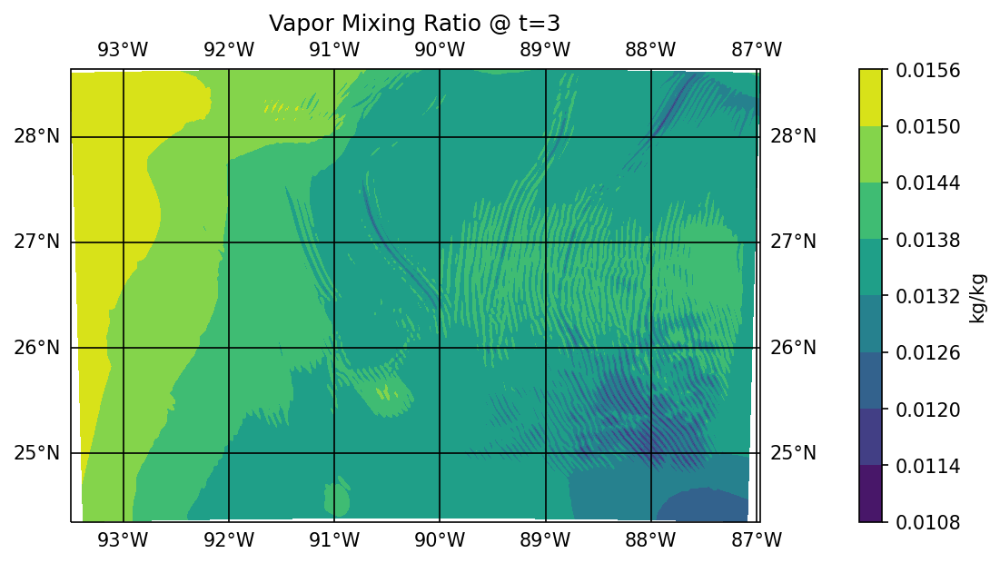

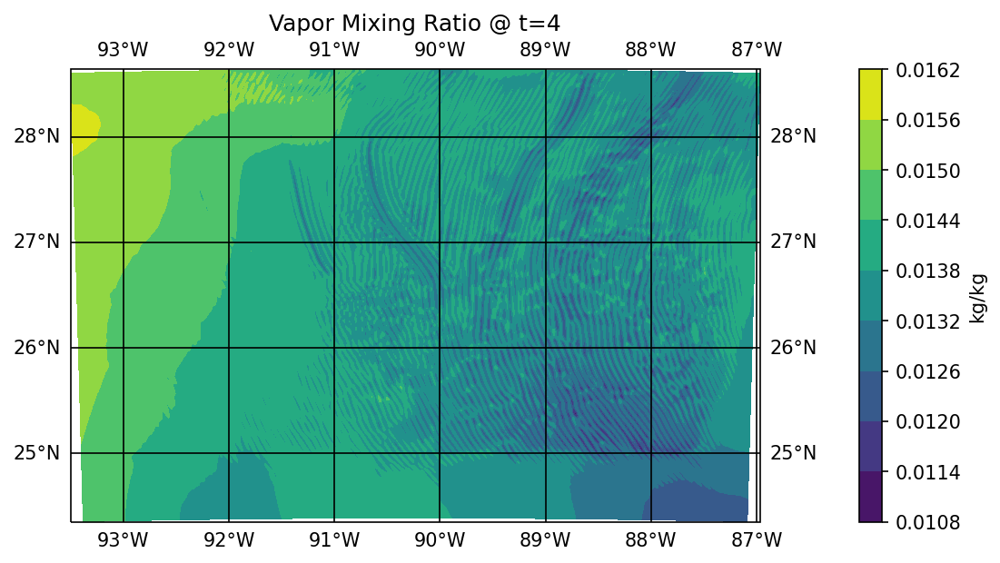

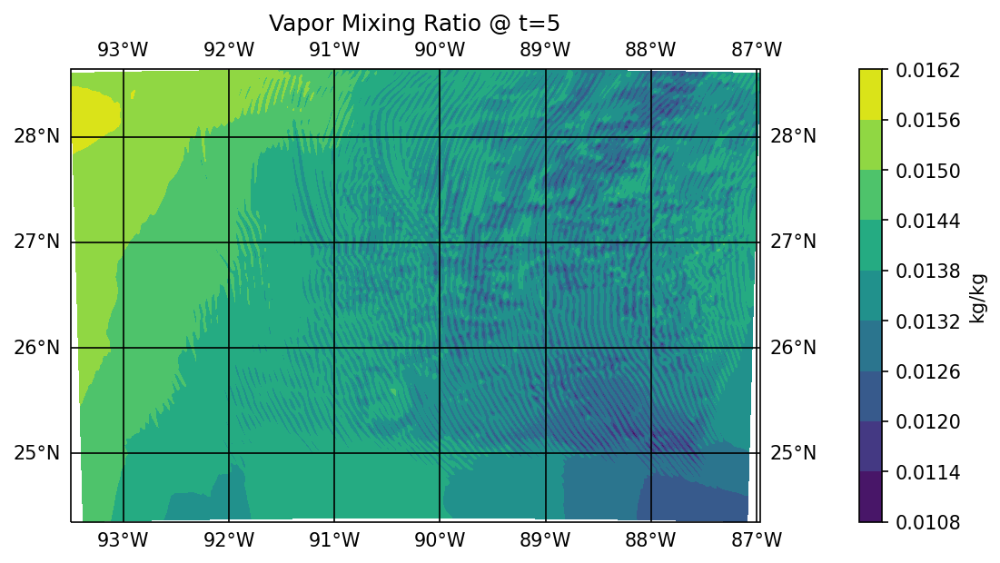

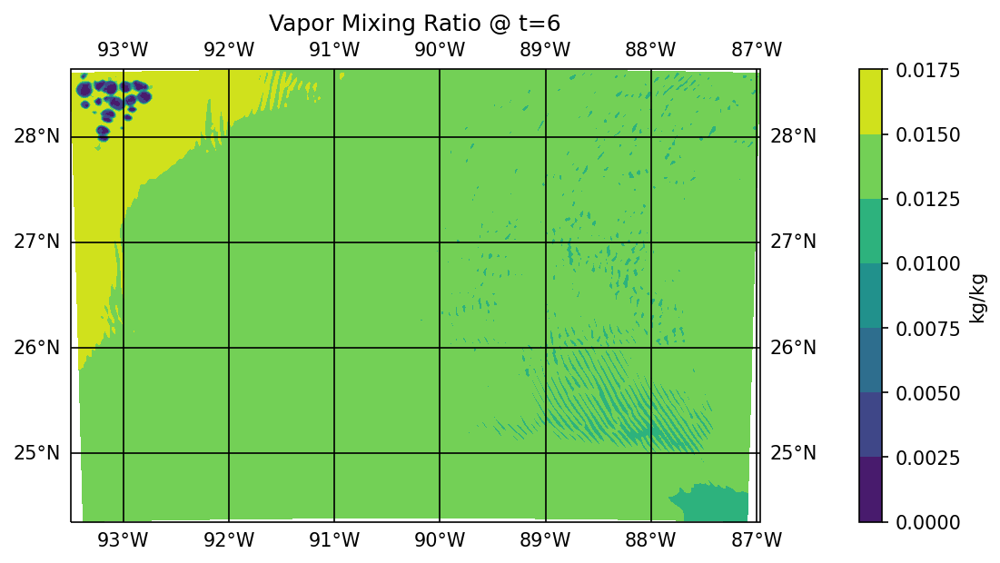

In [7]:
'''
#Uwind
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlonu0[:,:], xlatu[:,:], uwind[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('u Wind')
plt.show()

#Vwind
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlonv[:,:], xlatv[:,:], vwind[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('v Wind')
plt.show()
'''
#wind speed
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], w_speed0[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Speed @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'WindSpeed0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], w_speed1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Speed @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'WindSpeed1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], w_speed2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Speed @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'WindSpeed2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], w_speed3[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Speed @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'WindSpeed3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], w_speed4[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Speed @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'WindSpeed4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], w_speed5[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Speed @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'WindSpeed5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], w_speed6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Speed @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'WindSpeed6.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
#SST
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], sst0[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SST @ t=0')
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], sst1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SST @ t=1')
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], sst2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SST @ t=2')
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], sst3[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SST @ t=3')
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], sst4[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SST @ t=4')
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], sst5[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SST @ t=5')
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], sst6[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SST @ t=6')
plt.show()

#PBLH
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], pblh0[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'PBLH_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], pblh1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'PBLH_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], pblh2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'PBLH_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], pblh3[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'PBLH_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], pblh4[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'PBLH_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], pblh5[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'PBLH_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], pblh6[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'PBLH_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''

#Vapor Mixing Ratio
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], qv0[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'QV_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], qv1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'QV_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], qv2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'QV_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], qv3[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'QV_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], qv4[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'QV_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], qv5[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'QV_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], qv6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'QV_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()


In [5]:
#Potential temperature (perturbation plus reference temperature)

pert_t0 =getvar(wrfout0, 'T')
pert_t1 =getvar(wrfout1, 'T')
pert_t2 =getvar(wrfout2, 'T')
pert_t3 =getvar(wrfout3, 'T')
pert_t4 =getvar(wrfout4, 'T')
pert_t5 =getvar(wrfout5, 'T')
pert_t6 =getvar(wrfout6, 'T')

#'T00': <class 'netCDF4._netCDF4.Variable'>
#float32 T00(Time)
#    FieldType: 104
#    MemoryOrder: 0  
#    description: BASE STATE TEMPERATURE
#    units: K
#    stagger: 
#unlimited dimensions: Time

#reference T
ref_t0 =getvar(wrfout0, 'T00')
ref_t1 =getvar(wrfout1, 'T00')
ref_t2 =getvar(wrfout2, 'T00')
ref_t3 =getvar(wrfout3, 'T00')
ref_t4 =getvar(wrfout4, 'T00')
ref_t5 =getvar(wrfout5, 'T00')
ref_t6 =getvar(wrfout6, 'T00')

#full T
full_t0 = pert_t0 + ref_t0 
full_t1 = pert_t1 + ref_t1 
full_t2 = pert_t2 + ref_t2 
full_t3 = pert_t3 + ref_t3 
full_t4 = pert_t4 + ref_t4 
full_t5 = pert_t5 + ref_t5
full_t6 = pert_t6 + ref_t6

pert_p0 = getvar(wrfout0, 'P')
pert_p1 = getvar(wrfout1, 'P')
pert_p2 = getvar(wrfout2, 'P')
pert_p3 = getvar(wrfout3, 'P')
pert_p4 = getvar(wrfout4, 'P')
pert_p5 = getvar(wrfout5, 'P')
pert_p6 = getvar(wrfout6, 'P')
#stagger:, 'P': <xarray.Variable (Time: 1, bottom_top: 49, south_north: 474, west_east: 639
#description:  perturbation pressure,    units:        Pa

base_p0 = getvar(wrfout0, 'P00')
base_p1 = getvar(wrfout1, 'P00')
base_p2 = getvar(wrfout2, 'P00')
base_p3 = getvar(wrfout3, 'P00')
base_p4 = getvar(wrfout4, 'P00')
base_p5 = getvar(wrfout5, 'P00')
base_p6 = getvar(wrfout6, 'P00')
#stagger:      , 'P00': <xarray.Variable (Time: 1)>
#description:  BASE STATE PRESSURE,    units:        Pa

full_p0 = pert_p0 + base_p0 
full_p1 = pert_p1 + base_p1 
full_p2 = pert_p2 + base_p2 
full_p3 = pert_p3 + base_p3 
full_p4 = pert_p4 + base_p4 
full_p5 = pert_p5 + base_p5
full_p6 = pert_p6 + base_p6

#wrf.tk(pres, theta, meta=True, units='K')
temp0 = wrf.tk(full_p0, full_t0, meta=True, units='K')
temp1 = wrf.tk(full_p1, full_t1, meta=True, units='K')
temp2 = wrf.tk(full_p2, full_t2, meta=True, units='K')
temp3 = wrf.tk(full_p3, full_t3, meta=True, units='K')
temp4 = wrf.tk(full_p4, full_t4, meta=True, units='K')
temp5 = wrf.tk(full_p5, full_t5, meta=True, units='K')
temp6 = wrf.tk(full_p6, full_t6, meta=True, units='K')

#qv = Water vapor mixing ratio in [kg/kg] with at least three dimensions. The rightmost dimensions are bottom_top x south_north x west_east.
#pres = Full pressure (perturbation + base state pressure) in [Pa] with the same dimensionality as qv.
#tkel = Temperature in [K] with same dimensionality as qv.

#get equiv. pot. temp
thetae0 = wrf.eth(qv0, temp0, full_p0, meta=True, units='K')
thetae1 = wrf.eth(qv1, temp1, full_p1, meta=True, units='K')
thetae2 = wrf.eth(qv2, temp2, full_p2, meta=True, units='K')
thetae3 = wrf.eth(qv3, temp3, full_p3, meta=True, units='K')
thetae4 = wrf.eth(qv4, temp4, full_p4, meta=True, units='K')
thetae5 = wrf.eth(qv5, temp5, full_p5, meta=True, units='K')
thetae6 = wrf.eth(qv6, temp6, full_p6, meta=True, units='K')

print('theta e shape: ', thetae0.shape)
print('temperature shape: ', temp0.shape)

#vertical velocity 
#'W': <class 'netCDF4._netCDF4.Variable'>
#float32 W(Time, bottom_top_stag, south_north, west_east)
#    FieldType: 104
#    MemoryOrder: XYZ
#    description: z-wind component
#    units: m s-1
#    stagger: Z
#    coordinates: XLONG XLAT XTIME
#unlimited dimensions: Time
#current shape = (1, 50, 474, 639)

#get W
w_wind0 = getvar(wrfout0, "W")
w_wind1 = getvar(wrfout1, "W")
w_wind2 = getvar(wrfout2, "W")
w_wind3 = getvar(wrfout3, "W")
w_wind4 = getvar(wrfout4, "W")
w_wind5 = getvar(wrfout5, "W")
w_wind6 = getvar(wrfout6, "W")
print('vert. vel. shape: ', w_wind0.shape)

#unstagger _bottom_top
#xlatv_destag1 = wrf.destagger(xlatv1, stagger_dim =0)
w_wind0_destag = wrf.destagger(w_wind0, stagger_dim =0)
w_wind1_destag = wrf.destagger(w_wind1, stagger_dim =0)
w_wind2_destag = wrf.destagger(w_wind2, stagger_dim =0)
w_wind3_destag = wrf.destagger(w_wind3, stagger_dim =0)
w_wind4_destag = wrf.destagger(w_wind4, stagger_dim =0)
w_wind5_destag = wrf.destagger(w_wind5, stagger_dim =0)
w_wind6_destag = wrf.destagger(w_wind6, stagger_dim =0)

print('vert. vel. destag: ', w_wind0_destag.shape)

theta e shape:  (49, 474, 639)
temperature shape:  (49, 474, 639)
vert. vel. shape:  (50, 474, 639)
vert. vel. destag:  (49, 474, 639)


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


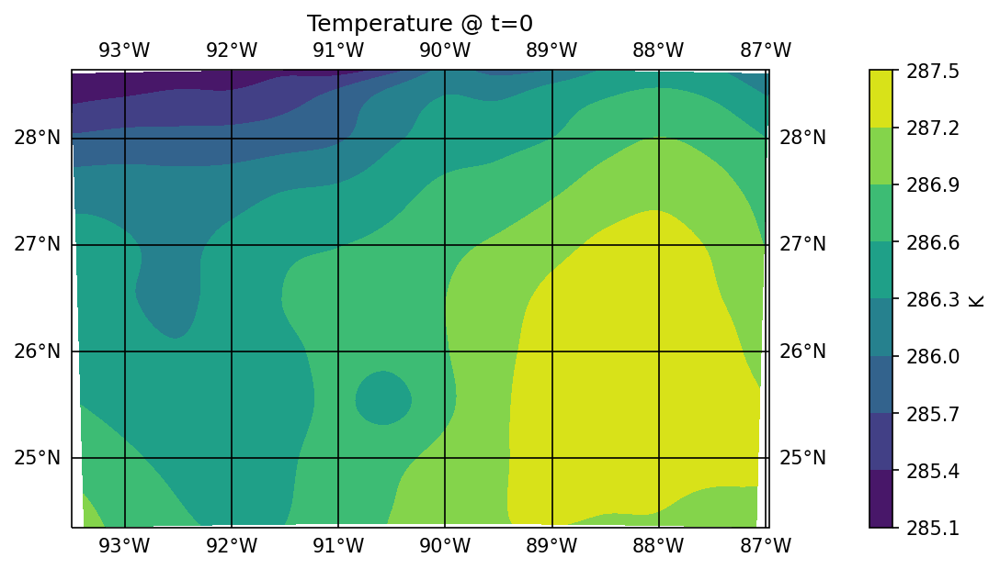

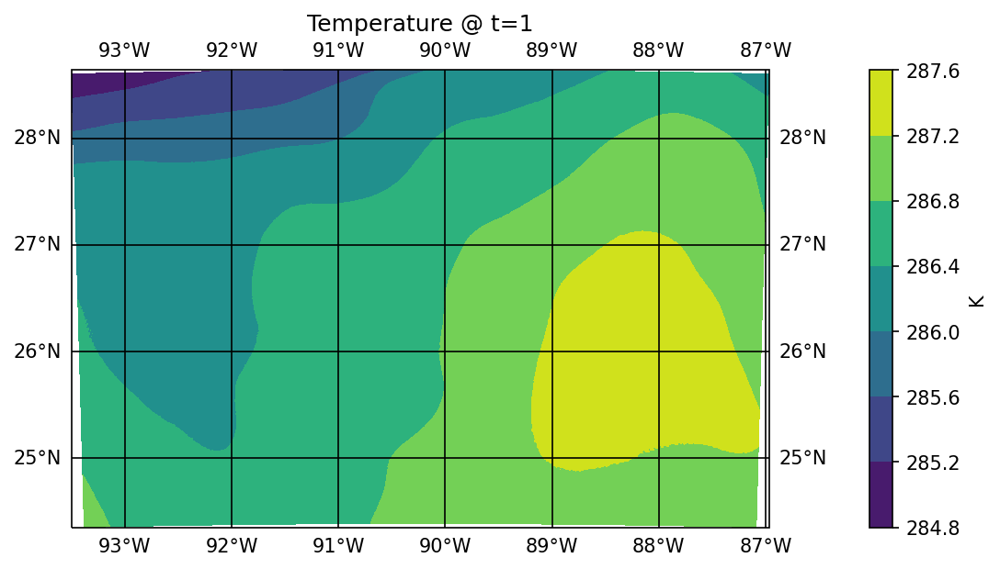

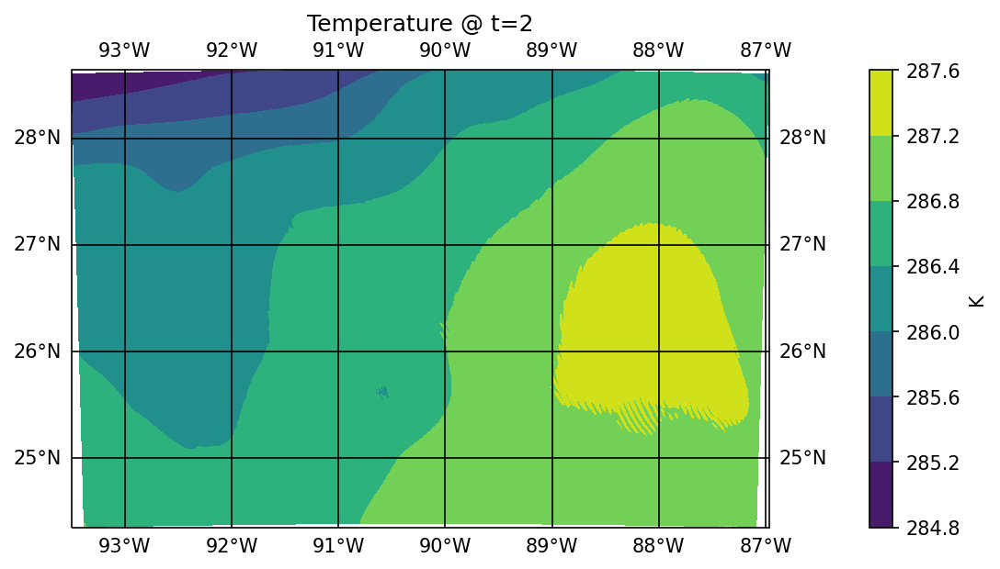

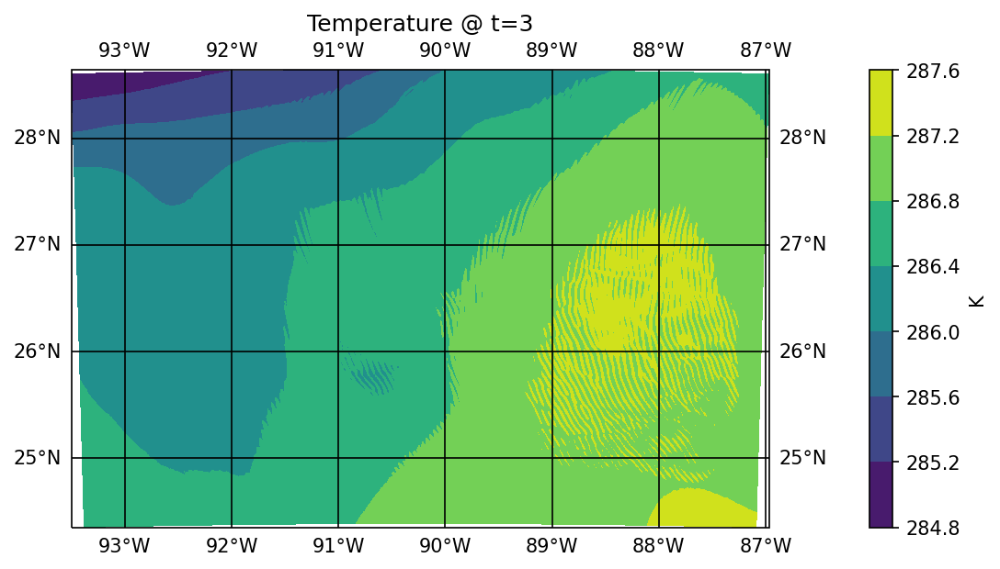

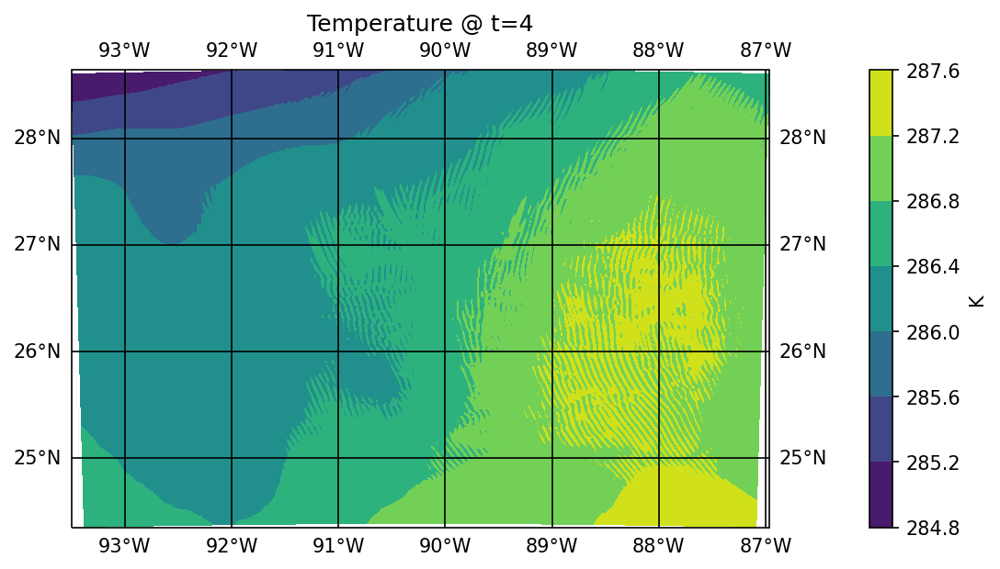

...

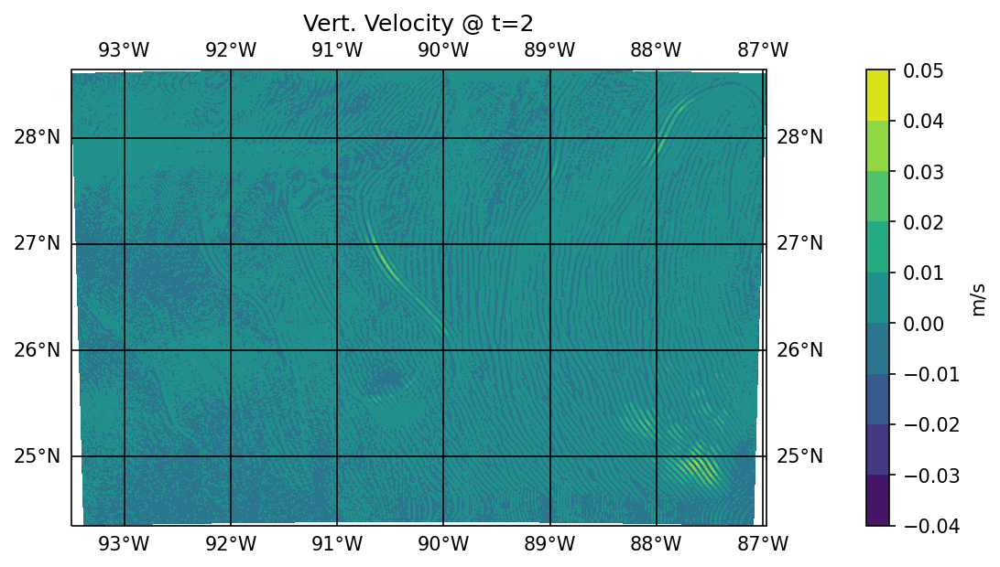

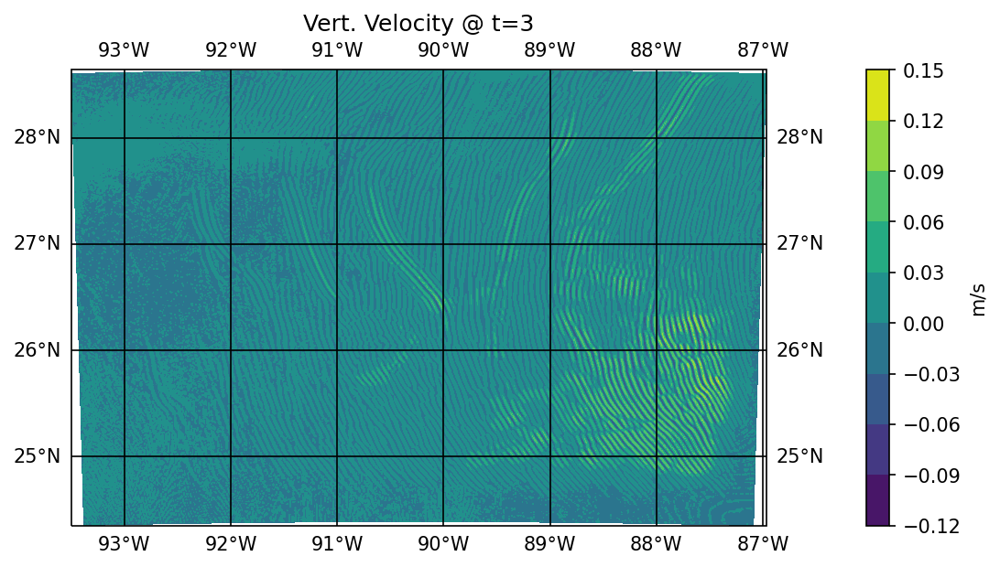

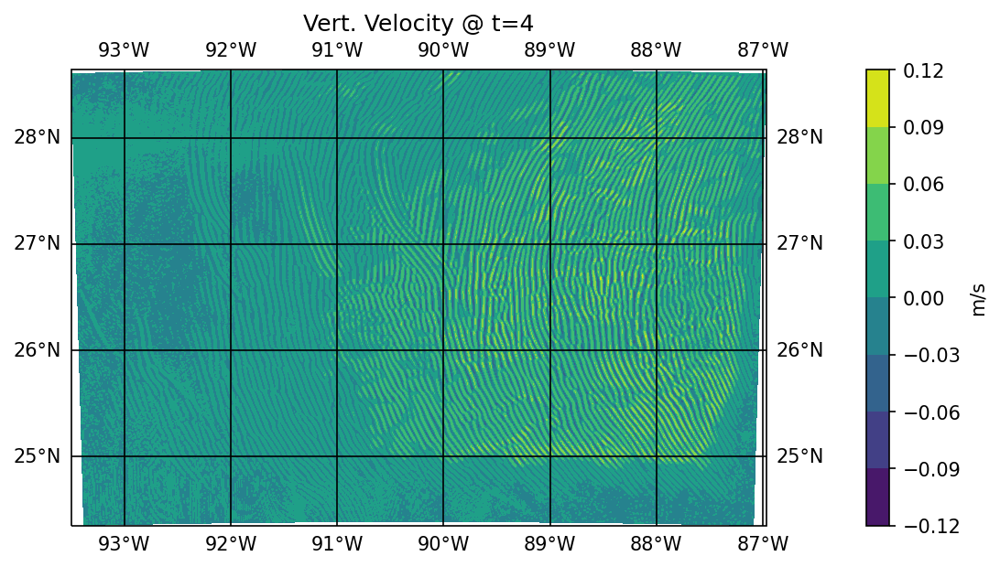

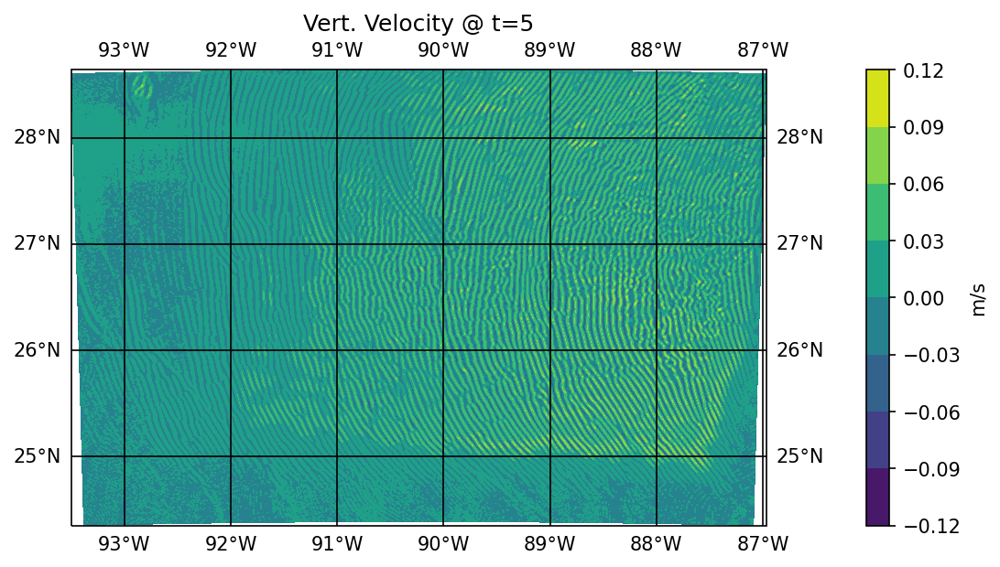

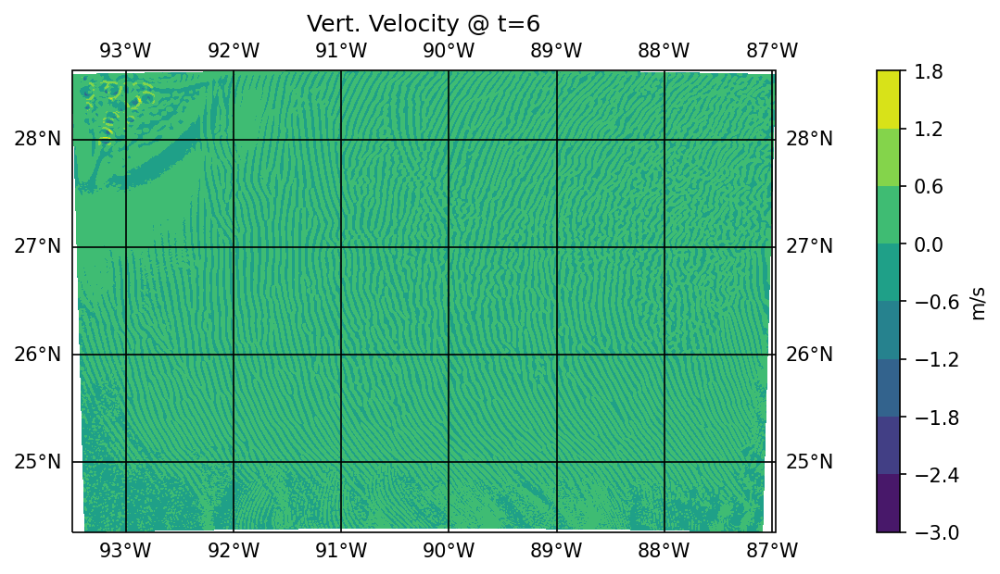

In [6]:

#TEMP
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], temp0[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Temp_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], temp1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Temp_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], temp2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Temp_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], temp3[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Temp_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], temp4[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Temp_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], temp5[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Temp_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], temp6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Temp_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#THETAE
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], thetae0[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Thetae_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], thetae1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Thetae_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], thetae2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Thetae_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], thetae3[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Thetae_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], thetae4[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Thetae_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], thetae5[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Thetae_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], thetae6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp. @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'Thetae_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], w_wind0_destag[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], w_wind1_destag[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], w_wind2_destag[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], w_wind3_destag[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], w_wind4_destag[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], w_wind5_destag[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], w_wind6_destag[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

In [8]:
#DOMAIN 2 

uwind0_2 = getvar(wrfout0_2, "U")
vwind0_2 = getvar(wrfout0_2, 'V')
sst0_2 = getvar(wrfout0_2, "SST")
pblh0_2 = getvar(wrfout0_2, "PBLH")
xlat0_2 =getvar(wrfout0_2, "XLAT")
xlon0_2 = getvar(wrfout0_2, "XLONG")
xlatu0_2 = getvar(wrfout0_2, "XLAT_U")
xlonu0_2 =getvar(wrfout0_2, "XLONG_U")
xlatv0_2 = getvar(wrfout0_2, "XLAT_V")
xlonv0_2 = getvar(wrfout0_2, "XLONG_V")
uwind1_2 = getvar(wrfout1_2, "U")
vwind1_2 = getvar(wrfout1_2, 'V')
sst1_2 = getvar(wrfout1_2, "SST")
pblh1_2 = getvar(wrfout1_2, "PBLH")
xlat1_2 =getvar(wrfout1_2, "XLAT")
xlon1_2 = getvar(wrfout1_2, "XLONG")
xlatu1_2 = getvar(wrfout1_2, "XLAT_U")
xlonu1_2 =getvar(wrfout1_2, "XLONG_U")
xlatv1_2 = getvar(wrfout1_2, "XLAT_V")
xlonv1_2 = getvar(wrfout1_2, "XLONG_V")
#uwind2_2 = getvar(wrfout2_2, "U")
#vwind2_2 = getvar(wrfout2_2, 'V')
#sst2_2 = getvar(wrfout2_2, "SST")
#pblh2_2 = getvar(wrfout2_2, "PBLH")
#xlat2_2 =getvar(wrfout2_2, "XLAT")
#xlon2_2 = getvar(wrfout2_2, "XLONG")
#xlatu2_2 = getvar(wrfout2_2, "XLAT_U")
#xlonu2_2 =getvar(wrfout2_2, "XLONG_U")
#xlatv2_2 = getvar(wrfout2_2, "XLAT_V")
#xlonv2_2 = getvar(wrfout2_2, "XLONG_V")
uwind3_2 = getvar(wrfout3_2, "U")
vwind3_2 = getvar(wrfout3_2, 'V')
sst3_2 = getvar(wrfout3_2, "SST")
pblh3_2 = getvar(wrfout3_2, "PBLH")
xlat3_2 =getvar(wrfout3_2, "XLAT")
xlon3_2 = getvar(wrfout3_2, "XLONG")
xlatu3_2 = getvar(wrfout3_2, "XLAT_U")
xlonu3_2 =getvar(wrfout3_2, "XLONG_U")
xlatv3_2 = getvar(wrfout3_2, "XLAT_V")
xlonv3_2 = getvar(wrfout3_2, "XLONG_V")
uwind4_2 = getvar(wrfout4_2, "U")
vwind4_2 = getvar(wrfout4_2, 'V')
sst4_2 = getvar(wrfout4_2, "SST")
pblh4_2 = getvar(wrfout4_2, "PBLH")
xlat4_2 =getvar(wrfout4_2, "XLAT")
xlon4_2 = getvar(wrfout4_2, "XLONG")
xlatu4_2 = getvar(wrfout4_2, "XLAT_U")
xlonu4_2 =getvar(wrfout4_2, "XLONG_U")
xlatv4_2 = getvar(wrfout4_2, "XLAT_V")
xlonv4_2 = getvar(wrfout4_2, "XLONG_V")
uwind5_2 = getvar(wrfout5_2, "U")
vwind5_2 = getvar(wrfout5_2, 'V')
sst5_2 = getvar(wrfout5_2, "SST")
pblh5_2 = getvar(wrfout5_2, "PBLH")
xlat5_2 =getvar(wrfout5_2, "XLAT")
xlon5_2 = getvar(wrfout5_2, "XLONG")
xlatu5_2 = getvar(wrfout5_2, "XLAT_U")
xlonu5_2 =getvar(wrfout5_2, "XLONG_U")
xlatv5_2 = getvar(wrfout5_2, "XLAT_V")
xlonv5_2 = getvar(wrfout5_2, "XLONG_V")
uwind6_2 = getvar(wrfout6_2, "U")
vwind6_2 = getvar(wrfout6_2, 'V')
sst6_2 = getvar(wrfout6_2, "SST")
pblh6_2 = getvar(wrfout6_2, "PBLH")
xlat6_2 =getvar(wrfout6_2, "XLAT")
xlon6_2 = getvar(wrfout6_2, "XLONG")
xlatu6_2 = getvar(wrfout6_2, "XLAT_U")
xlonu6_2 =getvar(wrfout6_2, "XLONG_U")
xlatv6_2 = getvar(wrfout6_2, "XLAT_V")
xlonv6_2 = getvar(wrfout6_2, "XLONG_V")

uwind_destag0_2 = wrf.destagger(uwind0_2, stagger_dim = 2)
vwind_destag0_2 = wrf.destagger(vwind0_2, stagger_dim = 1)
w_speed0_2 = np.sqrt((uwind_destag0_2**2)+(vwind_destag0_2**2))
xlatu_destag0_2 = wrf.destagger(xlatu0_2, stagger_dim =1)
xlonu_destag0_2 = wrf.destagger(xlonu0_2, stagger_dim =1)
xlatv_destag0_2= wrf.destagger(xlatv0_2, stagger_dim =0)
xlonv_destag0_2= wrf.destagger(xlonv0_2, stagger_dim =0)
uwind_destag1_2= wrf.destagger(uwind1_2, stagger_dim = 2)
vwind_destag1_2= wrf.destagger(vwind1_2, stagger_dim = 1)
w_speed1_2= np.sqrt((uwind_destag1_2**2)+(vwind_destag1_2**2))
xlatu_destag1_2= wrf.destagger(xlatu1_2, stagger_dim =1)
xlonu_destag1_2= wrf.destagger(xlonu1_2, stagger_dim =1)
xlatv_destag1_2= wrf.destagger(xlatv1_2, stagger_dim =0)
xlonv_destag1_2= wrf.destagger(xlonv1_2, stagger_dim =0)
#uwind_destag2_2 wrf.destagger(uwind2_2, stagger_dim = 2)
#vwind_destag2_2 wrf.destagger(vwind2_2, stagger_dim = 1)
#w_speed2_2 np.sqrt((uwind_destag2_2**2)+(vwind_destag2_2**2))
#xlatu_destag2_2 wrf.destagger(xlatu2_2, stagger_dim =1)
#xlonu_destag2_2 wrf.destagger(xlonu2_2, stagger_dim =1)
#xlatv_destag2_2 wrf.destagger(xlatv2_2, stagger_dim =0)
#xlonv_destag2_2 wrf.destagger(xlonv2_2, stagger_dim =0)
uwind_destag3_2= wrf.destagger(uwind3_2, stagger_dim = 2)
vwind_destag3_2= wrf.destagger(vwind3_2, stagger_dim = 1)
w_speed3_2= np.sqrt((uwind_destag3_2**2)+(vwind_destag3_2**2))
xlatu_destag3_2= wrf.destagger(xlatu3_2, stagger_dim =1)
xlonu_destag3_2= wrf.destagger(xlonu3_2, stagger_dim =1)
xlatv_destag3_2= wrf.destagger(xlatv3_2, stagger_dim =0)
xlonv_destag3_2= wrf.destagger(xlonv3_2, stagger_dim =0)
uwind_destag4_2= wrf.destagger(uwind4_2, stagger_dim = 2)
vwind_destag4_2=wrf.destagger(vwind4_2, stagger_dim = 1)
w_speed4_2 = np.sqrt((uwind_destag4_2**2)+(vwind_destag4_2**2))
xlatu_destag4_2 = wrf.destagger(xlatu4_2, stagger_dim =1)
xlonu_destag4_2 = wrf.destagger(xlonu4_2, stagger_dim =1)
xlatv_destag4_2 = wrf.destagger(xlatv4_2, stagger_dim =0)
xlonv_destag4_2 = wrf.destagger(xlonv4_2, stagger_dim =0)
uwind_destag5_2 = wrf.destagger(uwind5_2, stagger_dim = 2)
vwind_destag5_2 = wrf.destagger(vwind5_2, stagger_dim = 1)
w_speed5_2 = np.sqrt((uwind_destag5_2**2)+(vwind_destag5_2**2))
xlatu_destag5_2 = wrf.destagger(xlatu5_2, stagger_dim =1)
xlonu_destag5_2 = wrf.destagger(xlonu5_2, stagger_dim =1)
xlatv_destag5_2 = wrf.destagger(xlatv5_2, stagger_dim =0)
xlonv_destag5_2 = wrf.destagger(xlonv5_2, stagger_dim =0)
uwind_destag6_2 = wrf.destagger(uwind6_2, stagger_dim = 2)
vwind_destag6_2 = wrf.destagger(vwind6_2, stagger_dim = 1)
w_speed6_2 = np.sqrt((uwind_destag6_2**2)+(vwind_destag6_2**2))
xlatu_destag6_2 = wrf.destagger(xlatu6_2, stagger_dim =1)
xlonu_destag6_2 = wrf.destagger(xlonu6_2, stagger_dim =1)
xlatv_destag6_2 = wrf.destagger(xlatv6_2, stagger_dim =0)
xlonv_destag6_2 = wrf.destagger(xlonv6_2, stagger_dim =0)


#stagger:, 'QVAPOR': <xarray.Variable (Time: 1, bottom_top: 49, south_north: 474, west_east: 639)>
#vapor mixing ratio,    units:        kg kg-1
qv0_2 = getvar(wrfout0_2, 'QVAPOR')
qv1_2 = getvar(wrfout1_2, 'QVAPOR')
#qv2_2 = getvar(wrfout2_2, 'QVAPOR')
qv3_2 = getvar(wrfout3_2, 'QVAPOR')
qv4_2 = getvar(wrfout4_2, 'QVAPOR')
qv5_2 = getvar(wrfout5_2, 'QVAPOR')
qv6_2 = getvar(wrfout6_2, 'QVAPOR')
print('qv shape: ', qv0.shape)



qv shape:  (49, 474, 639)


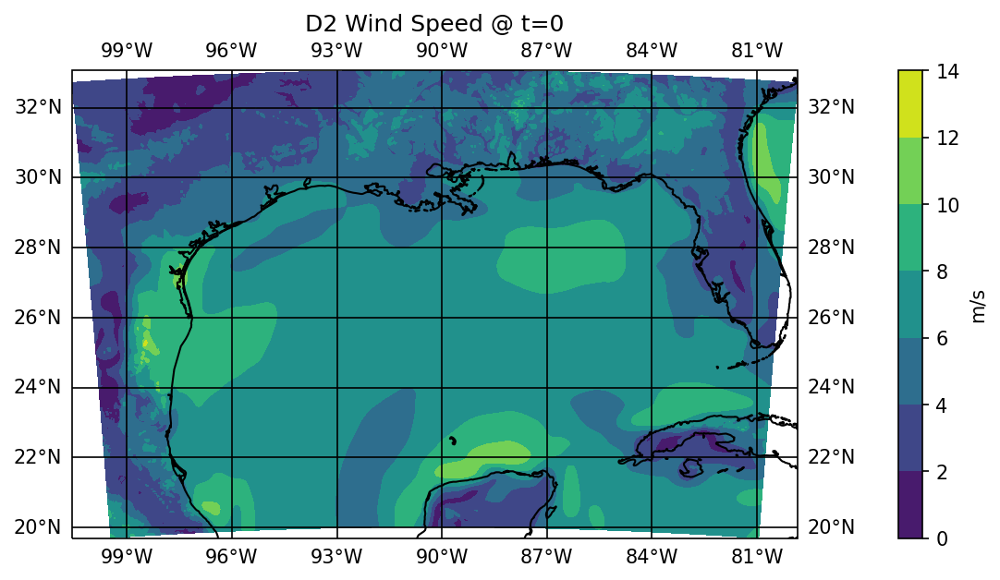

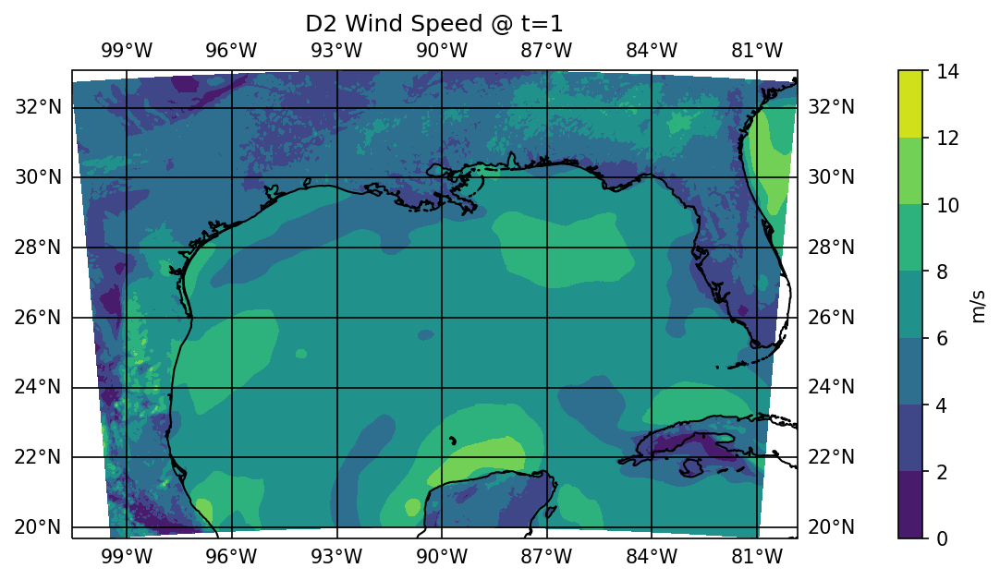

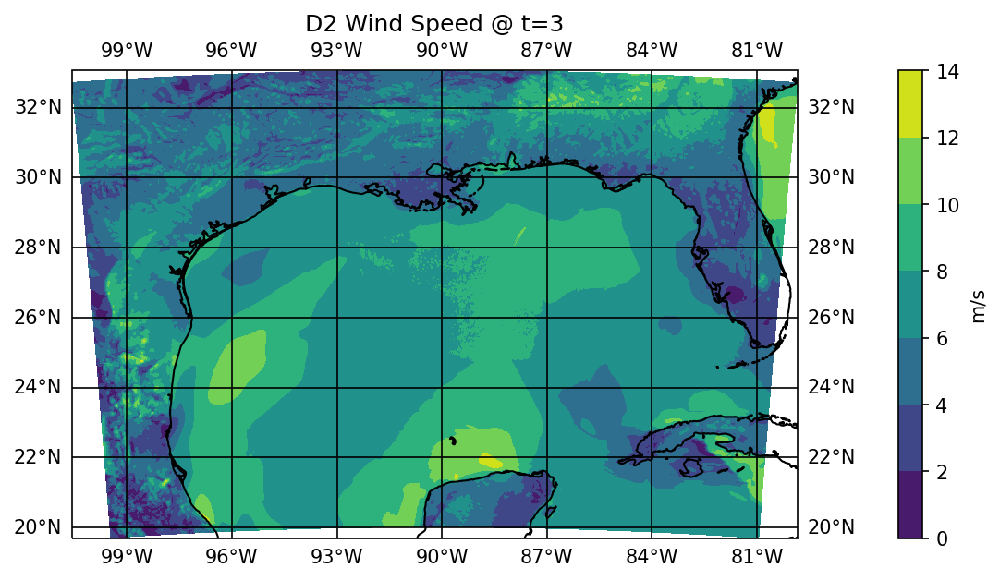

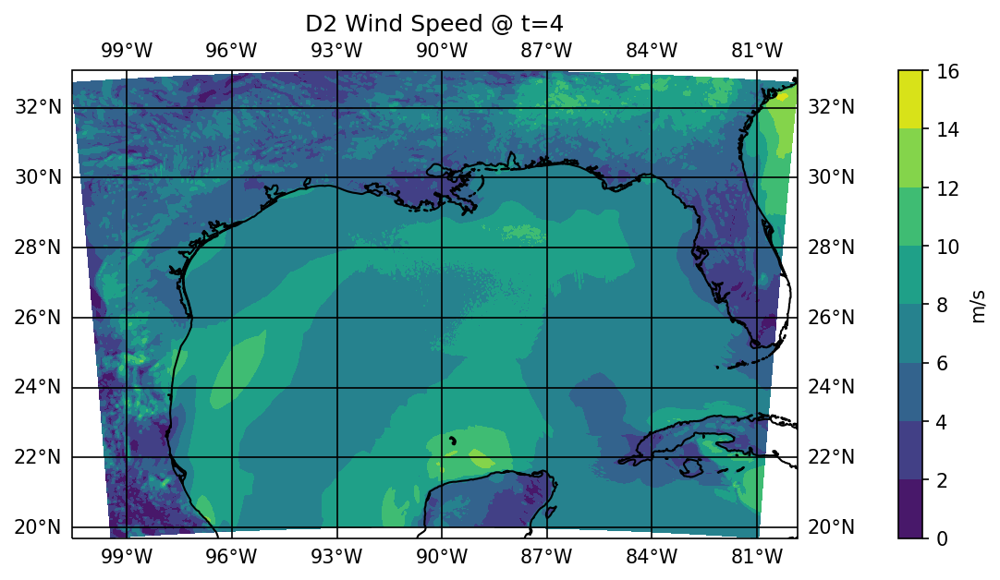

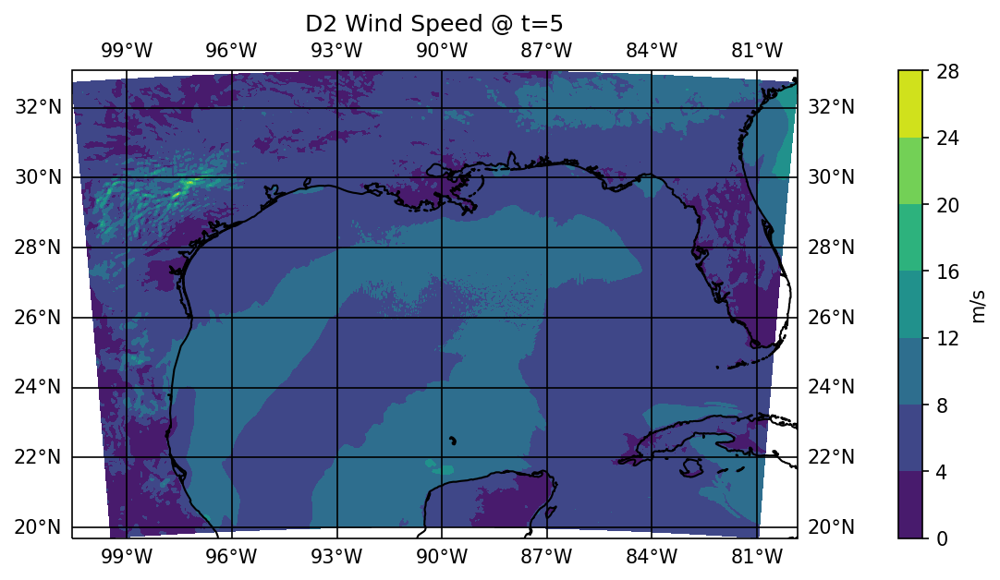

...

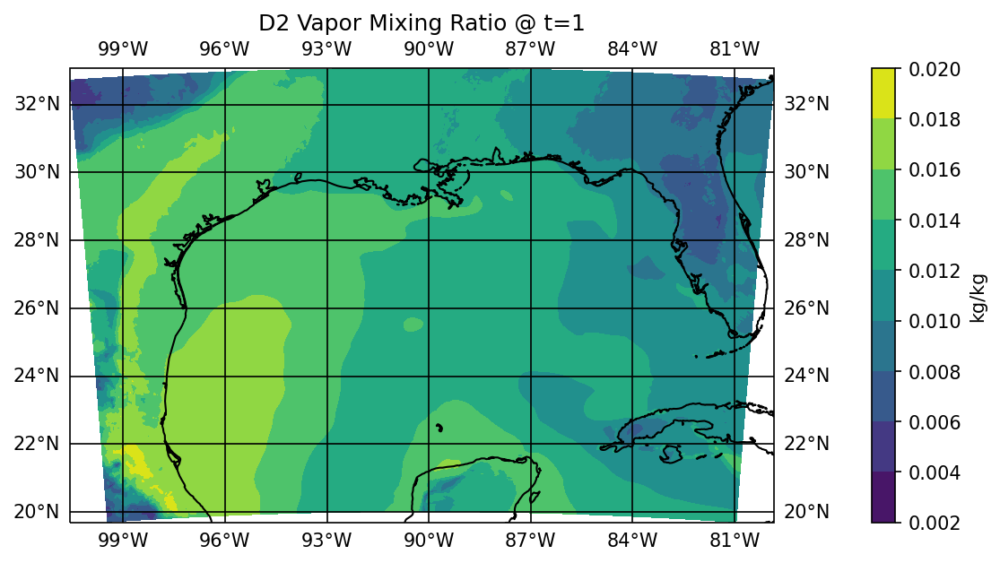

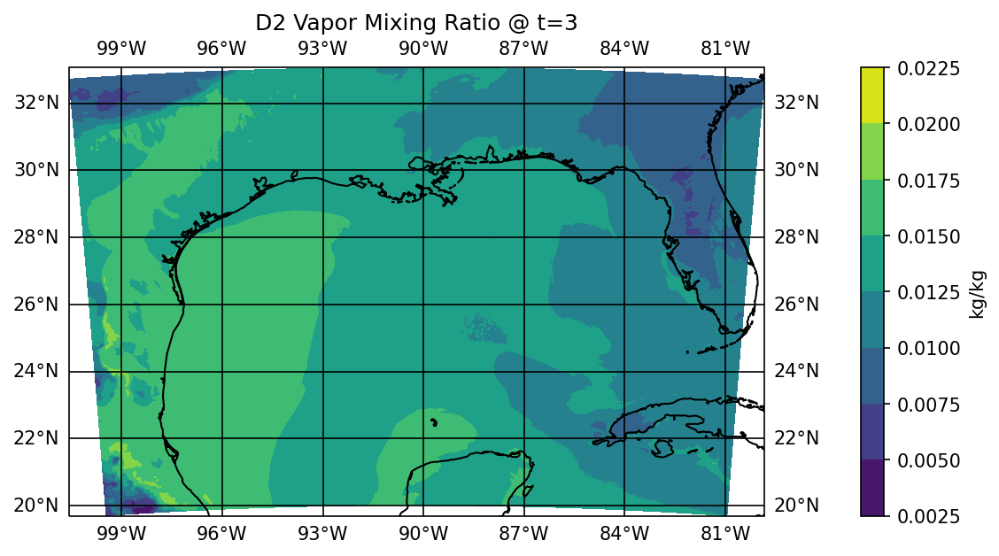

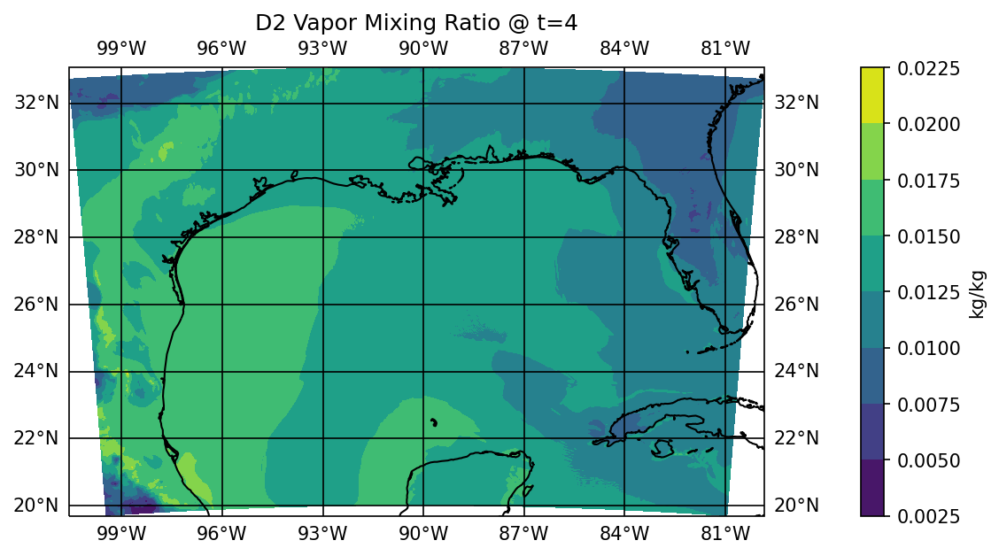

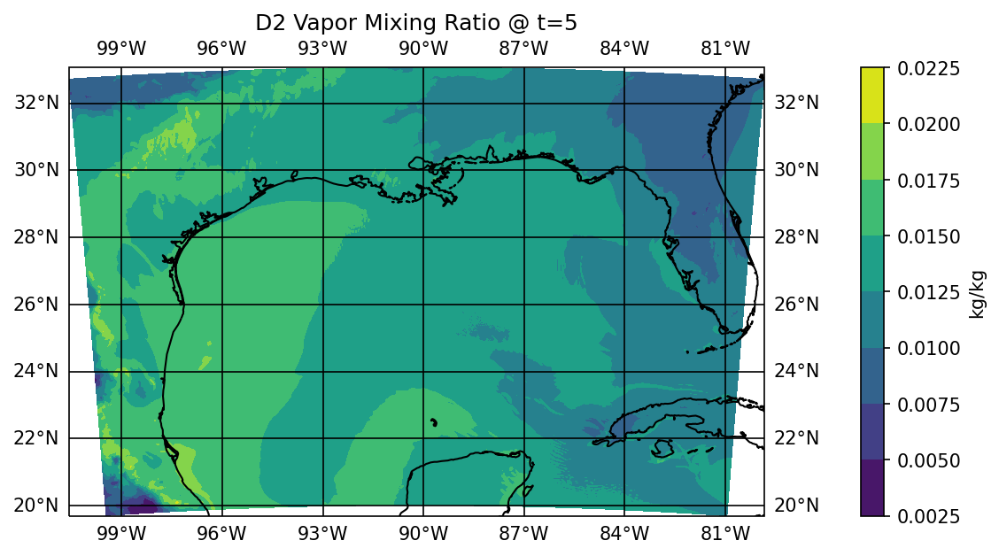

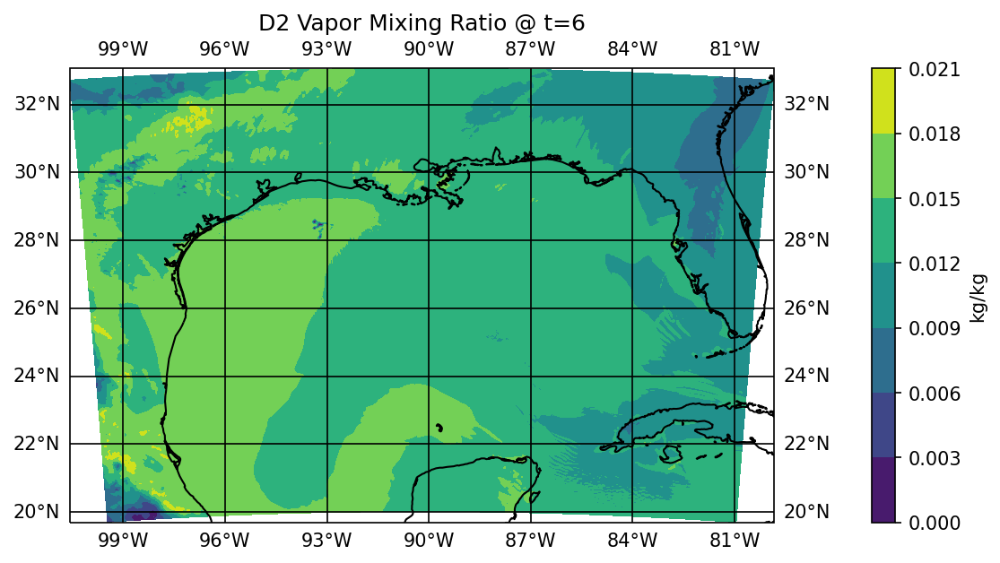

In [9]:
#wind speed
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], w_speed0_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Wind Speed @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_WindSpeed0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], w_speed1_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Wind Speed @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_WindSpeed1.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_2[:,:], xlat2_2[:,:], w_speed2_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Wind Speed @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_WindSpeed2.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], w_speed3_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Wind Speed @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_WindSpeed3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], w_speed4_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Wind Speed @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_WindSpeed4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], w_speed5_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Wind Speed @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_WindSpeed5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], w_speed6_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Wind Speed @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_WindSpeed6.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
#PBLH
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], pblh0_2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 PBL Height @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_PBLH_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], pblh1_2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 PBL Height @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_PBLH_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_2[:,:], xlat2_2[:,:], pblh2_2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 PBL Height @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_PBLH_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], pblh3_2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 PBL Height @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_PBLH_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], pblh4_2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 PBL Height @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_PBLH_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], pblh5_2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 PBL Height @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_PBLH_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], pblh6_2[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 PBL Height @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_PBLH_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

'''
#Vapor Mixing Ratio
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], qv0_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Vapor Mixing Ratio @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_QV_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], qv1_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Vapor Mixing Ratio @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_QV_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_2[:,:], xlat2_2[:,:], qv2_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Vapor Mixing Ratio @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_QV_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], qv3_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Vapor Mixing Ratio @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_QV_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], qv4_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Vapor Mixing Ratio @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_QV_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], qv5_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Vapor Mixing Ratio @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_QV_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], qv6_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D2 Vapor Mixing Ratio @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_QV_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

In [10]:
#Potential temperature (perturbation plus reference temperature)

pert_t0_2 =getvar(wrfout0_2, 'T')
pert_t1_2 =getvar(wrfout1_2, 'T')
#pert_t2_2 =getvar(wrfout2_2, 'T')
pert_t3_2 =getvar(wrfout3_2, 'T')
pert_t4_2 =getvar(wrfout4_2, 'T')
pert_t5_2 =getvar(wrfout5_2, 'T')
pert_t6_2 =getvar(wrfout6_2, 'T')

#'T00': <class 'netCDF4._netCDF4.Variable'>
#float32 T00(Time)
#    FieldType: 104
#    MemoryOrder: 0  
#    description: BASE STATE TEMPERATURE
#    units: K
#    stagger: 
#unlimited dimensions: Time

#reference T
ref_t0_2 =getvar(wrfout0_2, 'T00')
ref_t1_2 =getvar(wrfout1_2, 'T00')
#ref_t2_2 =getvar(wrfout2_2, 'T00')
ref_t3_2 =getvar(wrfout3_2, 'T00')
ref_t4_2 =getvar(wrfout4_2, 'T00')
ref_t5_2 =getvar(wrfout5_2, 'T00')
ref_t6_2 =getvar(wrfout6_2, 'T00')

#full T
full_t0_2 = pert_t0_2 + ref_t0_2 
full_t1_2 = pert_t1_2 + ref_t1_2 
#full_t2_2 = pert_t2_2 + ref_t2_2
full_t3_2 = pert_t3_2 + ref_t3_2 
full_t4_2 = pert_t4_2 + ref_t4_2 
full_t5_2 = pert_t5_2 + ref_t5_2
full_t6_2 = pert_t6_2 + ref_t6_2

pert_p0_2 = getvar(wrfout0_2, 'P')
pert_p1_2 = getvar(wrfout1_2, 'P')
#pert_p2_2 = getvar(wrfout2_2, 'P')
pert_p3_2 = getvar(wrfout3_2, 'P')
pert_p4_2 = getvar(wrfout4_2, 'P')
pert_p5_2 = getvar(wrfout5_2, 'P')
pert_p6_2= getvar(wrfout6_2, 'P')
#stagger:, 'P': <xarray.Variable (Time: 1, bottom_top: 49, south_north: 474, west_east: 639
#description:  perturbation pressure,    units:        Pa

base_p0_2 = getvar(wrfout0_2, 'P00')
base_p1_2 = getvar(wrfout1_2, 'P00')
#base_p2_2 = getvar(wrfout2_2, 'P00')
base_p3_2 = getvar(wrfout3_2, 'P00')
base_p4_2 = getvar(wrfout4_2, 'P00')
base_p5_2 = getvar(wrfout5_2, 'P00')
base_p6_2= getvar(wrfout6_2, 'P00')
#stagger:      , 'P00': <xarray.Variable (Time: 1)>
#description:  BASE STATE PRESSURE,    units:        Pa

full_p0_2 = pert_p0_2 + base_p0_2 
full_p1_2 = pert_p1_2 + base_p1_2 
#full_p2_2 = pert_p2_2 + base_p2_2 
full_p3_2 = pert_p3_2 + base_p3_2 
full_p4_2 = pert_p4_2 + base_p4_2 
full_p5_2 = pert_p5_2 + base_p5_2
full_p6_2 = pert_p6_2 + base_p6_2

#wrf.tk(pres, theta, meta=True, units='K')
temp0_2 = wrf.tk(full_p0_2, full_t0_2, meta=True, units='K')
temp1_2 = wrf.tk(full_p1_2, full_t1_2, meta=True, units='K')
#temp2_2 = wrf.tk(full_p2_2, full_t2_2, meta=True, units='K')
temp3_2 = wrf.tk(full_p3_2, full_t3_2, meta=True, units='K')
temp4_2 = wrf.tk(full_p4_2, full_t4_2, meta=True, units='K')
temp5_2 = wrf.tk(full_p5_2, full_t5_2, meta=True, units='K')
temp6_2= wrf.tk(full_p6_2, full_t6_2, meta=True, units='K')

#qv = Water vapor mixing ratio in [kg/kg] with at least three dimensions. The rightmost dimensions are bottom_top x south_north x west_east.
#pres = Full pressure (perturbation + base state pressure) in [Pa] with the same dimensionality as qv.
#tkel = Temperature in [K] with same dimensionality as qv.

#get equiv. pot. temp
thetae0_2 = wrf.eth(qv0_2, temp0_2, full_p0_2, meta=True, units='K')
thetae1_2 = wrf.eth(qv1_2, temp1_2, full_p1_2, meta=True, units='K')
#thetae2_2 = wrf.eth(qv2_2, temp2_2, full_p2_2, meta=True, units='K')
thetae3_2 = wrf.eth(qv3_2, temp3_2, full_p3_2, meta=True, units='K')
thetae4_2 = wrf.eth(qv4_2, temp4_2, full_p4_2, meta=True, units='K')
thetae5_2 = wrf.eth(qv5_2, temp5_2, full_p5_2, meta=True, units='K')
thetae6_2 = wrf.eth(qv6_2, temp6_2, full_p6_2, meta=True, units='K')

print('theta e shape: ', thetae0_2.shape)
print('temperature shape: ', temp0_2.shape)

#vertical velocity 
#'W': <class 'netCDF4._netCDF4.Variable'>
#float32 W(Time, bottom_top_stag, south_north, west_east)
#    FieldType: 104
#    MemoryOrder: XYZ
#    description: z-wind component
#    units: m s-1
#    stagger: Z
#    coordinates: XLONG XLAT XTIME
#unlimited dimensions: Time
#current shape = (1, 50, 474, 639)

#get W
w_wind0_2 = getvar(wrfout0_2, "W")
w_wind1_2 = getvar(wrfout1_2, "W")
#w_wind2_2 = getvar(wrfout2_2, "W")
w_wind3_2 = getvar(wrfout3_2, "W")
w_wind4_2 = getvar(wrfout4_2, "W")
w_wind5_2 = getvar(wrfout5_2, "W")
w_wind6_2 = getvar(wrfout6_2, "W")
print('vert. vel. shape: ', w_wind0_2.shape)

#unstagger _bottom_top
#xlatv_destag1 = wrf.destagger(xlatv1, stagger_dim =0)
w_wind0_destag_2 = wrf.destagger(w_wind0_2, stagger_dim =0)
w_wind1_destag_2 = wrf.destagger(w_wind1_2, stagger_dim =0)
#w_wind2_destag_2 = wrf.destagger(w_wind2_2, stagger_dim =0)
w_wind3_destag_2 = wrf.destagger(w_wind3_2, stagger_dim =0)
w_wind4_destag_2 = wrf.destagger(w_wind4_2, stagger_dim =0)
w_wind5_destag_2 = wrf.destagger(w_wind5_2, stagger_dim =0)
w_wind6_destag_2 = wrf.destagger(w_wind6_2, stagger_dim =0)

print('vert. vel. destag: ', w_wind0_destag_2.shape)

theta e shape:  (49, 486, 651)
temperature shape:  (49, 486, 651)
vert. vel. shape:  (50, 486, 651)
vert. vel. destag:  (49, 486, 651)


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


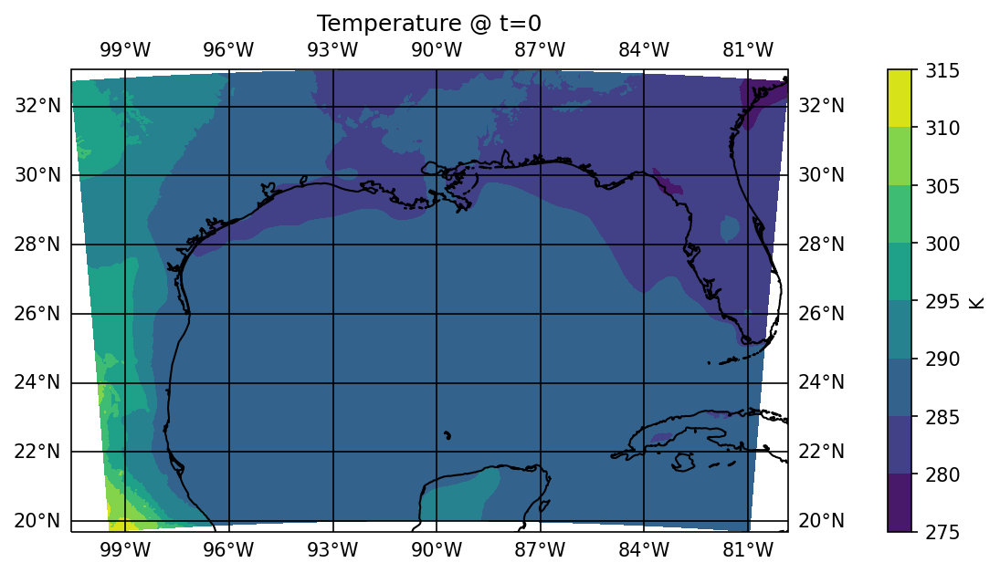

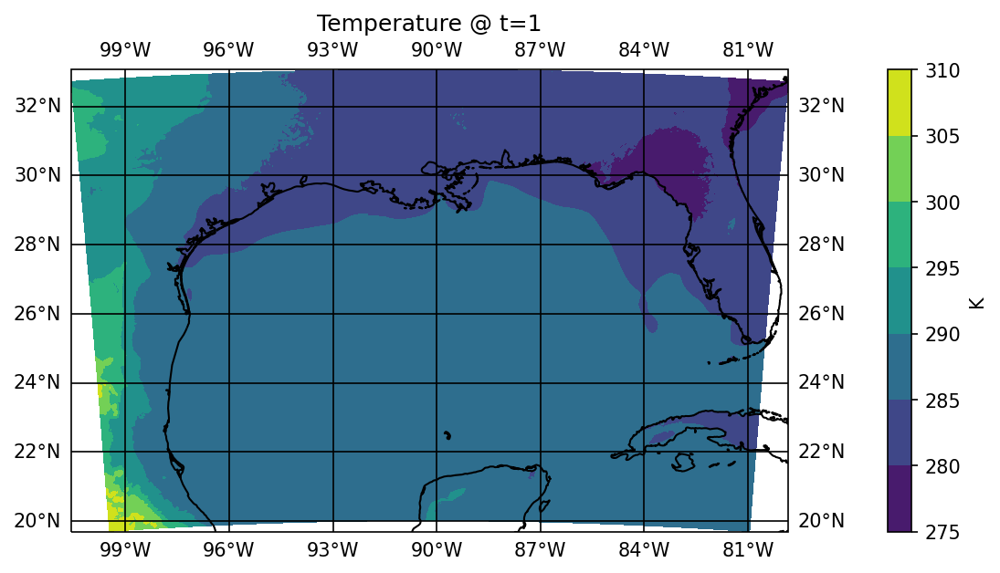

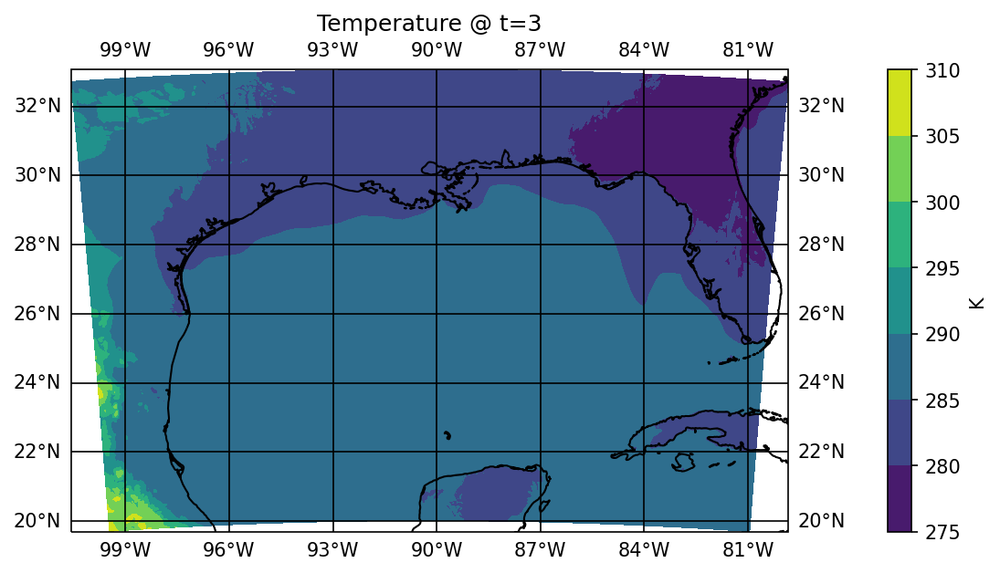

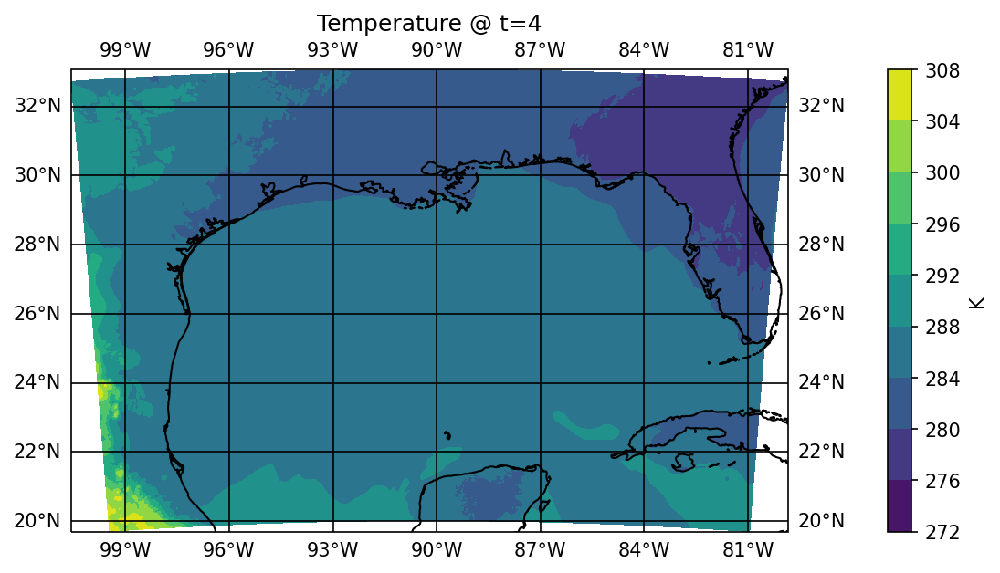

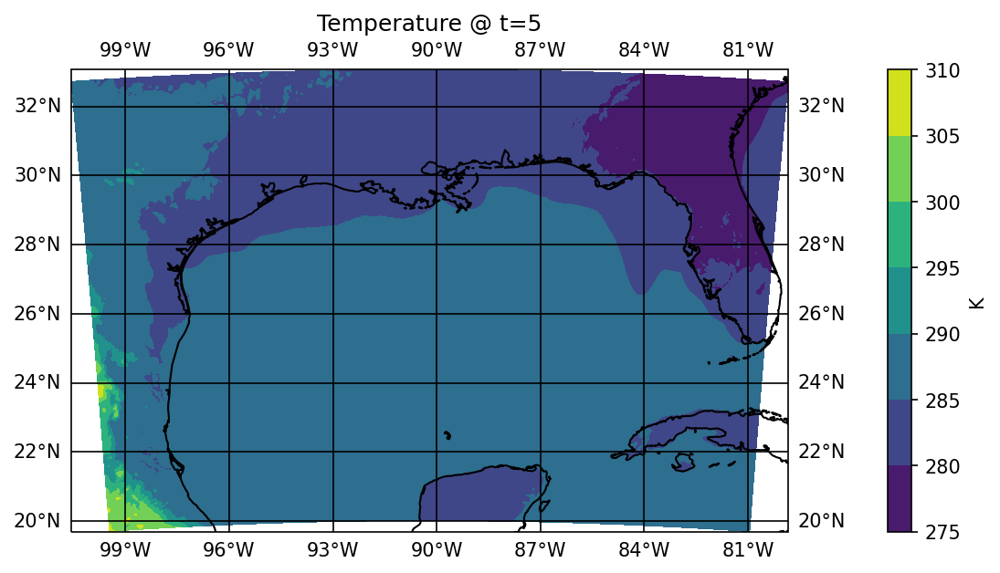

...

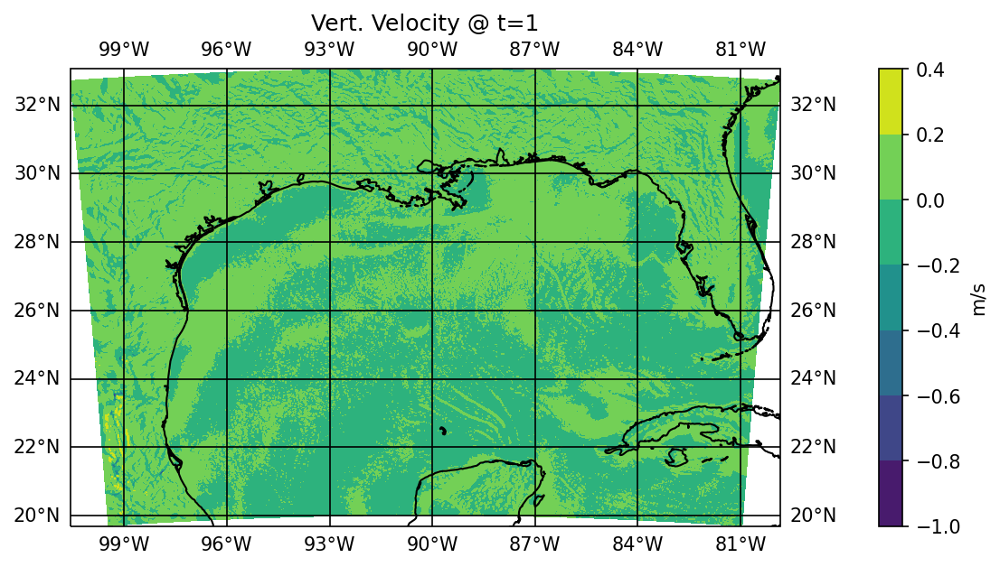

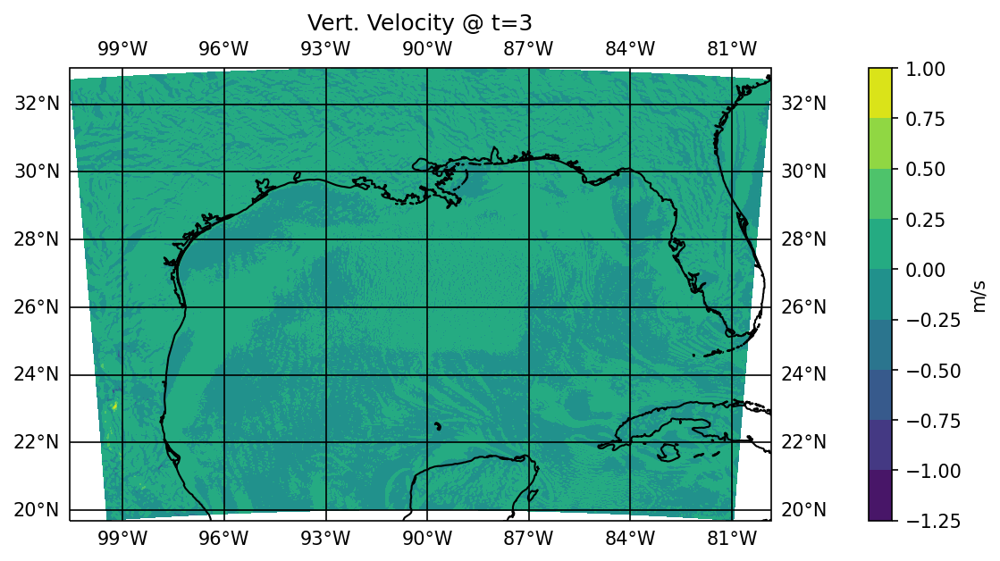

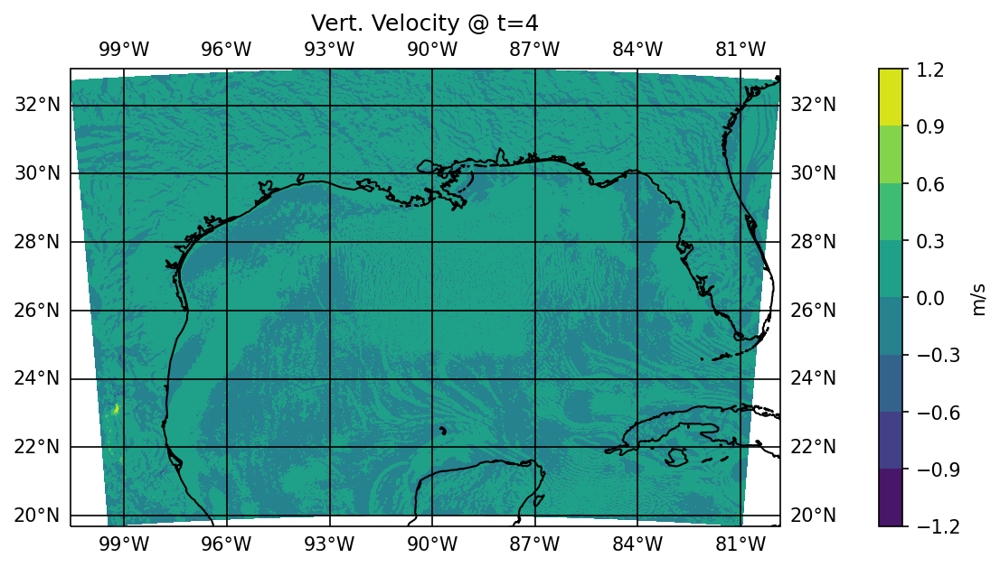

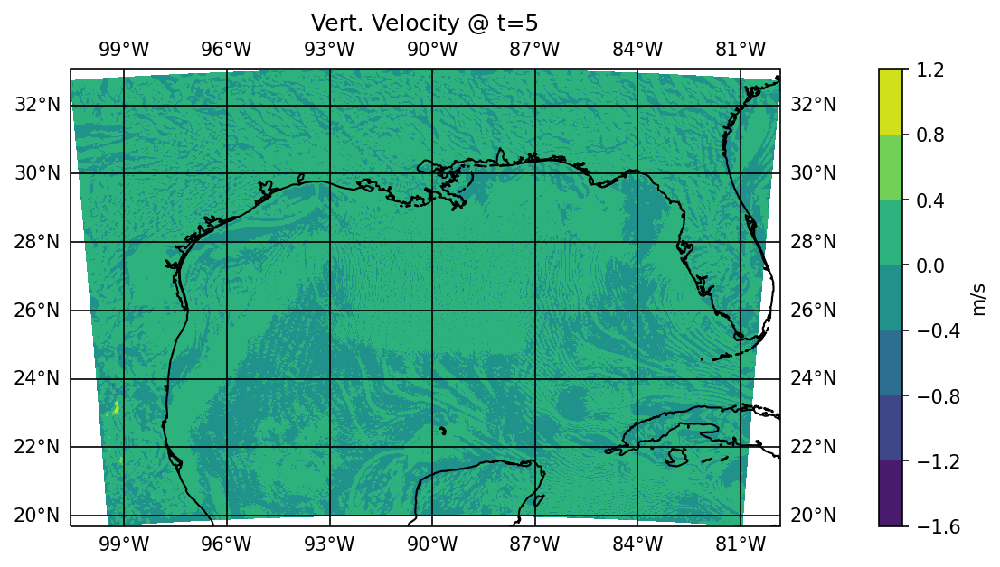

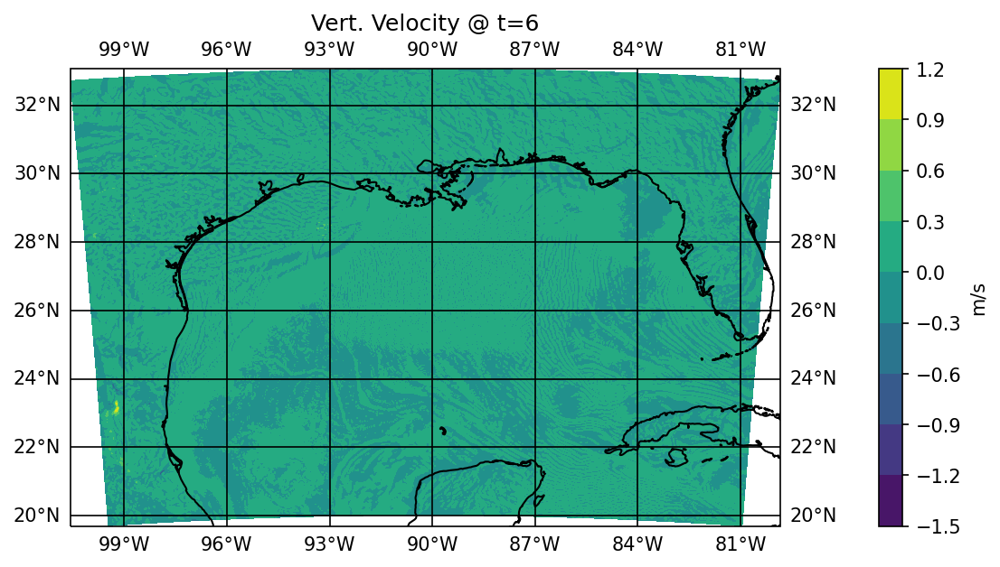

In [11]:

#TEMP
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], temp0_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Temp_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], temp1_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Temp_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_2[:,:], xlat2_2[:,:], temp2_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Temp_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], temp3_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Temp_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], temp4_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Temp_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], temp5_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Temp_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], temp6_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Temp_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#THETAE
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], thetae0_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Thetae_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], thetae1_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Thetae_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_2[:,:], xlat2_2[:,:], thetae2_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Thetae_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], thetae3_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Thetae_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], thetae4_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Thetae_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], thetae5_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Thetae_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], thetae6_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp. @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_Thetae_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], w_wind0_destag_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], w_wind1_destag_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_2[:,:], xlat2_2[:,:], w_wind2_destag_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], w_wind3_destag_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], w_wind4_destag_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], w_wind5_destag_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], w_wind6_destag_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D2_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

In [12]:

#DOMAIN 1

uwind0_1 = getvar(wrfout0_1, "U")
vwind0_1 = getvar(wrfout0_1, 'V')
sst0_1 = getvar(wrfout0_1, "SST")
pblh0_1 = getvar(wrfout0_1, "PBLH")
xlat0_1 =getvar(wrfout0_1, "XLAT")
xlon0_1 = getvar(wrfout0_1, "XLONG")
xlatu0_1 = getvar(wrfout0_1, "XLAT_U")
xlonu0_1 =getvar(wrfout0_1, "XLONG_U")
xlatv0_1 = getvar(wrfout0_1, "XLAT_V")
xlonv0_1 = getvar(wrfout0_1, "XLONG_V")
uwind1_1 = getvar(wrfout1_1, "U")
vwind1_1 = getvar(wrfout1_1, 'V')
sst1_1 = getvar(wrfout1_1, "SST")
pblh1_1 = getvar(wrfout1_1, "PBLH")
xlat1_1 =getvar(wrfout1_1, "XLAT")
xlon1_1 = getvar(wrfout1_1, "XLONG")
xlatu1_1 = getvar(wrfout1_1, "XLAT_U")
xlonu1_1 =getvar(wrfout1_1, "XLONG_U")
xlatv1_1 = getvar(wrfout1_1, "XLAT_V")
xlonv1_1 = getvar(wrfout1_1, "XLONG_V")
uwind2_1 = getvar(wrfout2_1, "U")
vwind2_1 = getvar(wrfout2_1, 'V')
sst2_1 = getvar(wrfout2_1, "SST")
pblh2_1 = getvar(wrfout2_1, "PBLH")
xlat2_1 =getvar(wrfout2_1, "XLAT")
xlon2_1 = getvar(wrfout2_1, "XLONG")
xlatu2_1 = getvar(wrfout2_1, "XLAT_U")
xlonu2_1 =getvar(wrfout2_1, "XLONG_U")
xlatv2_1 = getvar(wrfout2_1, "XLAT_V")
xlonv2_1 = getvar(wrfout2_1, "XLONG_V")
uwind3_1 = getvar(wrfout3_1, "U")
vwind3_1 = getvar(wrfout3_1, 'V')
sst3_1 = getvar(wrfout3_1, "SST")
pblh3_1 = getvar(wrfout3_1, "PBLH")
xlat3_1 =getvar(wrfout3_1, "XLAT")
xlon3_1 = getvar(wrfout3_1, "XLONG")
xlatu3_1 = getvar(wrfout3_1, "XLAT_U")
xlonu3_1 =getvar(wrfout3_1, "XLONG_U")
xlatv3_1 = getvar(wrfout3_1, "XLAT_V")
xlonv3_1 = getvar(wrfout3_1, "XLONG_V")
uwind4_1 = getvar(wrfout4_1, "U")
vwind4_1 = getvar(wrfout4_1, 'V')
sst4_1 = getvar(wrfout4_1, "SST")
pblh4_1 = getvar(wrfout4_1, "PBLH")
xlat4_1 =getvar(wrfout4_1, "XLAT")
xlon4_1 = getvar(wrfout4_1, "XLONG")
xlatu4_1 = getvar(wrfout4_1, "XLAT_U")
xlonu4_1 =getvar(wrfout4_1, "XLONG_U")
xlatv4_1 = getvar(wrfout4_1, "XLAT_V")
xlonv4_1 = getvar(wrfout4_1, "XLONG_V")
uwind5_1 = getvar(wrfout5_1, "U")
vwind5_1 = getvar(wrfout5_1, 'V')
sst5_1 = getvar(wrfout5_1, "SST")
pblh5_1 = getvar(wrfout5_1, "PBLH")
xlat5_1 =getvar(wrfout5_1, "XLAT")
xlon5_1 = getvar(wrfout5_1, "XLONG")
xlatu5_1 = getvar(wrfout5_1, "XLAT_U")
xlonu5_1 =getvar(wrfout5_1, "XLONG_U")
xlatv5_1 = getvar(wrfout5_1, "XLAT_V")
xlonv5_1 = getvar(wrfout5_1, "XLONG_V")
uwind6_1 = getvar(wrfout6_1, "U")
vwind6_1 = getvar(wrfout6_1, 'V')
sst6_1 = getvar(wrfout6_1, "SST")
pblh6_1 = getvar(wrfout6_1, "PBLH")
xlat6_1 =getvar(wrfout6_1, "XLAT")
xlon6_1 = getvar(wrfout6_1, "XLONG")
xlatu6_1 = getvar(wrfout6_1, "XLAT_U")
xlonu6_1 =getvar(wrfout6_1, "XLONG_U")
xlatv6_1 = getvar(wrfout6_1, "XLAT_V")
xlonv6_1 = getvar(wrfout6_1, "XLONG_V")

uwind_destag0_1 = wrf.destagger(uwind0_1, stagger_dim = 2)
vwind_destag0_1 = wrf.destagger(vwind0_1, stagger_dim = 1)
w_speed0_1 = np.sqrt((uwind_destag0_1**2)+(vwind_destag0_1**2))
xlatu_destag0_1 = wrf.destagger(xlatu0_1, stagger_dim =1)
xlonu_destag0_1 = wrf.destagger(xlonu0_1, stagger_dim =1)
xlatv_destag0_1= wrf.destagger(xlatv0_1, stagger_dim =0)
xlonv_destag0_1= wrf.destagger(xlonv0_1, stagger_dim =0)
uwind_destag1_1= wrf.destagger(uwind1_1, stagger_dim = 2)
vwind_destag1_1= wrf.destagger(vwind1_1, stagger_dim = 1)
w_speed1_1= np.sqrt((uwind_destag1_1**2)+(vwind_destag1_1**2))
xlatu_destag1_1= wrf.destagger(xlatu1_1, stagger_dim =1)
xlonu_destag1_1= wrf.destagger(xlonu1_1, stagger_dim =1)
xlatv_destag1_1= wrf.destagger(xlatv1_1, stagger_dim =0)
xlonv_destag1_1= wrf.destagger(xlonv1_1, stagger_dim =0)
uwind_destag2_1= wrf.destagger(uwind2_1, stagger_dim = 2)
vwind_destag2_1= wrf.destagger(vwind2_1, stagger_dim = 1)
w_speed2_1= np.sqrt((uwind_destag2_1**2)+(vwind_destag2_1**2))
xlatu_destag2_1= wrf.destagger(xlatu2_1, stagger_dim =1)
xlonu_destag2_1 =wrf.destagger(xlonu2_1, stagger_dim =1)
xlatv_destag2_1 =wrf.destagger(xlatv2_1, stagger_dim =0)
xlonv_destag2_1 =wrf.destagger(xlonv2_1, stagger_dim =0)
uwind_destag3_1= wrf.destagger(uwind3_1, stagger_dim = 2)
vwind_destag3_1= wrf.destagger(vwind3_1, stagger_dim = 1)
w_speed3_1= np.sqrt((uwind_destag3_1**2)+(vwind_destag3_1**2))
xlatu_destag3_1= wrf.destagger(xlatu3_1, stagger_dim =1)
xlonu_destag3_1= wrf.destagger(xlonu3_1, stagger_dim =1)
xlatv_destag3_1= wrf.destagger(xlatv3_1, stagger_dim =0)
xlonv_destag3_1= wrf.destagger(xlonv3_1, stagger_dim =0)
uwind_destag4_1= wrf.destagger(uwind4_1, stagger_dim = 2)
vwind_destag4_1=wrf.destagger(vwind4_1, stagger_dim = 1)
w_speed4_1 = np.sqrt((uwind_destag4_1**2)+(vwind_destag4_1**2))
xlatu_destag4_1 = wrf.destagger(xlatu4_1, stagger_dim =1)
xlonu_destag4_1 = wrf.destagger(xlonu4_1, stagger_dim =1)
xlatv_destag4_1 = wrf.destagger(xlatv4_1, stagger_dim =0)
xlonv_destag4_1 = wrf.destagger(xlonv4_1, stagger_dim =0)
uwind_destag5_1 = wrf.destagger(uwind5_1, stagger_dim = 2)
vwind_destag5_1 = wrf.destagger(vwind5_1, stagger_dim = 1)
w_speed5_1 = np.sqrt((uwind_destag5_1**2)+(vwind_destag5_1**2))
xlatu_destag5_1 = wrf.destagger(xlatu5_1, stagger_dim =1)
xlonu_destag5_1 = wrf.destagger(xlonu5_1, stagger_dim =1)
xlatv_destag5_1 = wrf.destagger(xlatv5_1, stagger_dim =0)
xlonv_destag5_1 = wrf.destagger(xlonv5_1, stagger_dim =0)
uwind_destag6_1 = wrf.destagger(uwind6_1, stagger_dim = 2)
vwind_destag6_1 = wrf.destagger(vwind6_1, stagger_dim = 1)
w_speed6_1 = np.sqrt((uwind_destag6_1**2)+(vwind_destag6_1**2))
xlatu_destag6_1 = wrf.destagger(xlatu6_1, stagger_dim =1)
xlonu_destag6_1 = wrf.destagger(xlonu6_1, stagger_dim =1)
xlatv_destag6_1 = wrf.destagger(xlatv6_1, stagger_dim =0)
xlonv_destag6_1 = wrf.destagger(xlonv6_1, stagger_dim =0)


#stagger:, 'QVAPOR': <xarray.Variable (Time: 1, bottom_top: 49, south_north: 474, west_east: 639)>
#vapor mixing ratio,    units:        kg kg-1
qv0_1 = getvar(wrfout0_1, 'QVAPOR')
qv1_1 = getvar(wrfout1_1, 'QVAPOR')
qv2_1 = getvar(wrfout2_1, 'QVAPOR')
qv3_1 = getvar(wrfout3_1, 'QVAPOR')
qv4_1 = getvar(wrfout4_1, 'QVAPOR')
qv5_1 = getvar(wrfout5_1, 'QVAPOR')
qv6_1 = getvar(wrfout6_1, 'QVAPOR')
#print('qv shape: ', qv0.shape)


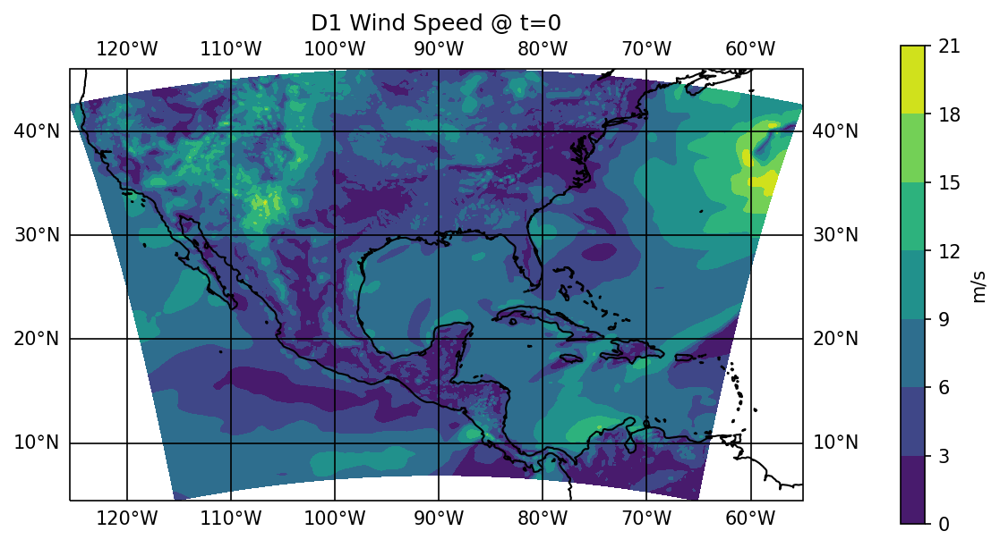

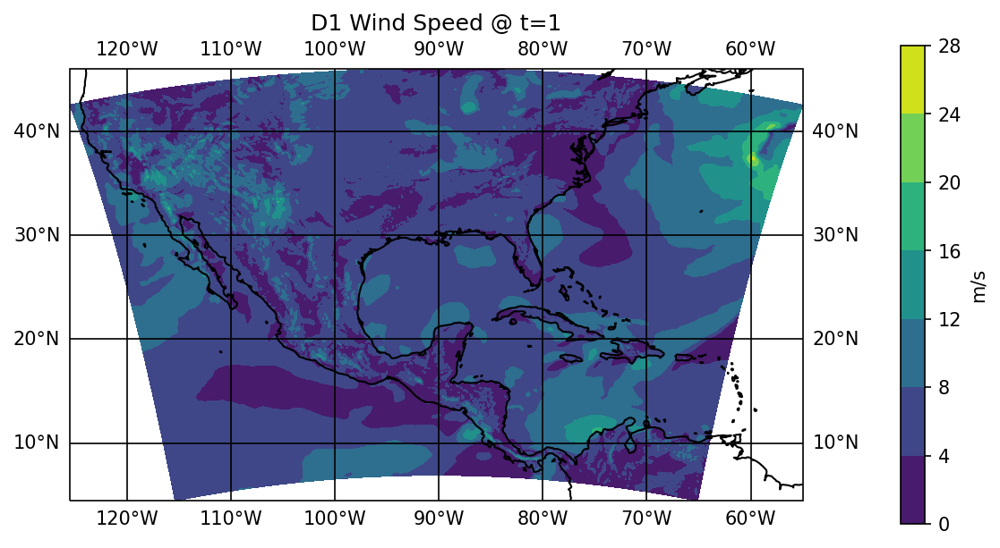

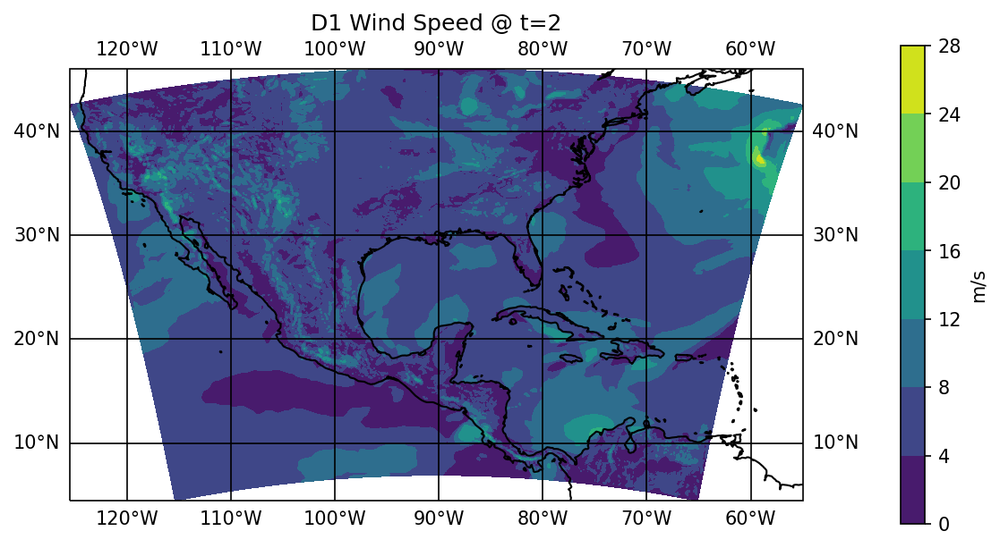

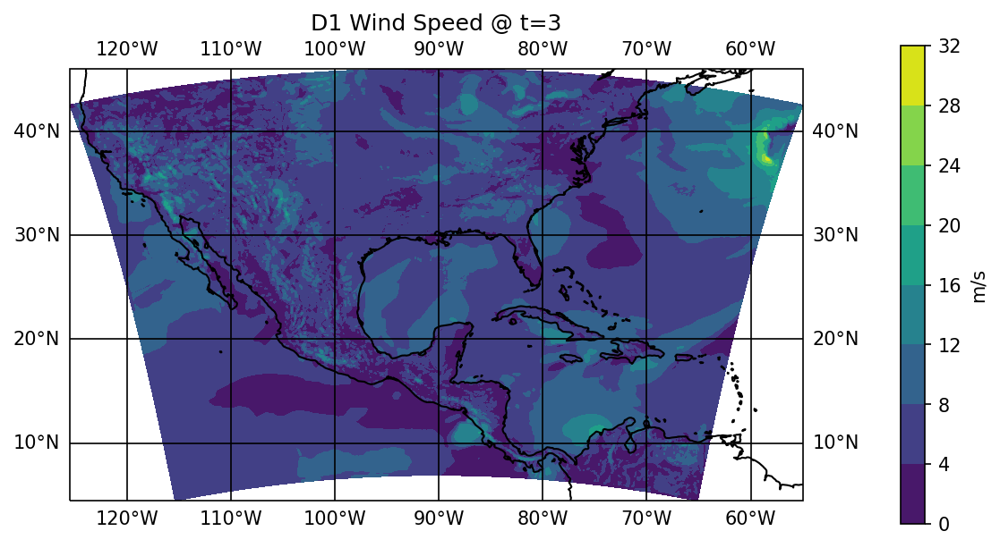

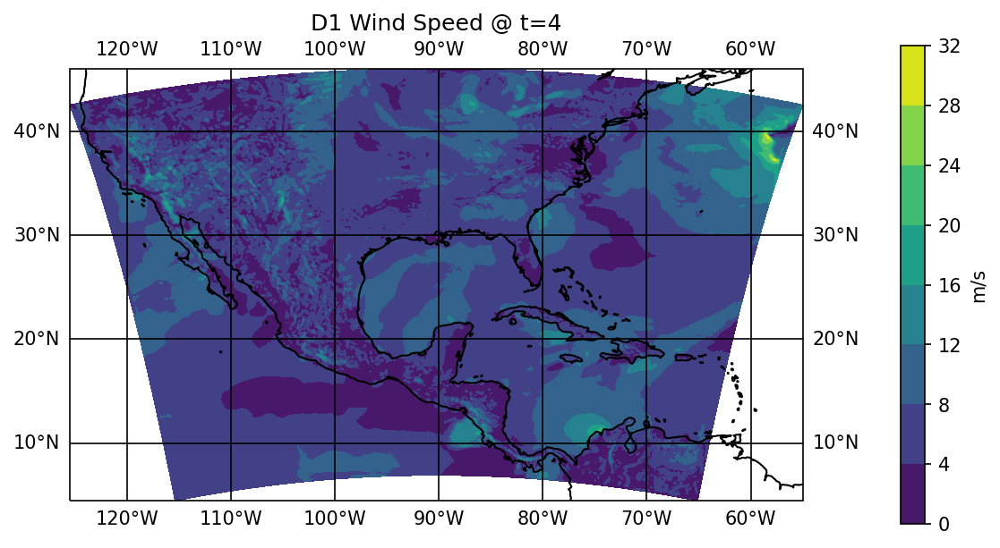

...

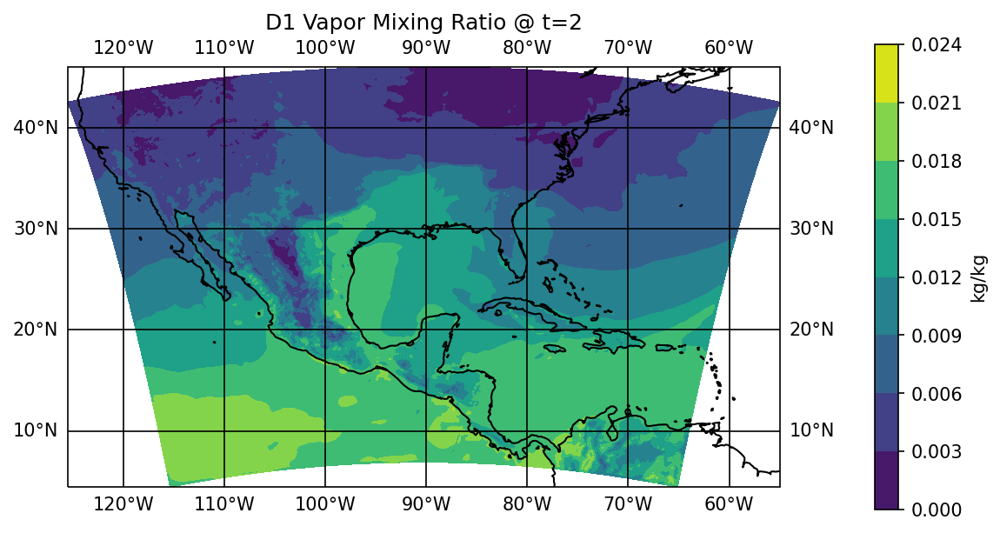

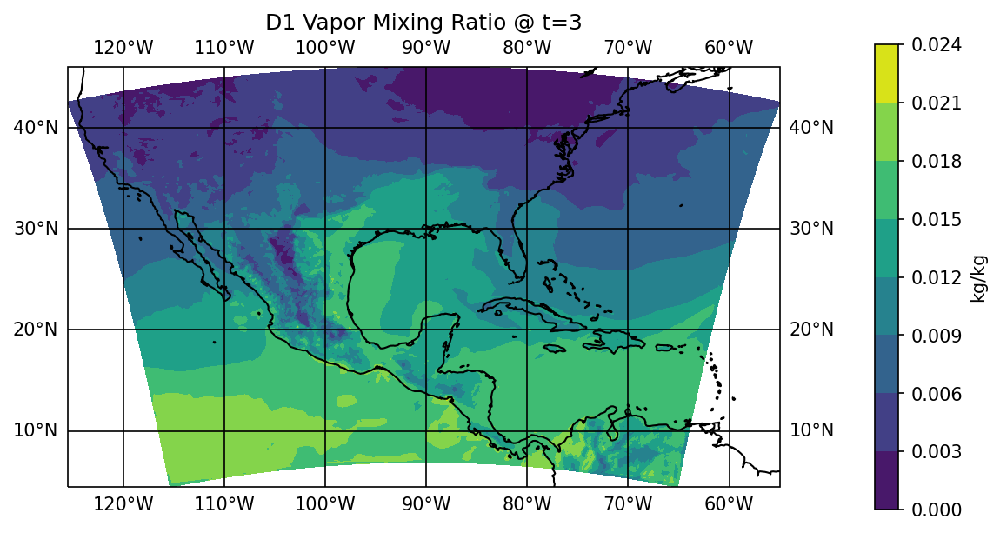

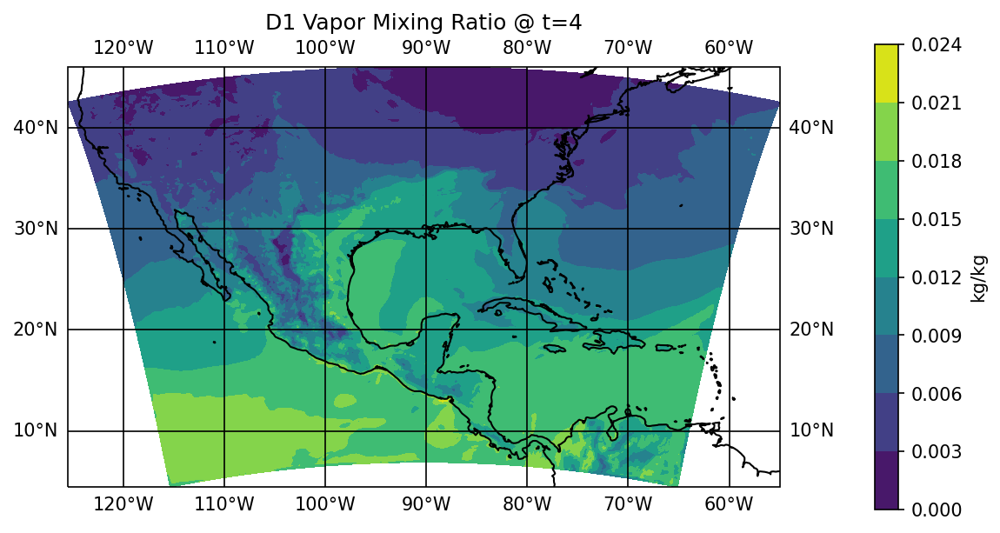

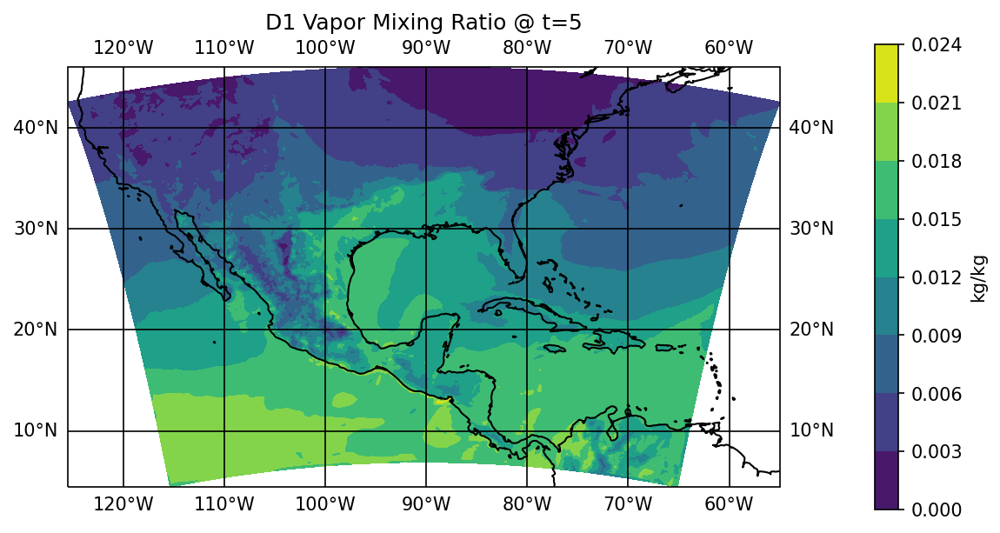

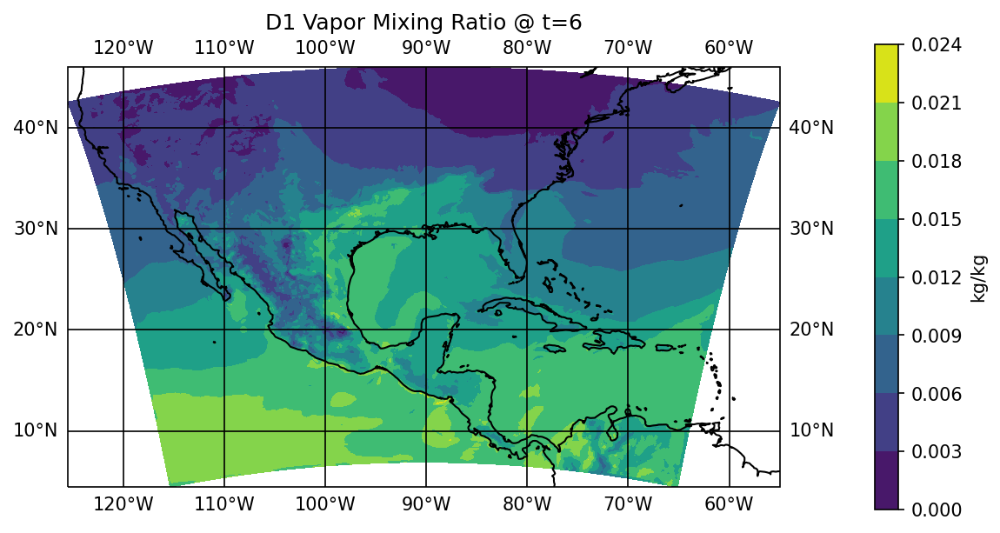

In [13]:
#wind speed
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], w_speed0_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Wind Speed @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_WindSpeed0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], w_speed1_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Wind Speed @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_WindSpeed1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], w_speed2_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Wind Speed @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_WindSpeed2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], w_speed3_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Wind Speed @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_WindSpeed3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], w_speed4_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Wind Speed @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_WindSpeed4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], w_speed5_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Wind Speed @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_WindSpeed5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], w_speed6_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Wind Speed @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_WindSpeed6.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
#PBLH
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], pblh0_1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 PBL Height @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_PBLH_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], pblh1_1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 PBL Height @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_PBLH_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], pblh2_1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 PBL Height @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_PBLH_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], pblh3_1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 PBL Height @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_PBLH_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], pblh4_1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 PBL Height @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_PBLH_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], pblh5_1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 PBL Height @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_PBLH_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], pblh6_1[:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 PBL Height @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_PBLH_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''

#Vapor Mixing Ratio
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], qv0_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Vapor Mixing Ratio @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_QV_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], qv1_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Vapor Mixing Ratio @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_QV_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], qv2_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Vapor Mixing Ratio @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_QV_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], qv3_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Vapor Mixing Ratio @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_QV_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], qv4_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Vapor Mixing Ratio @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_QV_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], qv5_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Vapor Mixing Ratio @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_QV_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], qv6_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('D1 Vapor Mixing Ratio @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_QV_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

In [14]:
#Potential temperature (perturbation plus reference temperature)

pert_t0_1 =getvar(wrfout0_1, 'T')
pert_t1_1 =getvar(wrfout1_1, 'T')
pert_t2_1 =getvar(wrfout2_1, 'T')
pert_t3_1 =getvar(wrfout3_1, 'T')
pert_t4_1 =getvar(wrfout4_1, 'T')
pert_t5_1 =getvar(wrfout5_1, 'T')
pert_t6_1 =getvar(wrfout6_1, 'T')

#'T00': <class 'netCDF4._netCDF4.Variable'>
#float32 T00(Time)
#    FieldType: 104
#    MemoryOrder: 0  
#    description: BASE STATE TEMPERATURE
#    units: K
#    stagger: 
#unlimited dimensions: Time

#reference T
ref_t0_1 =getvar(wrfout0_1, 'T00')
ref_t1_1 =getvar(wrfout1_1, 'T00')
ref_t2_1 =getvar(wrfout2_1, 'T00')
ref_t3_1 =getvar(wrfout3_1, 'T00')
ref_t4_1 =getvar(wrfout4_1, 'T00')
ref_t5_1 =getvar(wrfout5_1, 'T00')
ref_t6_1 =getvar(wrfout6_1, 'T00')

#full T
full_t0_1 = pert_t0_1 + ref_t0_1 
full_t1_1 = pert_t1_1 + ref_t1_1 
full_t2_1 = pert_t2_1 + ref_t2_1
full_t3_1 = pert_t3_1 + ref_t3_1 
full_t4_1 = pert_t4_1 + ref_t4_1 
full_t5_1 = pert_t5_1 + ref_t5_1
full_t6_1 = pert_t6_1 + ref_t6_1

pert_p0_1 = getvar(wrfout0_1, 'P')
pert_p1_1 = getvar(wrfout1_1, 'P')
pert_p2_1 = getvar(wrfout2_1, 'P')
pert_p3_1 = getvar(wrfout3_1, 'P')
pert_p4_1 = getvar(wrfout4_1, 'P')
pert_p5_1 = getvar(wrfout5_1, 'P')
pert_p6_1= getvar(wrfout6_1, 'P')
#stagger:, 'P': <xarray.Variable (Time: 1, bottom_top: 49, south_north: 474, west_east: 639
#description:  perturbation pressure,    units:        Pa

base_p0_1 = getvar(wrfout0_1, 'P00')
base_p1_1 = getvar(wrfout1_1, 'P00')
base_p2_1 = getvar(wrfout2_1, 'P00')
base_p3_1 = getvar(wrfout3_1, 'P00')
base_p4_1 = getvar(wrfout4_1, 'P00')
base_p5_1 = getvar(wrfout5_1, 'P00')
base_p6_1= getvar(wrfout6_1, 'P00')
#stagger:      , 'P00': <xarray.Variable (Time: 1)>
#description:  BASE STATE PRESSURE,    units:        Pa

full_p0_1 = pert_p0_1 + base_p0_1 
full_p1_1 = pert_p1_1 + base_p1_1 
full_p2_1 = pert_p2_1 + base_p2_1 
full_p3_1 = pert_p3_1 + base_p3_1 
full_p4_1 = pert_p4_1 + base_p4_1 
full_p5_1 = pert_p5_1 + base_p5_1
full_p6_1 = pert_p6_1 + base_p6_1

#wrf.tk(pres, theta, meta=True, units='K')
temp0_1 = wrf.tk(full_p0_1, full_t0_1, meta=True, units='K')
temp1_1 = wrf.tk(full_p1_1, full_t1_1, meta=True, units='K')
temp2_1 = wrf.tk(full_p2_1, full_t2_1, meta=True, units='K')
temp3_1 = wrf.tk(full_p3_1, full_t3_1, meta=True, units='K')
temp4_1 = wrf.tk(full_p4_1, full_t4_1, meta=True, units='K')
temp5_1 = wrf.tk(full_p5_1, full_t5_1, meta=True, units='K')
temp6_1= wrf.tk(full_p6_1, full_t6_1, meta=True, units='K')

#qv = Water vapor mixing ratio in [kg/kg] with at least three dimensions. The rightmost dimensions are bottom_top x south_north x west_east.
#pres = Full pressure (perturbation + base state pressure) in [Pa] with the same dimensionality as qv.
#tkel = Temperature in [K] with same dimensionality as qv.

#get equiv. pot. temp
thetae0_1 = wrf.eth(qv0_1, temp0_1, full_p0_1, meta=True, units='K')
thetae1_1 = wrf.eth(qv1_1, temp1_1, full_p1_1, meta=True, units='K')
thetae2_1 = wrf.eth(qv2_1, temp2_1, full_p2_1, meta=True, units='K')
thetae3_1 = wrf.eth(qv3_1, temp3_1, full_p3_1, meta=True, units='K')
thetae4_1 = wrf.eth(qv4_1, temp4_1, full_p4_1, meta=True, units='K')
thetae5_1 = wrf.eth(qv5_1, temp5_1, full_p5_1, meta=True, units='K')
thetae6_1 = wrf.eth(qv6_1, temp6_1, full_p6_1, meta=True, units='K')

print('theta e shape: ', thetae0_1.shape)
print('temperature shape: ', temp0_1.shape)

#vertical velocity 
#'W': <class 'netCDF4._netCDF4.Variable'>
#float32 W(Time, bottom_top_stag, south_north, west_east)
#    FieldType: 104
#    MemoryOrder: XYZ
#    description: z-wind component
#    units: m s-1
#    stagger: Z
#    coordinates: XLONG XLAT XTIME
#unlimited dimensions: Time
#current shape = (1, 50, 474, 639)

#get W
w_wind0_1 = getvar(wrfout0_1, "W")
w_wind1_1 = getvar(wrfout1_1, "W")
w_wind2_1 = getvar(wrfout2_1, "W")
w_wind3_1 = getvar(wrfout3_1, "W")
w_wind4_1 = getvar(wrfout4_1, "W")
w_wind5_1 = getvar(wrfout5_1, "W")
w_wind6_1 = getvar(wrfout6_1, "W")
print('vert. vel. shape: ', w_wind0_1.shape)

#unstagger _bottom_top
#xlatv_destag1 = wrf.destagger(xlatv1, stagger_dim =0)
w_wind0_destag_1 = wrf.destagger(w_wind0_1, stagger_dim =0)
w_wind1_destag_1 = wrf.destagger(w_wind1_1, stagger_dim =0)
w_wind2_destag_1 = wrf.destagger(w_wind2_1, stagger_dim =0)
w_wind3_destag_1 = wrf.destagger(w_wind3_1, stagger_dim =0)
w_wind4_destag_1 = wrf.destagger(w_wind4_1, stagger_dim =0)
w_wind5_destag_1 = wrf.destagger(w_wind5_1, stagger_dim =0)
w_wind6_destag_1 = wrf.destagger(w_wind6_1, stagger_dim =0)

print('vert. vel. destag: ', w_wind0_destag_1.shape)

theta e shape:  (49, 495, 662)
temperature shape:  (49, 495, 662)
vert. vel. shape:  (50, 495, 662)
vert. vel. destag:  (49, 495, 662)


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


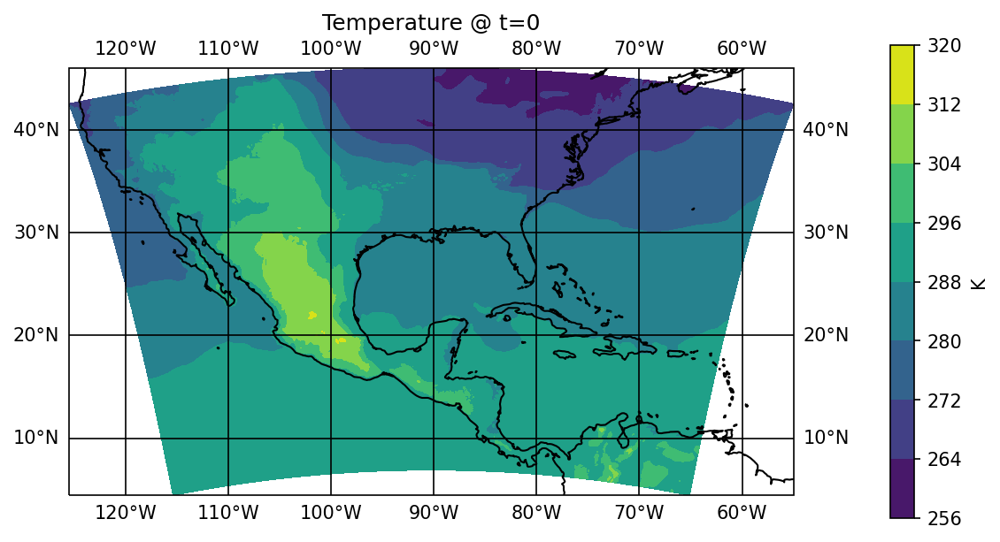

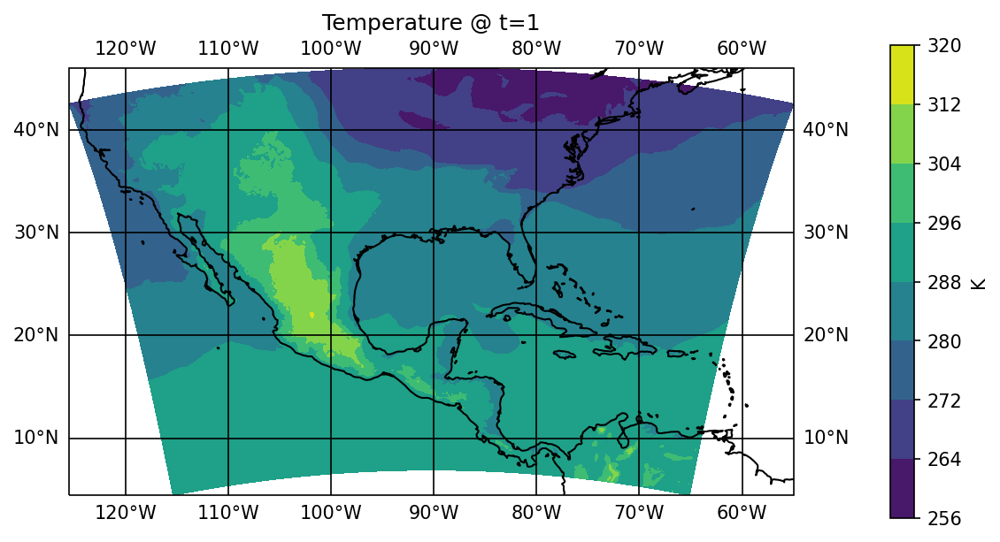

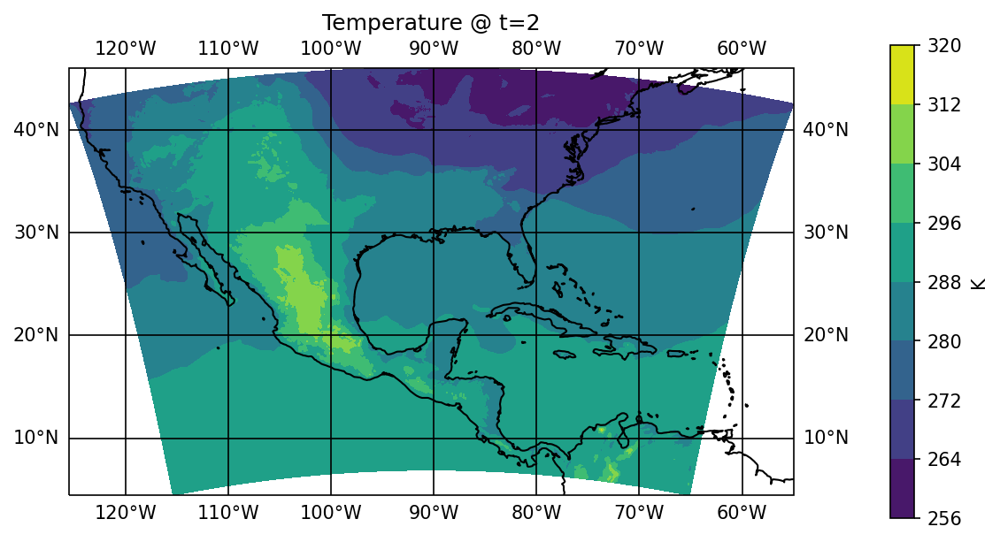

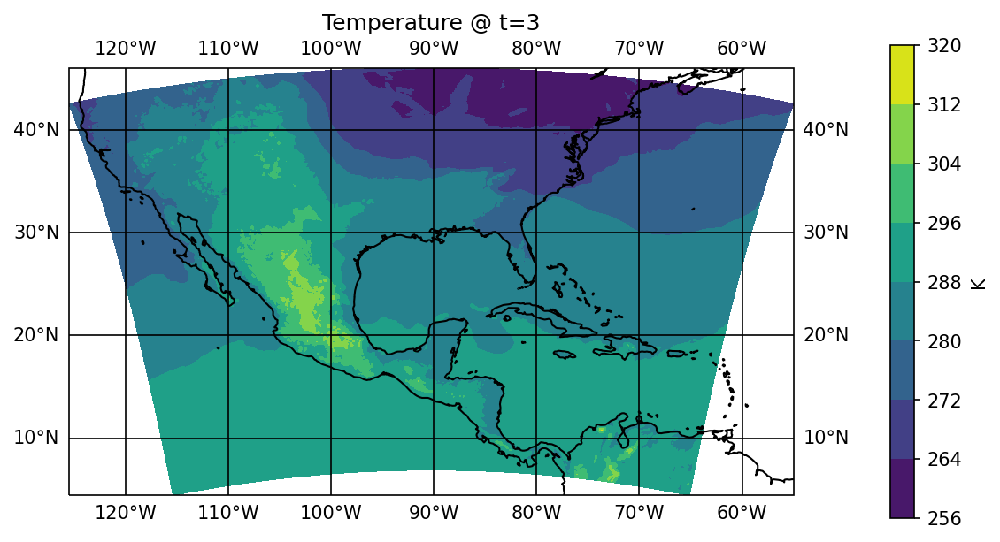

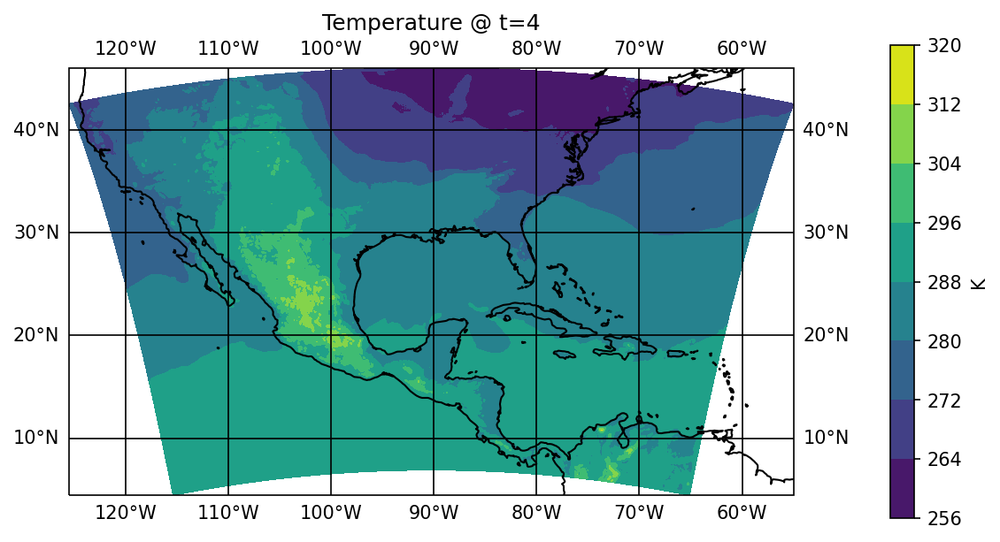

...

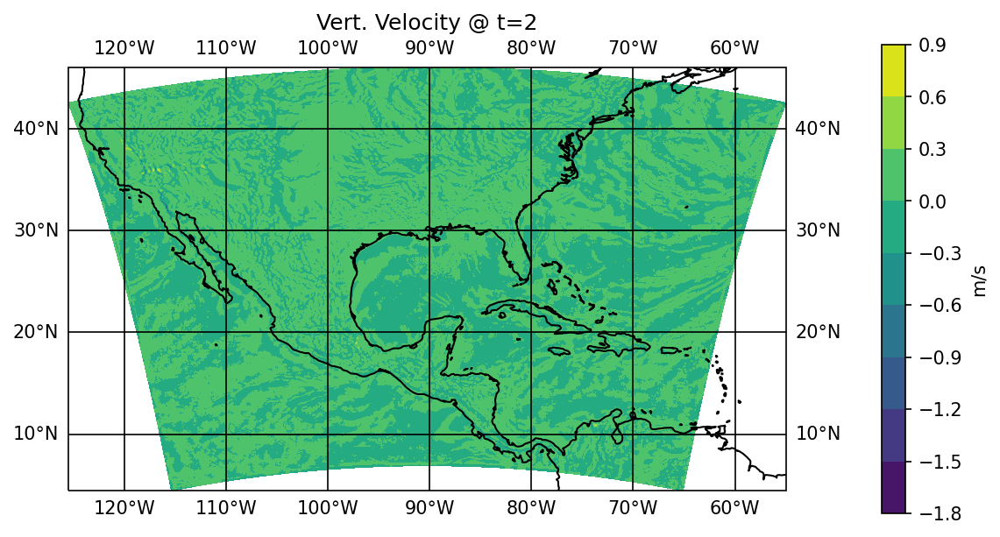

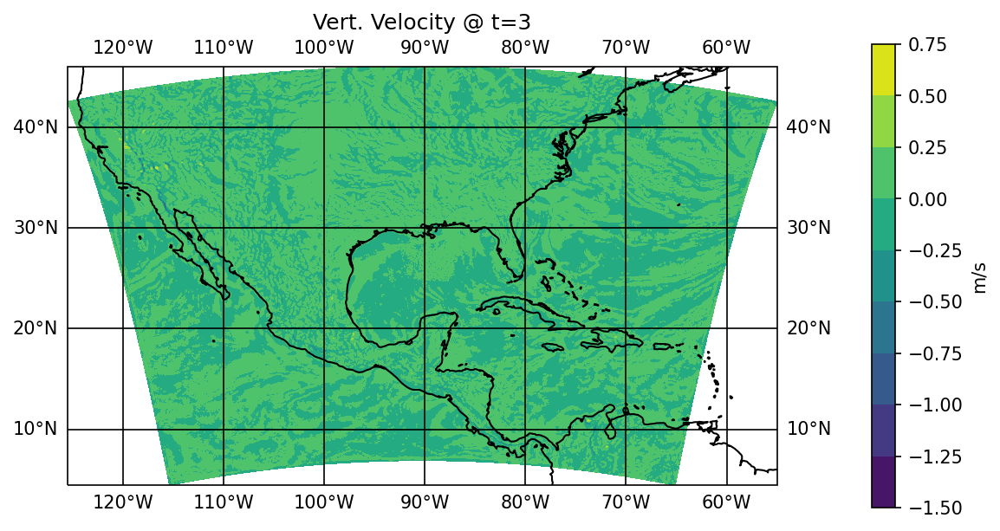

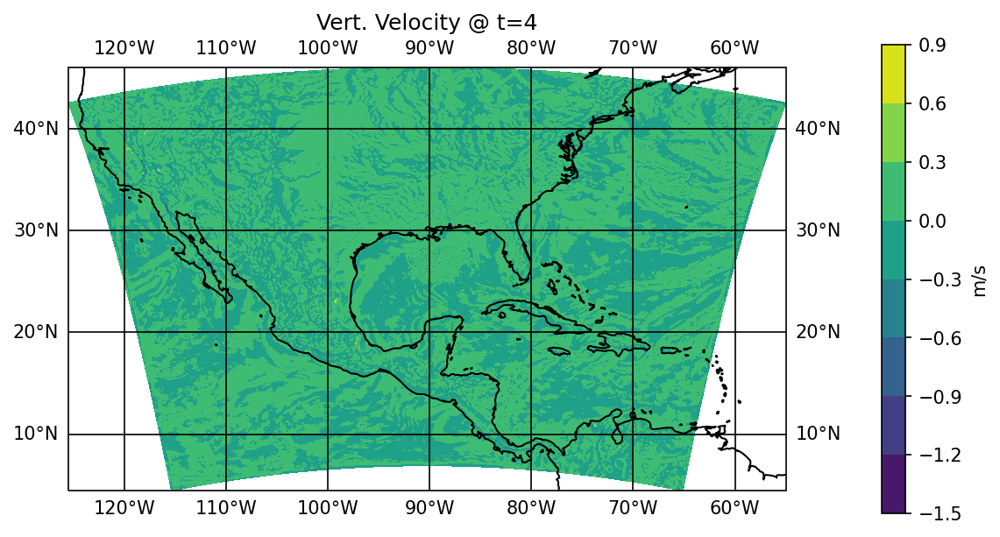

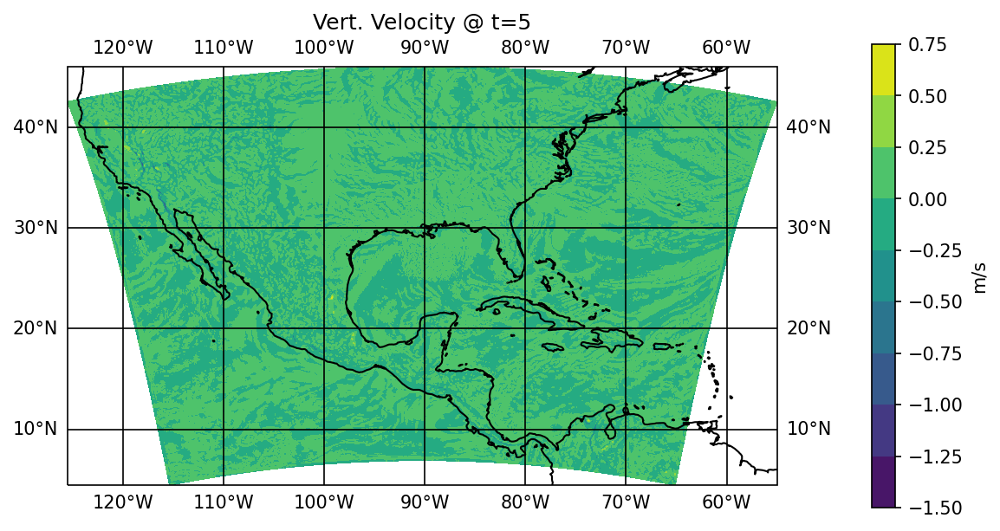

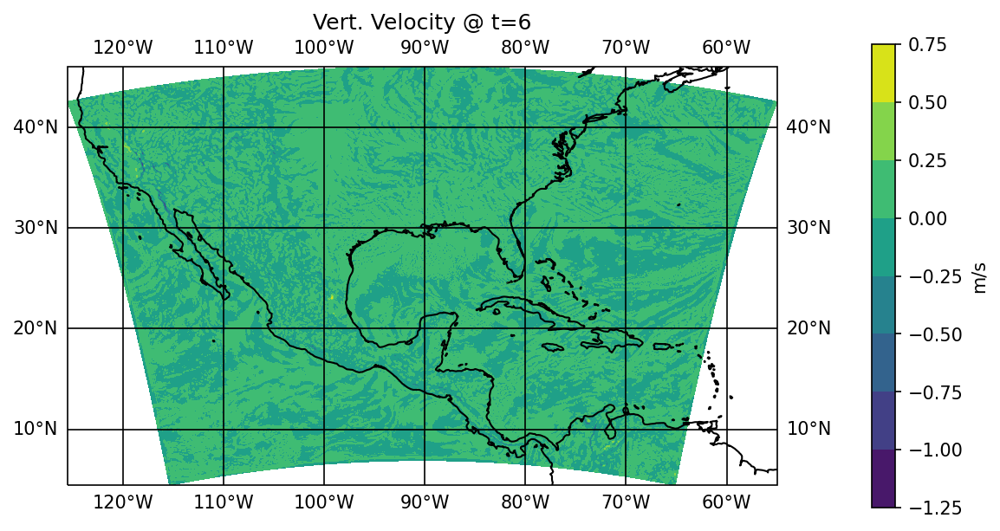

In [15]:

#TEMP
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], temp0_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Temp_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], temp1_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Temp_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], temp2_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Temp_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], temp3_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Temp_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], temp4_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Temp_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], temp5_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Temp_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], temp6_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Temperature @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Temp_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#THETAE
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], thetae0_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Thetae_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], thetae1_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Thetae_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], thetae2_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Thetae_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], thetae3_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Thetae_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], thetae4_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Thetae_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], thetae5_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Thetae_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], thetae6_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Equivolent Pot.Temp. @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_Thetae_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], w_wind0_destag_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], w_wind1_destag_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], w_wind2_destag_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], w_wind3_destag_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], w_wind4_destag_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], w_wind5_destag_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], w_wind6_destag_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/'
plt.savefig(save_results_to + 'D1_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

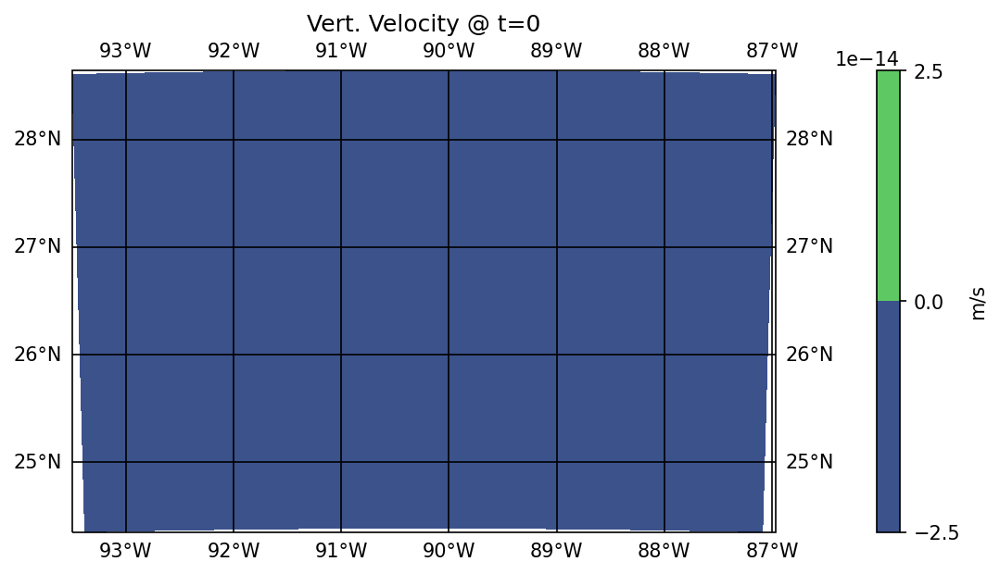

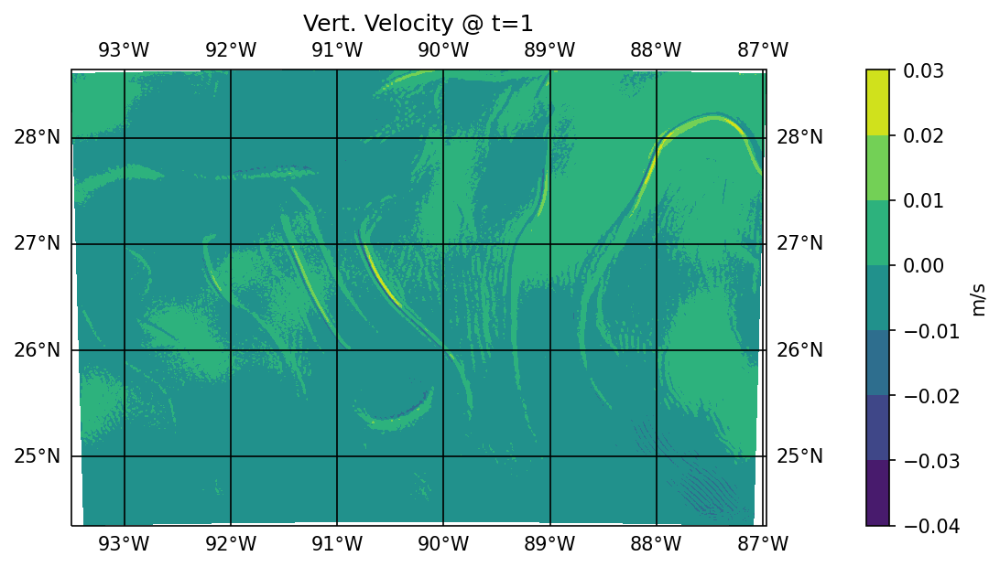

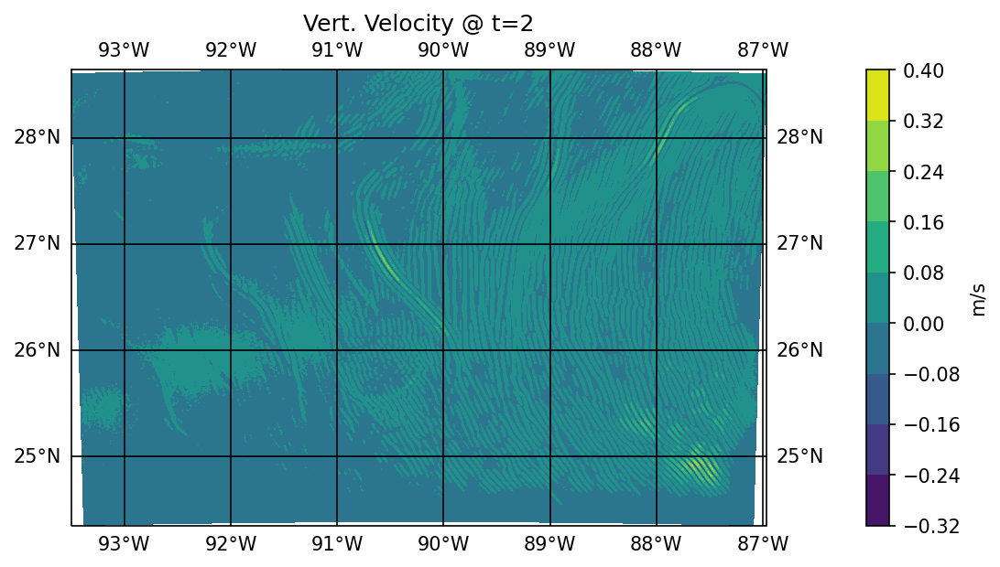

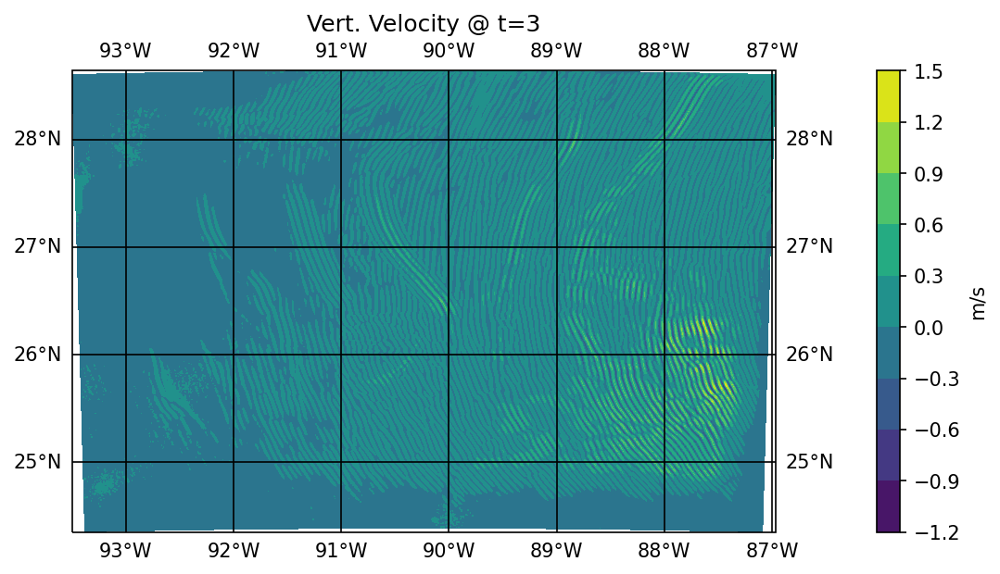

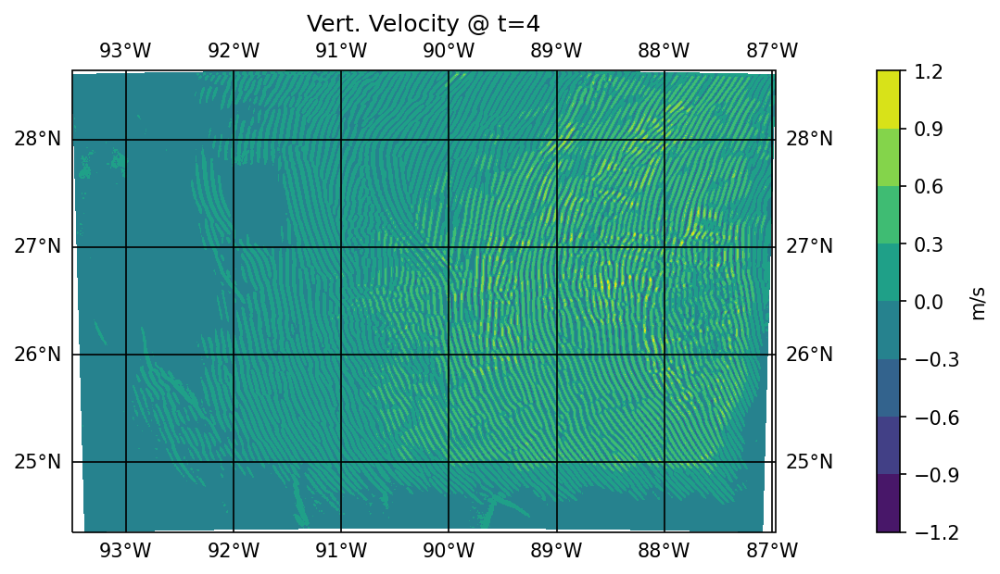

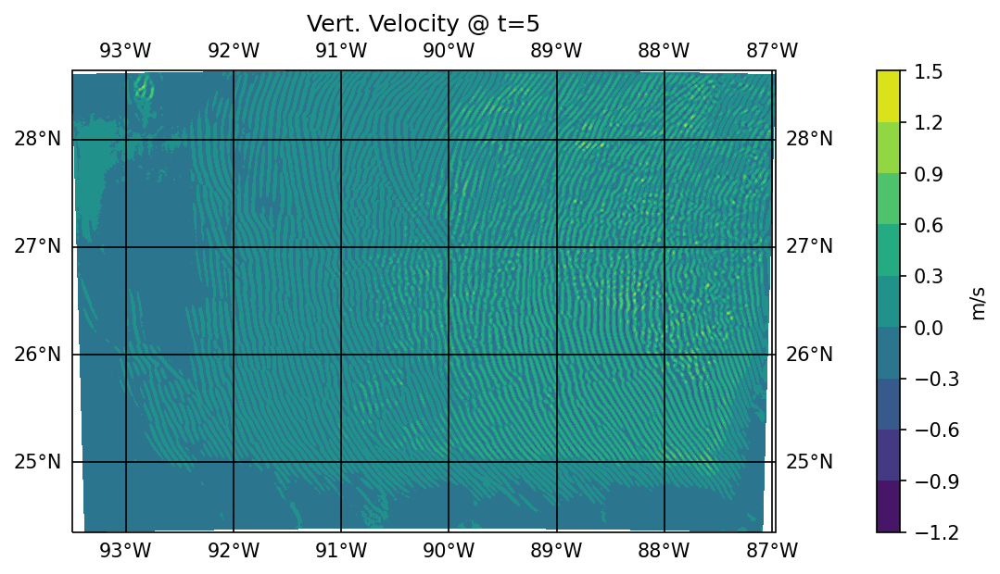

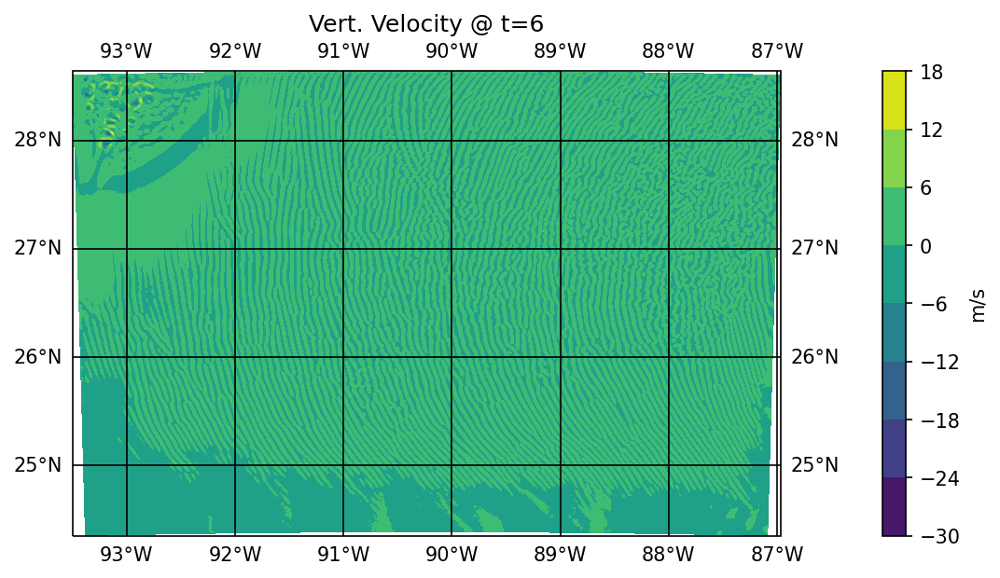

In [11]:
#vertical velocity at Eta =5 
'''
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], w_wind0_destag_1[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'D1_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], w_wind1_destag_1[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D1_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], w_wind2_destag_1[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D1_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], w_wind3_destag_1[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D1_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], w_wind4_destag_1[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D1_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], w_wind5_destag_1[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D1_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], w_wind6_destag_1[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D1_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()


#D2
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], w_wind0_destag_2[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D2_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], w_wind1_destag_2[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D2_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], w_wind3_destag_2[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D2_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], w_wind4_destag_2[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D2_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], w_wind5_destag_2[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D2_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], w_wind6_destag_2[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_D2_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''

#D3
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], w_wind0_destag[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta5_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], w_wind1_destag[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta5_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], w_wind2_destag[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta5_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], w_wind3_destag[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta5_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], w_wind4_destag[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta5_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], w_wind5_destag[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta5_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], w_wind6_destag[5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta5_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

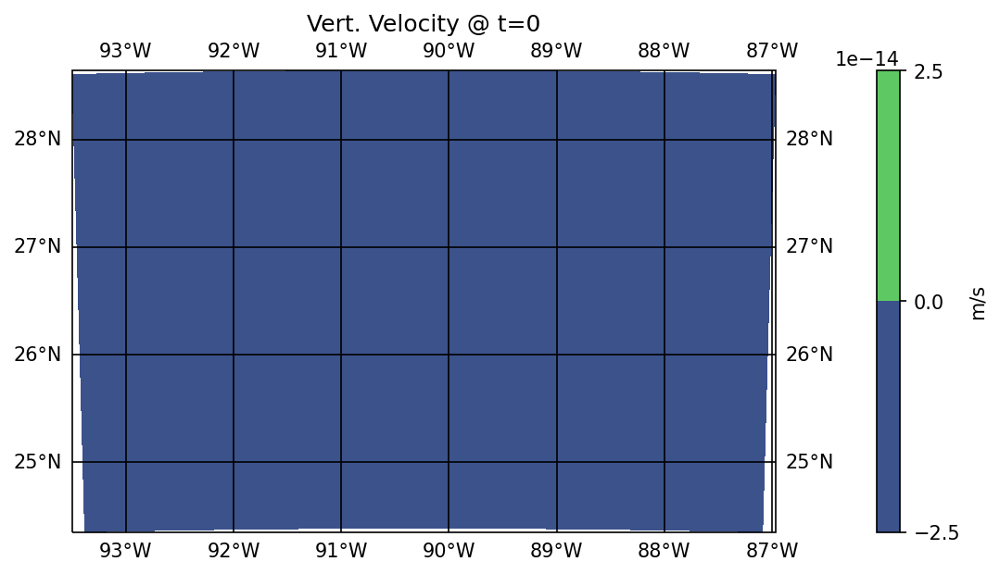

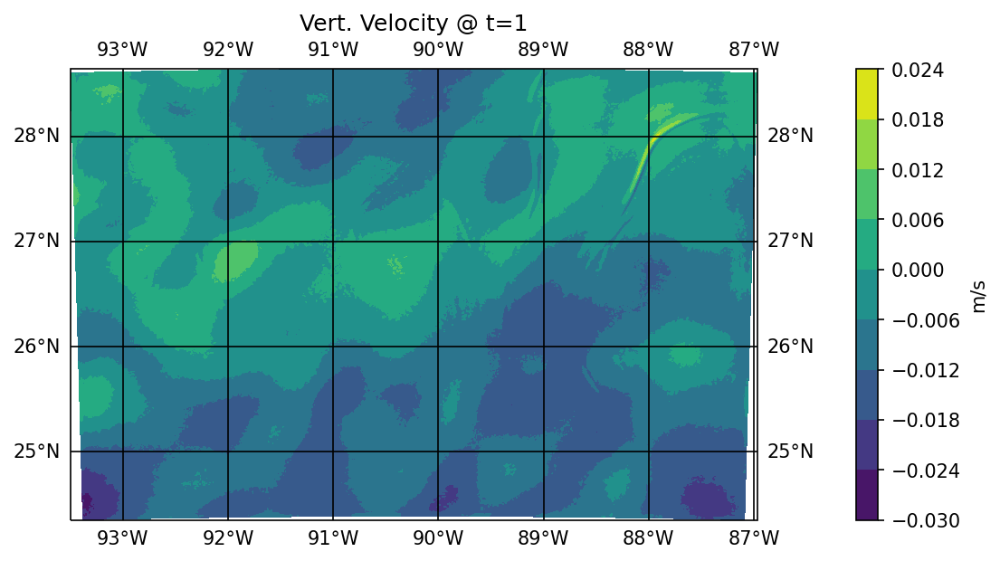

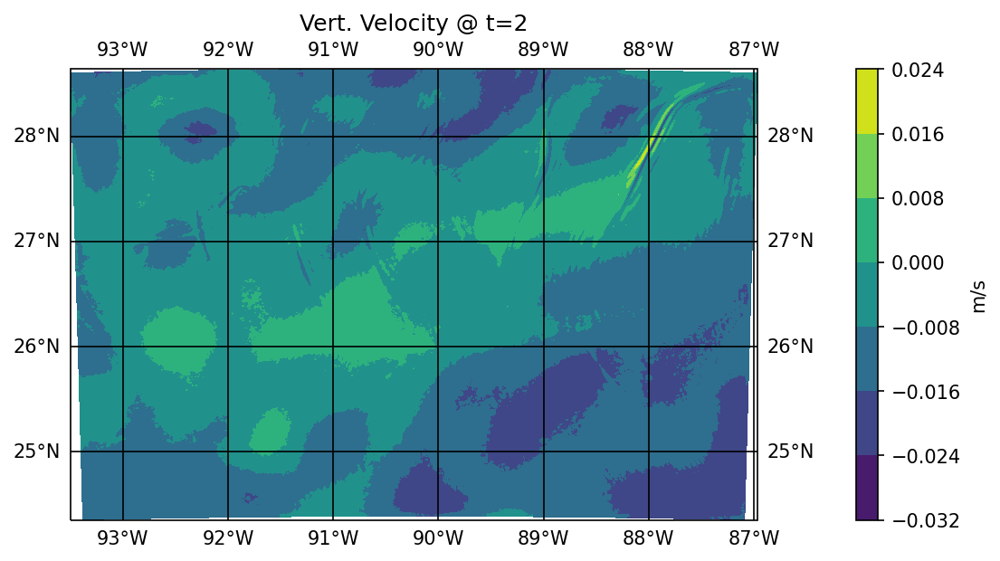

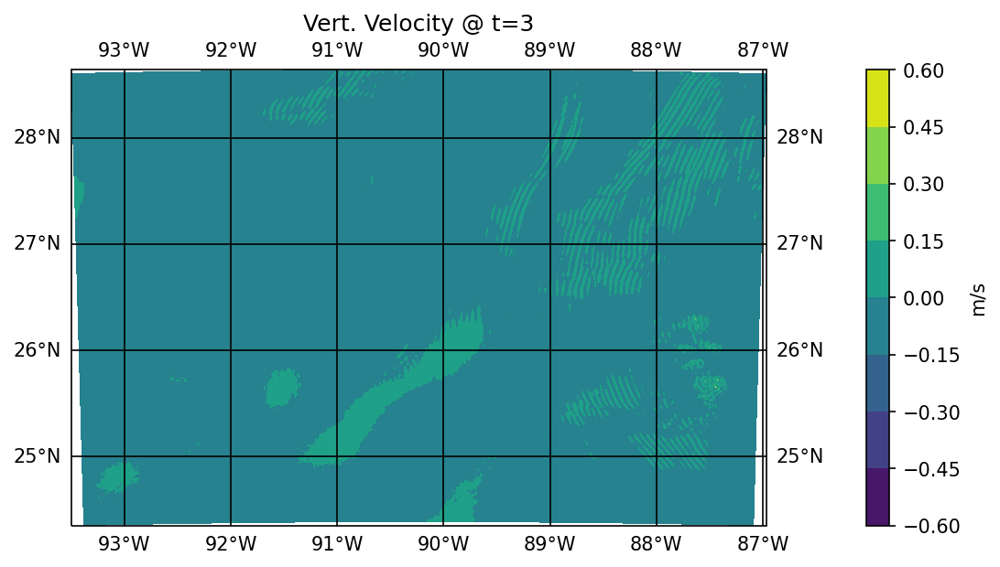

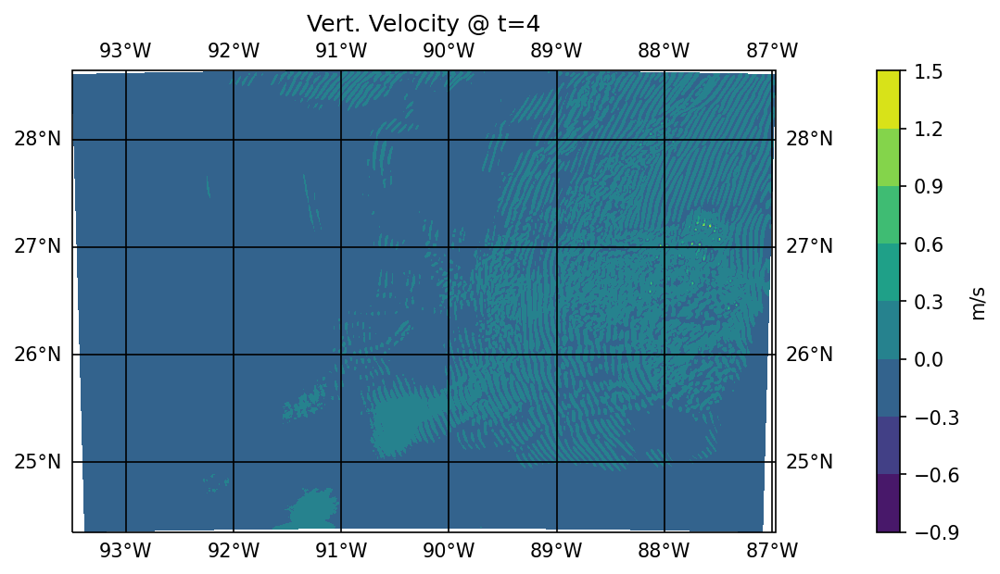

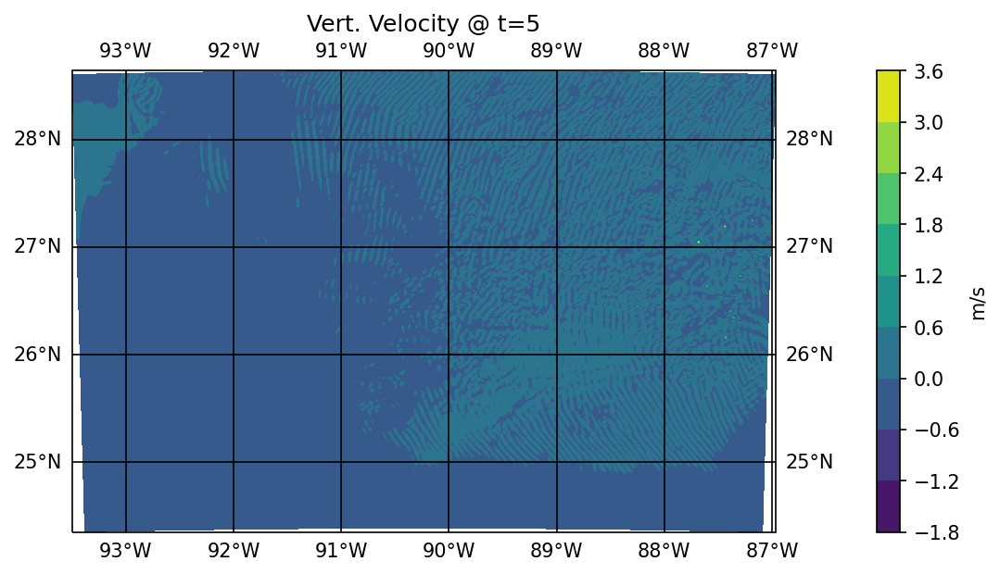

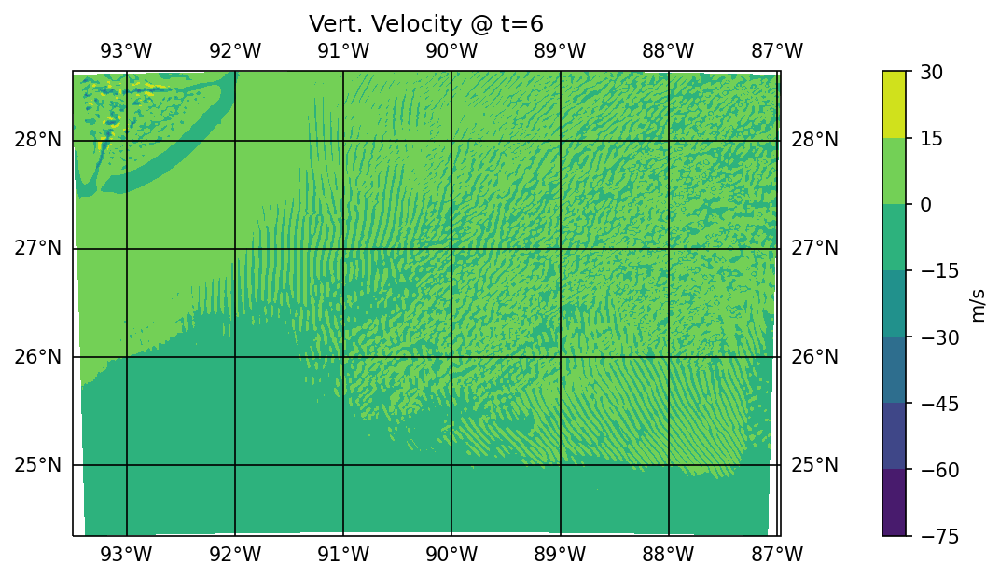

In [12]:
#vertical velocity at Eta =15 
'''
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], w_wind0_destag_1[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D1_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], w_wind1_destag_1[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D1_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], w_wind2_destag_1[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D1_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], w_wind3_destag_1[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D1_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], w_wind4_destag_1[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
ssave_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D1_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], w_wind5_destag_1[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D1_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], w_wind6_destag_1[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D1_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()


#D2
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], w_wind0_destag_2[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D2_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], w_wind1_destag_2[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D2_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], w_wind3_destag_2[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D2_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], w_wind4_destag_2[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D2_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], w_wind5_destag_2[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D2_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], w_wind6_destag_2[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta15_D2_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

'''
#D3
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], w_wind0_destag[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta15_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], w_wind1_destag[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta15_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], w_wind2_destag[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta15_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], w_wind3_destag[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta15_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], w_wind4_destag[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta15_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], w_wind5_destag[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta15_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], w_wind6_destag[15,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta15_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

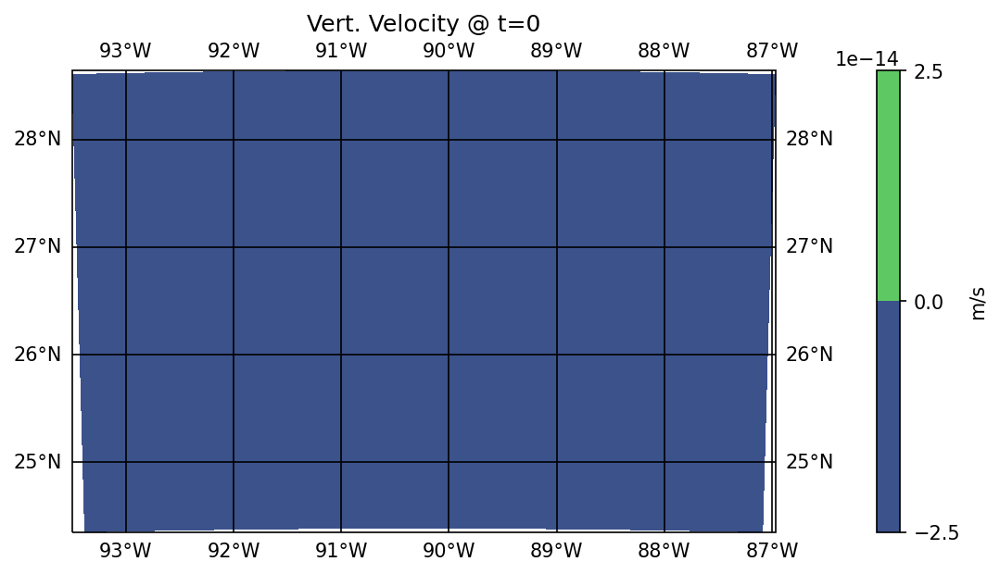

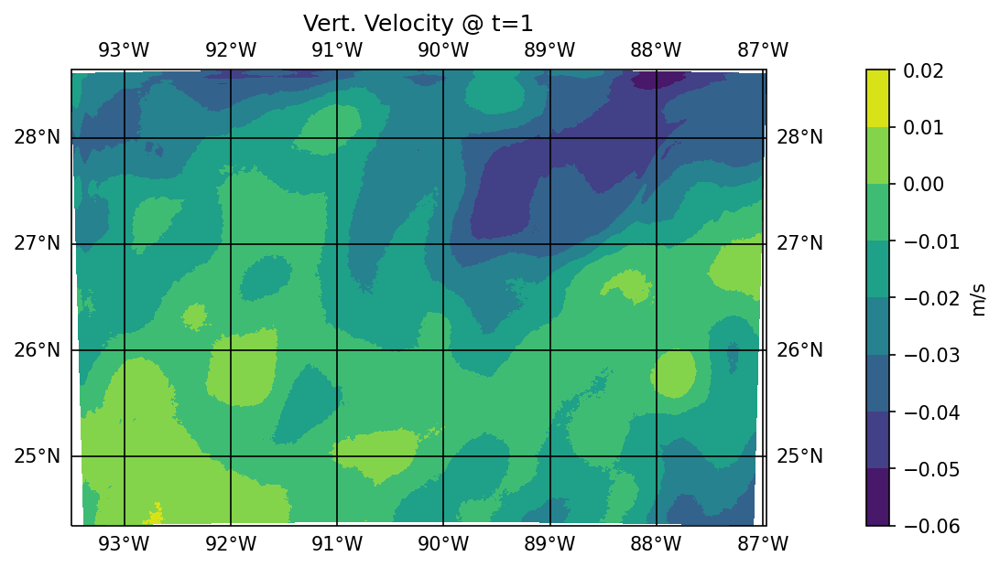

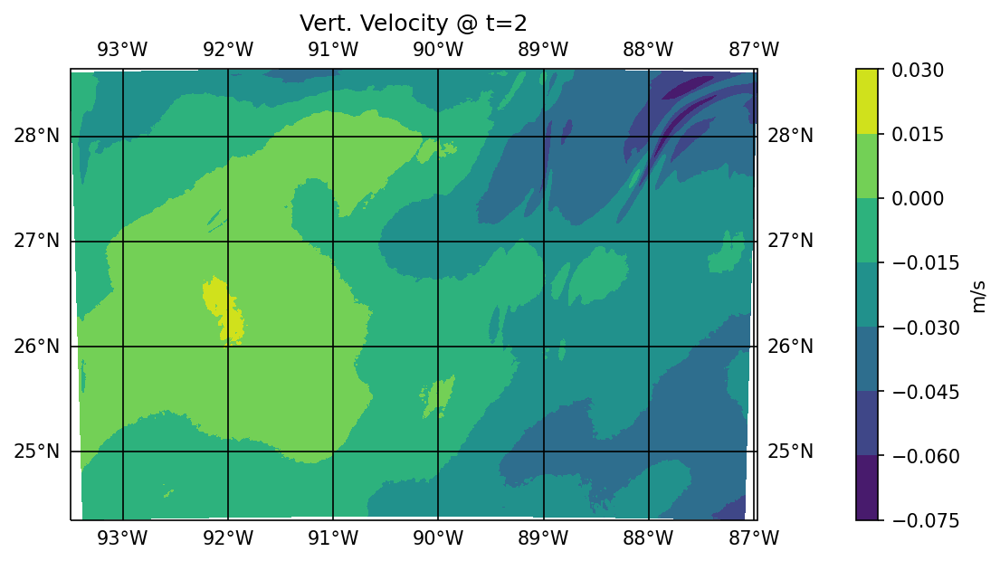

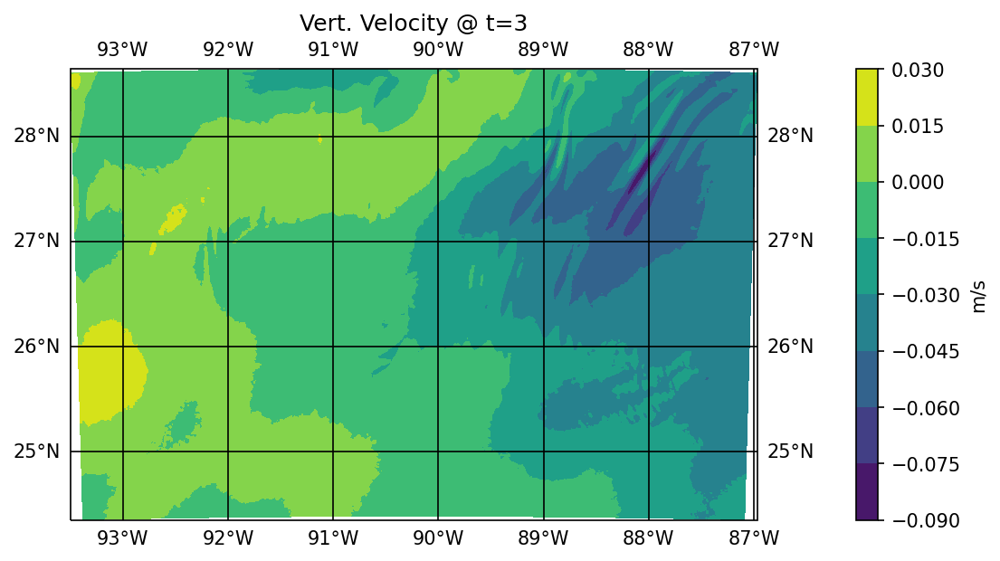

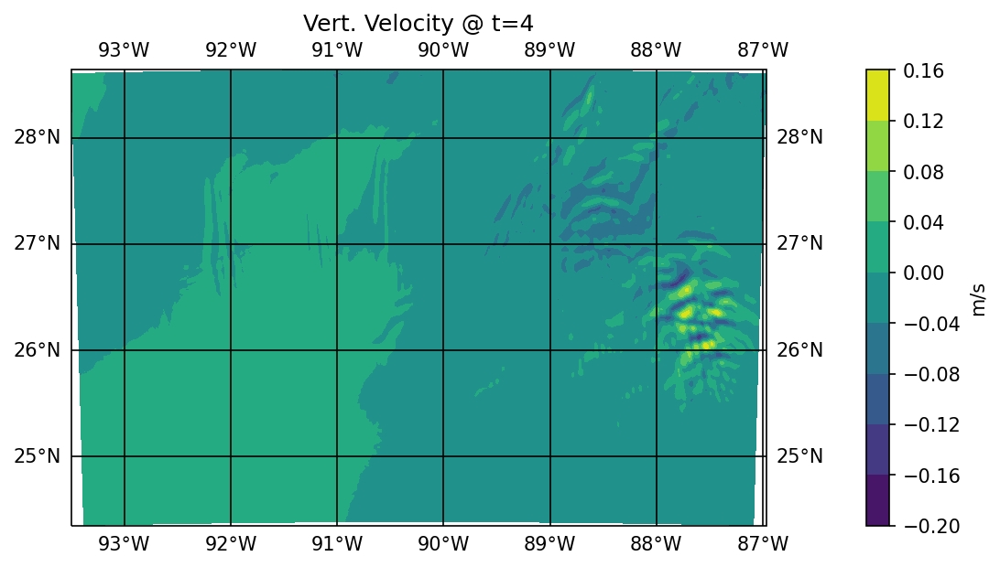

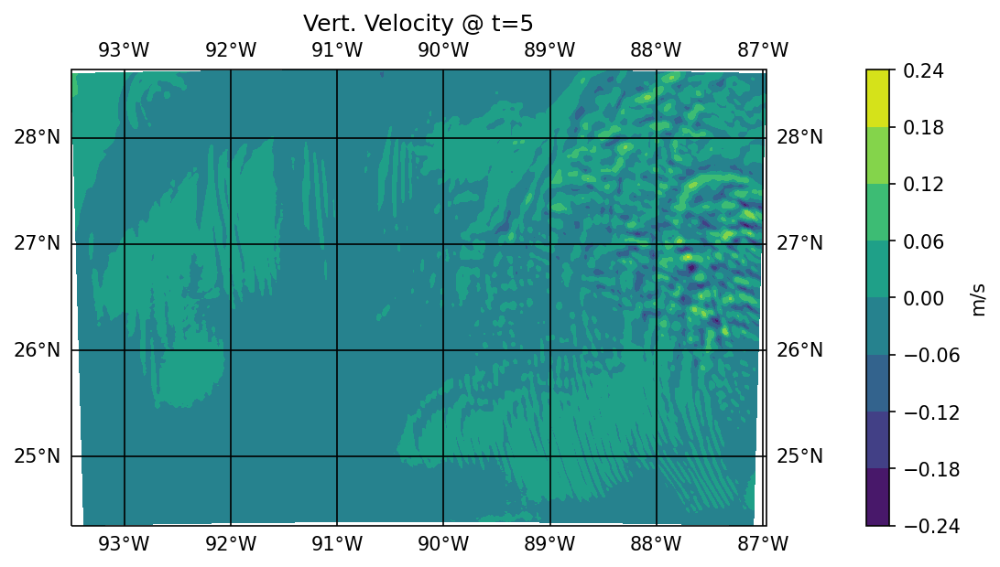

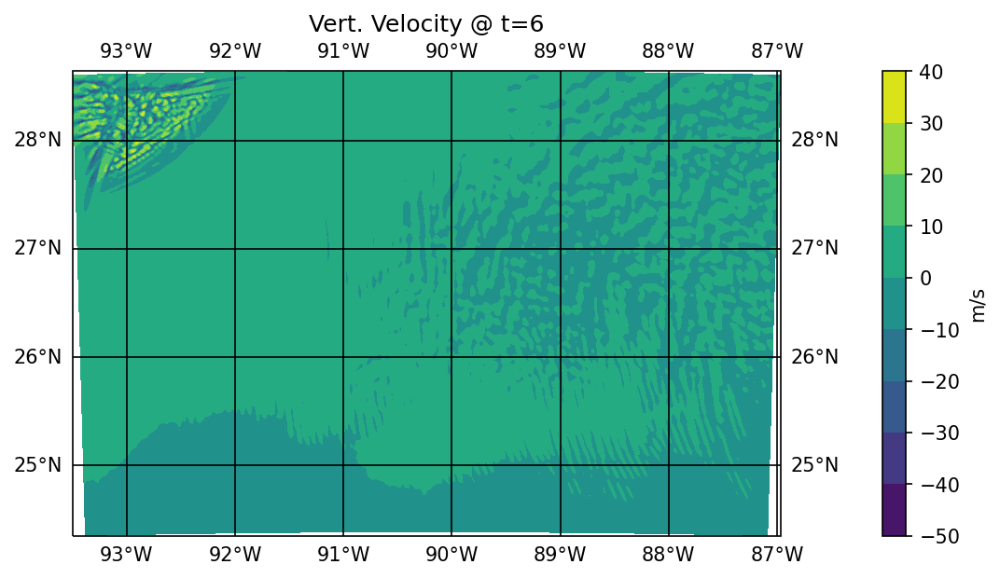

In [13]:
#vertical velocity at Eta =30 
'''
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], w_wind0_destag_1[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D1_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], w_wind1_destag_1[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D1_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], w_wind2_destag_1[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D1_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], w_wind3_destag_1[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D1_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], w_wind4_destag_1[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
ssave_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D1_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], w_wind5_destag_1[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D1_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], w_wind6_destag_1[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D1_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()


#D2
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], w_wind0_destag_2[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D2_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], w_wind1_destag_2[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D2_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], w_wind3_destag_2[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D2_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], w_wind4_destag_2[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D2_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], w_wind5_destag_2[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D2_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], w_wind6_destag_2[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta30_D2_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
#D3
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], w_wind0_destag[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta30_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], w_wind1_destag[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta30_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], w_wind2_destag[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta30_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], w_wind3_destag[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta30_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], w_wind4_destag[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta30_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], w_wind5_destag[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta30_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], w_wind6_destag[30,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta30_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

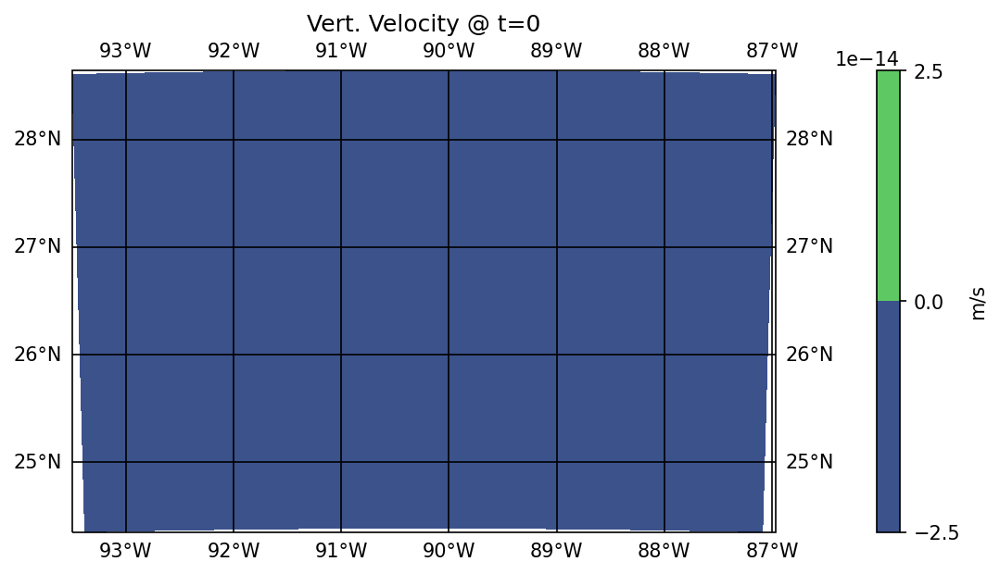

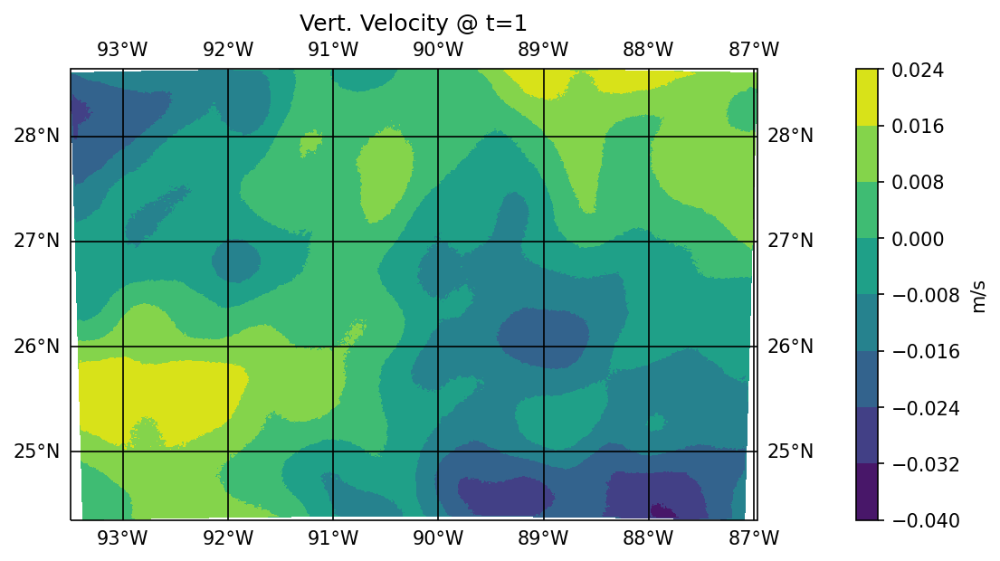

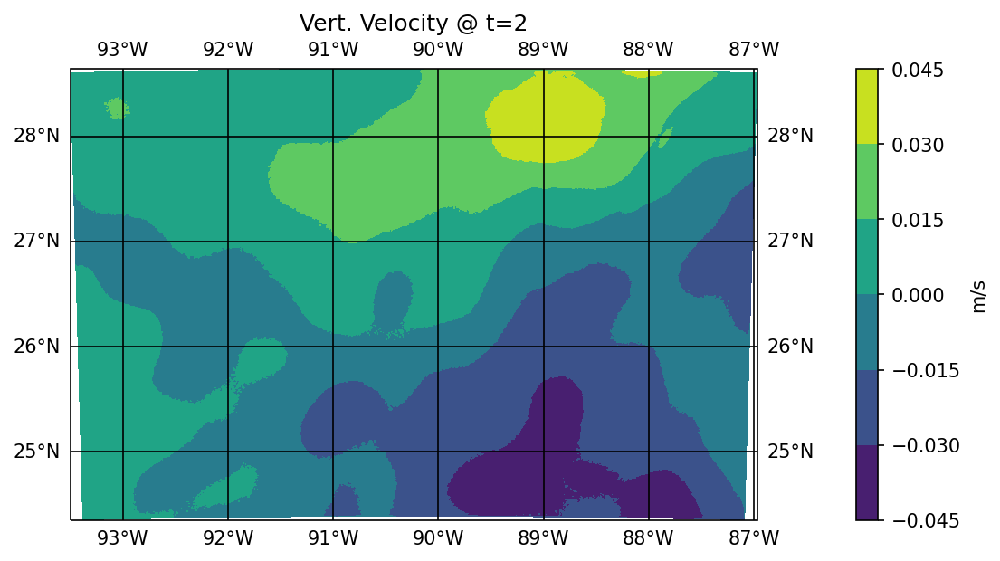

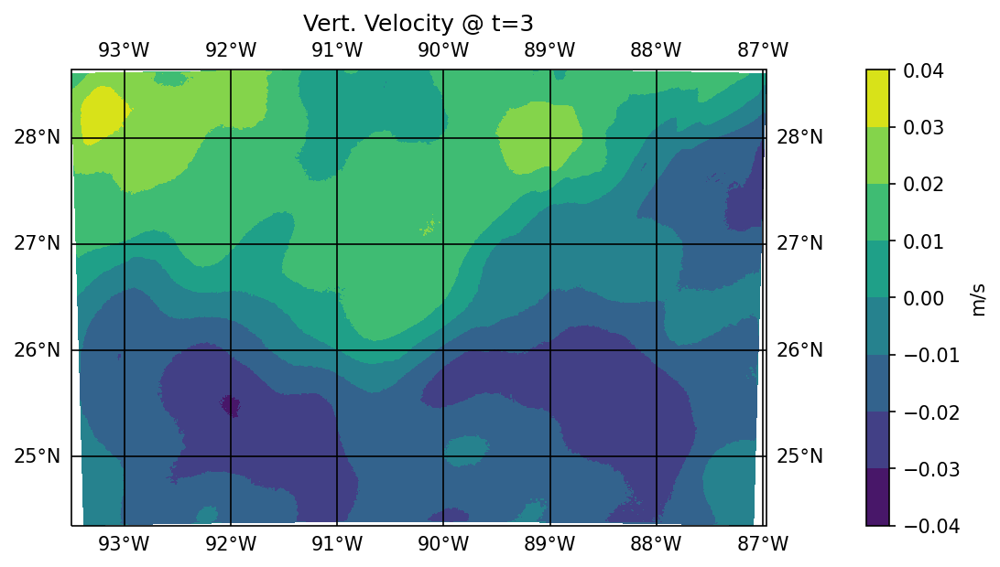

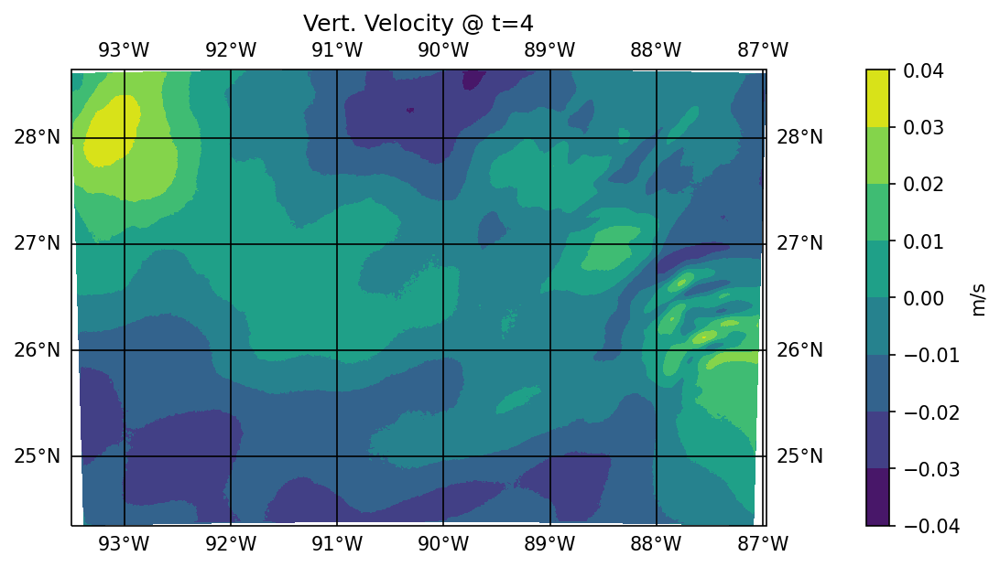

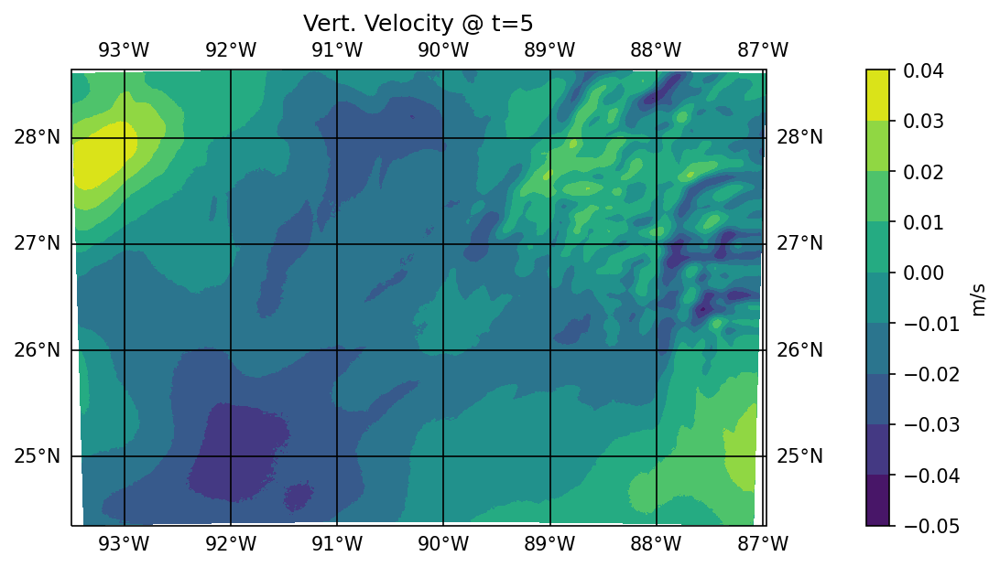

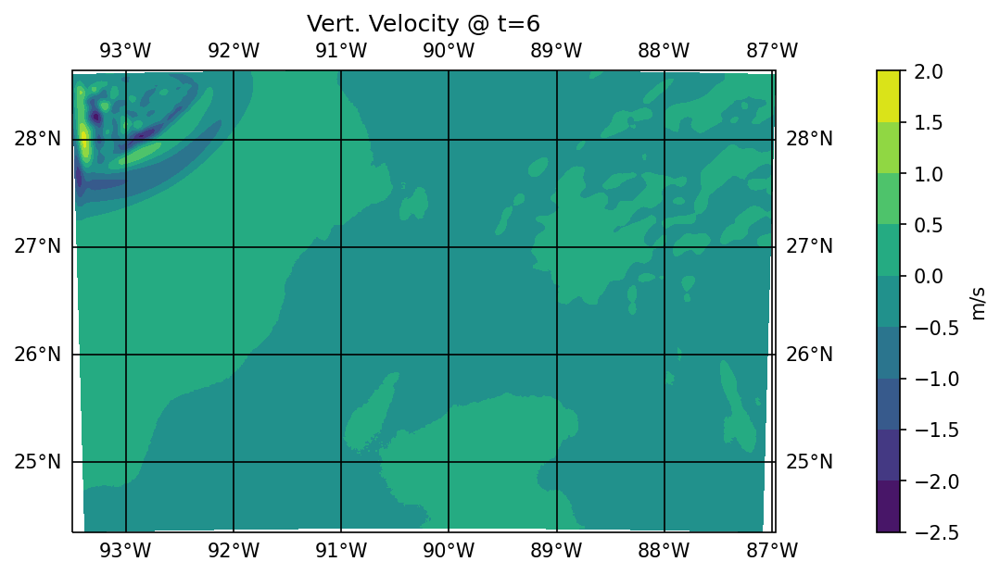

In [14]:
#vertical velocity at Eta =45 
'''
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_1[:,:], xlat0_1[:,:], w_wind0_destag_1[45 ,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D1_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_1[:,:], xlat1_1[:,:], w_wind1_destag_1[45 ,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D1_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2_1[:,:], xlat2_1[:,:], w_wind2_destag_1[45 ,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D1_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_1[:,:], xlat3_1[:,:], w_wind3_destag_1[45 ,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D1_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_1[:,:], xlat4_1[:,:], w_wind4_destag_1[45 ,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
ssave_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D1_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_1[:,:], xlat5_1[:,:], w_wind5_destag_1[45 ,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D1_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_1[:,:], xlat6_1[:,:], w_wind6_destag_1[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D1_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()


#D2
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0_2[:,:], xlat0_2[:,:], w_wind0_destag_2[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D2_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1_2[:,:], xlat1_2[:,:], w_wind1_destag_2[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D2_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3_2[:,:], xlat3_2[:,:], w_wind3_destag_2[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D2_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4_2[:,:], xlat4_2[:,:], w_wind4_destag_2[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D2_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5_2[:,:], xlat5_2[:,:], w_wind5_destag_2[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D2_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6_2[:,:], xlat6_2[:,:], w_wind6_destag_2[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/EtaLevels/'
plt.savefig(save_results_to + 'Eta45_D2_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

'''
#D3
#Vertical Velocity
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon0[:,:], xlat0[:,:], w_wind0_destag[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta45_w_0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon1[:,:], xlat1[:,:], w_wind1_destag[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta45_w_1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon2[:,:], xlat2[:,:], w_wind2_destag[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta45_w_2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon3[:,:], xlat3[:,:], w_wind3_destag[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta45_w_3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon4[:,:], xlat4[:,:], w_wind4_destag[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta45_w_4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon5[:,:], xlat5[:,:], w_wind5_destag[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta45_w_5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlon6[:,:], xlat6[:,:], w_wind6_destag[45,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vert. Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/May_23/'
plt.savefig(save_results_to + 'Eta45_w_6.png', bbox_inches = 'tight',dpi = 150)
plt.show()